<a href="https://colab.research.google.com/github/lbotello25/austin_airbnb_pricing/blob/main/Data_Cleaning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Import Libraries**

In [ ]:
install.packages('mosaic')
install.packages('patchwork')
install.packages('mgcv')
library(readr)
library(tidyverse)
library(dplyr)
library(tidyr)
library(ggplot2)
library(mosaic)
library(patchwork)
library(mgcv)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘plyr’, ‘Rcpp’, ‘tweenr’, ‘polyclip’, ‘RcppEigen’, ‘ggstance’, ‘ggridges’, ‘ggforce’, ‘labelled’, ‘ggformula’, ‘mosaicData’, ‘mosaicCore’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.4.0      ✔ dplyr   1.0.10
✔ tibble  3.1.8      ✔ stringr 1.4.1 
✔ tidyr   1.2.1      ✔ forcats 0.5.2 
✔ purrr   0.3.5      

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Registered S3 method overwritten by 'mosaic':
  method                           from   
  fortify

**Import Data**

In [ ]:
raw_listings = read_csv('austin_airbnb_listings.csv', show_col_types = FALSE)
raw_zip = read_csv('inventory_core_metrics_zip.csv', show_col_types = FALSE)

**Create Dataframes and Clean Data** 

In [ ]:
#Create df with relevant columns from raw data
df_listings <- raw_listings[, c('id',
                                'host_is_superhost',
                                'host_identity_verified',
                                'host_neighbourhood',
                                'latitude',
                                'longitude',
                                'neighbourhood_cleansed',
                                'property_type', 
                                'accommodates',
                                'bedrooms',
                                'beds',
                                'bathrooms_text',
                                'number_of_reviews',
                                'review_scores_rating',
                                'price')]

#Clean Price Column Data, remove $ and cast as numeric
df_listings$price <- as.numeric(gsub("\\$", "", df_listings$price))

#Clean Bathroom Data
df_listings <- df_listings %>%
  mutate(shared_bath = case_when(
    grepl(pattern = 'shared', x = bathrooms_text, ignore.case = TRUE) ~ 1))
df_listings$shared_bath <- replace_na(df_listings$shared_bath, replace = 0) #Replace NA values 


df_listings <- df_listings %>% rename('bathrooms' = 'bathrooms_text')
df_listings$bathrooms <- as.numeric(gsub("[^0-9.-]", "", df_listings$bathrooms))


#Rename columns
df_listings <- df_listings %>% rename('zip_code' = 'neighbourhood_cleansed',
                                      'listing_id' = 'id')


nrow(df_listings)
head(df_listings)


Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


[1] 18337

listing_id,host_is_superhost,host_identity_verified,host_neighbourhood,latitude,longitude,zip_code,property_type,accommodates,bedrooms,beds,bathrooms,number_of_reviews,review_scores_rating,price,shared_bath
<dbl>,<lgl>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
5456,TRUE,TRUE,East Downtown,30.26057,-97.73441,78702,Entire guesthouse,3,1,2,1.0,614,4.84,140,0
5769,FALSE,TRUE,SW Williamson Co.,30.45697,-97.78422,78729,Private room in home,2,1,1,1.0,269,4.90,41,1
46856014,TRUE,TRUE,NA,30.80862,-98.37400,78611,Entire home,4,2,4,2.0,88,4.85,194,0
319887,FALSE,TRUE,East Downtown,30.25328,-97.72968,78702,Entire home,5,2,3,1.0,2,4.50,694,0
319894,TRUE,TRUE,NA,30.28354,-97.64966,78724,Entire home,8,3,3,2.5,171,4.84,192,0
6413,TRUE,TRUE,Travis Heights,30.24885,-97.73587,78704,Entire guesthouse,2,NA,1,1.0,119,4.97,62,0


In [ ]:
#Extract relevant amenities from raw data set 

#Pool 
pool <- (case_when(grepl(pattern= 'pool', x= raw_listings$amenities, ignore.case = TRUE) ~ 1))
pool <- replace_na(pool, replace = 0)   #Replace NA values with 0

#Fireplace
fireplace <- case_when(grepl(pattern ='fireplace', x= raw_listings$amenities, ignore.case = TRUE) ~ 1)
fireplace <- replace_na(fireplace, replace = 0)

#Jacuzzi 
jacuzzi <- case_when(grepl(pattern= 'jacuzzi', x= raw_listings$amenities, ignore.case = TRUE) ~ 1,
                      grepl(pattern= 'Hot Tub', x= raw_listings$amenities, ignore.case = TRUE) ~ 1)
jacuzzi <- replace_na(jacuzzi, replace = 0)

#Self Check-in
self_checkin <- case_when(grepl(pattern='Check-in', x= raw_listings$amenities, ignore.case = TRUE) ~ 1,
                          grepl(pattern='Check in', x= raw_listings$amenities, ignore.case = TRUE) ~ 1,
                          grepl(pattern='Key Pad', x= raw_listings$amenities, ignore.case = TRUE) ~ 1,
                          grepl(pattern='Keypad', x= raw_listings$amenities, ignore.case = TRUE) ~ 1)
self_checkin <- replace_na(self_checkin, replace = 0)


#Parking on Premises
parking <- case_when(grepl(pattern= 'Premises', x= raw_listings$amenities, ignore.case = TRUE) ~ 1)
parking <- replace_na(parking, replace = 0)


#Lake Access
lake_access <- case_when(grepl(pattern='Lake access', x=raw_listings$amenities, ignore.case = TRUE) ~ 1)
lake_access <- replace_na(lake_access, replace = 0)

#Sauna
sauna <- case_when(grepl(pattern= 'Sauna', x= raw_listings$amenities, ignore.case = TRUE) ~ 1)
sauna <- replace_na(sauna, replace = 0)

#Pets Allowed
pets_allowed <- case_when(grepl(pattern= 'Pets Allowed', x= raw_listings$amenities, ignore.case = TRUE) ~ 1)
pets_allowed <- replace_na(pets_allowed, replace = 0)

#Washer & Dryer
washer_dryer <- case_when(grepl(pattern= 'Washer', x= raw_listings$amenities, ignore.case = TRUE) ~ 1)
washer_dryer <- replace_na(washer_dryer, replace = 0)


#Gym
gym <- case_when(grepl(pattern= 'Gym', x= raw_listings$amenities, ignore.case = TRUE) ~ 1)
gym <- replace_na(gym, replace = 0)

amenities <- data.frame(pool, fireplace, jacuzzi, self_checkin, parking, lake_access,
                        sauna, pets_allowed, washer_dryer, gym)


#Bind Amenities to main dataframe
df_listings <- cbind(df_listings, amenities)


#Convert Boolean Values to 1 and 0
df_listings$host_is_superhost <- as.integer(df_listings$host_is_superhost)
df_listings$host_identity_verified <- as.integer(df_listings$host_identity_verified)

In [ ]:
#Zip_Codes Dataframe
df_zip <- raw_zip[, c('postal_code','median_listing_price_per_square_foot','total_listing_count' )] %>%
  rename('median_price_SQFT' = 'median_listing_price_per_square_foot', 'zip_code' = 'postal_code')


#Merge both dataframes
df_listings <- merge(x=df_listings, y=df_zip, by = "zip_code", all.x = TRUE)

nrow(df_listings)
head(df_listings)

[1] 18337

,zip_code,listing_id,host_is_superhost,host_identity_verified,host_neighbourhood,latitude,longitude,property_type,accommodates,bedrooms,⋯,jacuzzi,self_checkin,parking,lake_access,sauna,pets_allowed,washer_dryer,gym,median_price_SQFT,total_listing_count
,<dbl>,<dbl>,<int>,<int>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,76530,4.827064e+07,1,1,NA,30.79622,-97.43305,Entire place,9,2,⋯,0,1,1,0,0,0,1,0,304,11
2,76530,5.108356e+07,1,0,NA,30.72849,-97.55681,Farm stay,9,3,⋯,0,1,1,0,0,0,1,0,304,11
3,76530,5.367016e+07,1,1,Silva Terrace,30.73638,-97.57190,Entire home,16,23,⋯,0,0,1,0,0,0,1,0,304,11
4,76530,5.730915e+17,1,1,Silva Terrace,30.73674,-97.57270,Entire home,16,5,⋯,0,0,1,0,0,0,1,0,304,11
5,76530,6.855803e+17,0,0,Lakewood Addition,30.73303,-97.25860,Entire cabin,4,1,⋯,0,0,1,0,0,0,0,0,304,11
6,76530,4.023989e+07,1,1,NA,30.79503,-97.42569,Entire place,7,3,⋯,0,0,1,0,0,0,1,0,304,11


In [ ]:
#Remove any rows with N/A values
#df_listings <- df_listings %>% drop_na(accommodates, bathrooms, bedrooms, price, number_of_reviews, median_price_SQFT)
#nrow(df_listings)

df_listings <- df_listings %>% drop_na(accommodates, bathrooms, bedrooms, price, number_of_reviews)
nrow(df_listings)

[1] 16396

In [ ]:
#Categorizes property types into 7 types of properties (listed in the output)

df_listings <- df_listings %>% 
  mutate(property_type_clean = case_when(str_detect(property_type, 'Private room') ~ 'private_room',
                                   str_detect(property_type, 'Room') ~ 'private_room',
                                   str_detect(property_type, 'Entire guest suite') ~ 'private_room',
                                   str_detect(property_type, 'Shared room') ~ 'shared_room',
                                   str_detect(property_type, 'Boat') ~ 'camper_rv_boat',
                                   str_detect(property_type, 'Camper/RV') ~ 'camper_rv_boat',
                                   str_detect(property_type, 'Houseboat') ~ 'camper_rv_boat',
                                   str_detect(property_type, 'Bus') ~ 'camper_rv_boat',
                                   str_detect(property_type, 'Tent') ~ 'outdoor',
                                   str_detect(property_type, 'Yurt') ~ 'outdoor',
                                   str_detect(property_type, 'Treehouse') ~ 'outdoor',
                                   str_detect(property_type, 'Tipi') ~ 'outdoor',
                                   str_detect(property_type, 'Campsite') ~ 'outdoor',
                                   str_detect(property_type, 'Cave') ~ 'outdoor',
                                   str_detect(property_type, 'Entire condo') ~ 'condo_apartment',
                                   str_detect(property_type, 'Entire loft') ~ 'condo_apartment',
                                   str_detect(property_type, 'Entire serviced apartment') ~ 'condo_apartment',
                                   str_detect(property_type, 'Entire rental unit') ~ 'condo_apartment',
                                   str_detect(property_type, 'Entire home/apt') ~ 'condo_apartment',
                                   str_detect(property_type, 'Entire') ~ 'house',
                                   str_detect(property_type, 'Tiny home') ~ 'house',
                                   TRUE ~ 'other'))

table(df_listings$property_type_clean)


 camper_rv_boat condo_apartment           house           other         outdoor 
            187            4264            8221             170             122 
   private_room     shared_room 
           3299             133 

In [ ]:
#Categorizes proximity of zip code to downtown
#0: Not Downtown or Downtown adjacent
#1: Austin Core 
#2: Actual Downtown

df_listings <- df_listings %>% 
  mutate(downtown = case_when(zip_code == 78701 ~ 2,
                              zip_code == 78712 ~ 1,
                              zip_code == 78702 ~ 1, 
                              zip_code == 78703 ~ 1, 
                              zip_code == 78704 ~ 1,
                              zip_code == 78721 ~ 1,
                              zip_code == 78723 ~ 1,
                              zip_code == 78722 ~ 1,
                              zip_code == 78705 ~ 1,
                              zip_code == 78751 ~ 1,
                              zip_code == 78752 ~ 1,
                              zip_code == 78757 ~ 1,
                              zip_code == 78741 ~ 1,
                              zip_code == 78756 ~ 1,
                              TRUE ~ 0))

 table(df_listings$downtown)                     


   0    1    2 
8646 6794  956 

In [ ]:
#Sets any NA values in host_identity_verified to 0 (assumption is that N/A also means that the identity was not verified)
df_listings$host_identity_verified[is.na(df_listings$host_identity_verified)] <- 0

In [ ]:
colnames(df_listings)

[1] "zip_code"               "listing_id"             "host_is_superhost"     
 [4] "host_identity_verified" "host_neighbourhood"     "latitude"              
 [7] "longitude"              "property_type"          "accommodates"          
[10] "bedrooms"               "beds"                   "bathrooms"             
[13] "number_of_reviews"      "review_scores_rating"   "price"                 
[16] "shared_bath"            "pool"                   "fireplace"             
[19] "jacuzzi"                "self_checkin"           "parking"               
[22] "lake_access"            "sauna"                  "pets_allowed"          
[25] "washer_dryer"           "gym"                    "median_price_SQFT"     
[28] "total_listing_count"    "property_type_clean"    "downtown"

In [ ]:
sum(is.na(df_listings$review_scores_rating))

[1] 2958

In [ ]:
#write.csv(df_listings,"C:\\Users\\austin.csv", row.names = FALSE)
#sum(is.na(df_listings$host_neighbourhood))
#nrow(df_listings)

head(df_listings)

,zip_code,listing_id,host_is_superhost,host_identity_verified,host_neighbourhood,latitude,longitude,property_type,accommodates,bedrooms,⋯,parking,lake_access,sauna,pets_allowed,washer_dryer,gym,median_price_SQFT,total_listing_count,property_type_clean,downtown
,<dbl>,<dbl>,<int>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
1,76530,4.827064e+07,1,1,NA,30.79622,-97.43305,Entire place,9,2,⋯,1,0,0,0,1,0,304,11,house,0
2,76530,5.108356e+07,1,0,NA,30.72849,-97.55681,Farm stay,9,3,⋯,1,0,0,0,1,0,304,11,other,0
3,76530,5.730915e+17,1,1,Silva Terrace,30.73674,-97.57270,Entire home,16,5,⋯,1,0,0,0,1,0,304,11,house,0
4,76530,6.855803e+17,0,0,Lakewood Addition,30.73303,-97.25860,Entire cabin,4,1,⋯,1,0,0,0,0,0,304,11,house,0
5,76530,4.023989e+07,1,1,NA,30.79503,-97.42569,Entire place,7,3,⋯,1,0,0,0,1,0,304,11,house,0
6,76530,6.855803e+17,0,0,Lakewood Addition,30.73294,-97.25869,Entire cabin,3,1,⋯,1,0,0,0,1,0,304,11,house,0


**Exploratory Data Analysis**

Looking at the summary statistics of a few variables (price, accomodates, bathrooms, and bedrooms), we can see that the values make sense. It is worthy to note that the spread of the values from q95 to max is significant. This indicates that we have outliers which could later impact our regression analysis and prediction model. 

In [ ]:
#Looks at the quantiles, medians, and means of price, accomodates, bathrooms, and bedrooms variables

df.sum <- df_listings %>%
  select(price, accommodates, bathrooms, bedrooms) %>% # select variables to summarise
  summarise_each(funs(min = min, 
                      q25 = quantile(., 0.25), 
                      median = median, 
                      q75 = quantile(., 0.75),
                      q95 = quantile(., 0.95),  
                      max = max,
                      mean = mean, 
                      sd = sd))

df.stats.tidy <- df.sum %>% gather(stat, val) %>%
  separate(stat, into = c("var", "stat"), sep = "_") %>%
  spread(stat, val) %>%
  select(var, min, q25, median, q75, q95, max, mean, sd)

print(df.stats.tidy)

Warning message:
“attributes are not identical across measure variables;
they will be dropped”


           var min q25 median q75 q95 max       mean          sd
1 accommodates   1   2      4   6  12  16   4.993718   3.1947879
2    bathrooms   0   1      1   2   3   8   1.632959   0.8153995
3     bedrooms   1   1      2   3   4  12   2.014943   1.1872901
4        price   1 100    165 275 604 999 220.315504 178.0958600


Focusing on price, 2 standard deviations above the mean is 578. Note that q95 of price is 604 meaning that atleast 5% of the 16396 data points are above 2 standard deviations of the mean.

In [ ]:
nrow(df_listings)

[1] 16396

Now we compare look at the same variables but we group by property type. First, we see most of the property types are apartment/condos, houses, and private rooms. We also see differences in the median/mean and the quantile values for all property types.

In [ ]:
df.sum.grouped <- df_listings %>%
  group_by(property_type_clean) %>%
  select(price, accommodates, bathrooms, bedrooms) %>% # select variables to summarise
  summarise_each(funs(min = min, 
                      q25 = quantile(., 0.25), 
                      median = median, 
                      q75 = quantile(., 0.75),
                      q95 = quantile(., 0.95),  
                      max = max,
                      mean = mean, 
                      sd = sd,
                      n=n()))

t(df.sum.grouped)

Adding missing grouping variables: `property_type_clean`


property_type_clean,camper_rv_boat,condo_apartment,house,other,outdoor,private_room,shared_room
price_min,25,20,1,42,18,10,15
accommodates_min,1,1,1,1,1,1,1
bathrooms_min,0,0,0,1,0,0,0
bedrooms_min,1,1,1,1,1,1,1
price_q25,85.00,104.00,150.00,132.25,120.00,50.00,25.00
accommodates_q25,2.00,3.00,4.00,3.25,2.00,2.00,1.00
bathrooms_q25,1,1,1,1,1,1,1
bedrooms_q25,1,1,2,1,1,1,1
price_median,100.0,150.0,219.0,200.0,235.5,70.0,35.0
accommodates_median,3,4,6,5,3,2,1


Looking at the typical number of reviews listings generally have. We see most listings have few ratings (more than 25% of listings have 0 or 1 rating). There seem to be some outliers that have an extremely high number of ratings (most likely correlated with the variable host_is_superhost)

In [ ]:
df_listings %>%
  summarize(min = min(number_of_reviews),
            q25 = quantile(number_of_reviews, 0.25),
            median = median(number_of_reviews),
            q75 = quantile(number_of_reviews, 0.75),
            q95 = quantile(number_of_reviews, 0.95),
            max = max(number_of_reviews),
            mean = mean(number_of_reviews),
            sd = sd(number_of_reviews)
          )

min,q25,median,q75,q95,max,mean,sd
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,1,9,36,164,1062,34.95109,69.83448


Histograms of the variables of interest show that all of our variables are skewed right (except review_score_rating which is skewed left). This shows that the majority of our data points are concentrated on the lower end of the values that our variables could take (such as over 50% of our data points only have 1 bathroom). Also worthy of note is that prices exhibit discontinuous behavior. We guess that this is because people who are listing tend to choose prices that are round numbers of close to round numbers such as prices close to 150, 175, 200. The spikes in the count of prices tend to occur in increments of 25. 

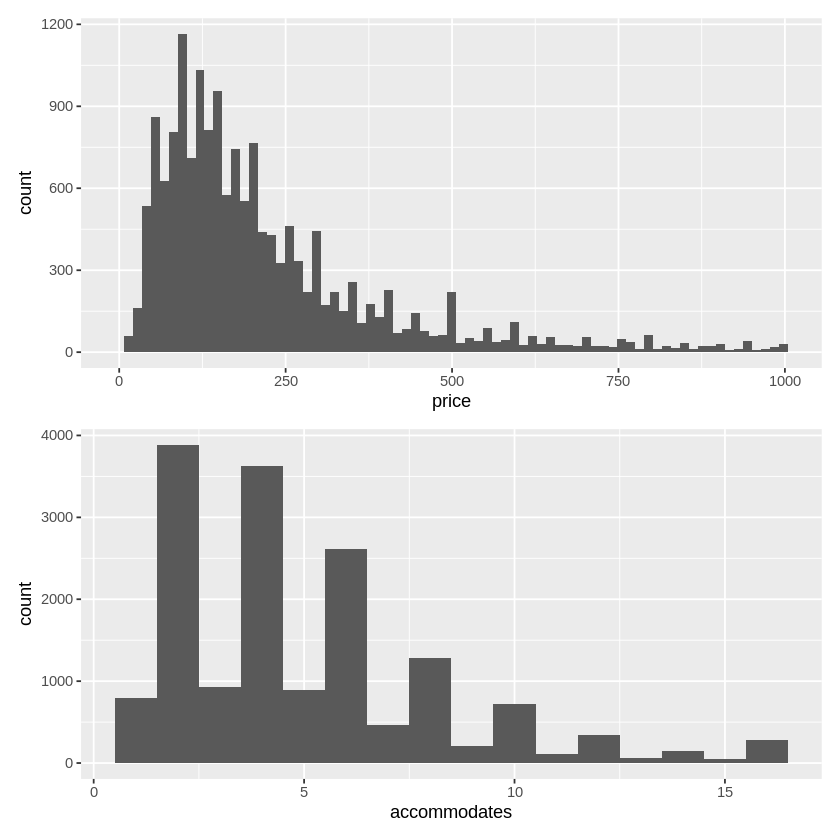

Warning message:
“Removed 2958 rows containing non-finite values (`stat_bin()`).”


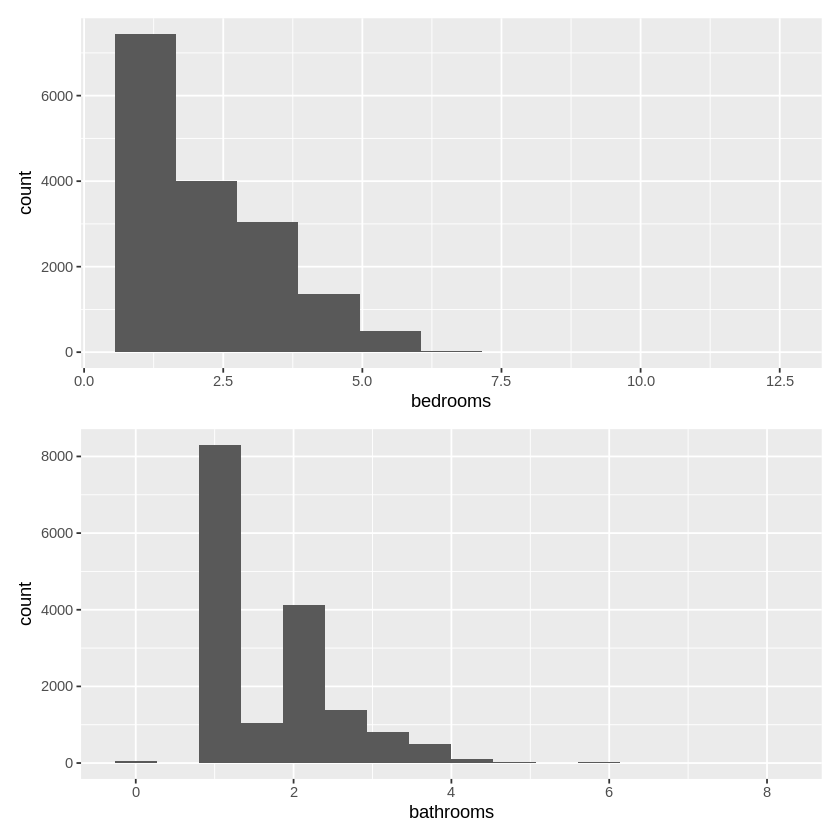

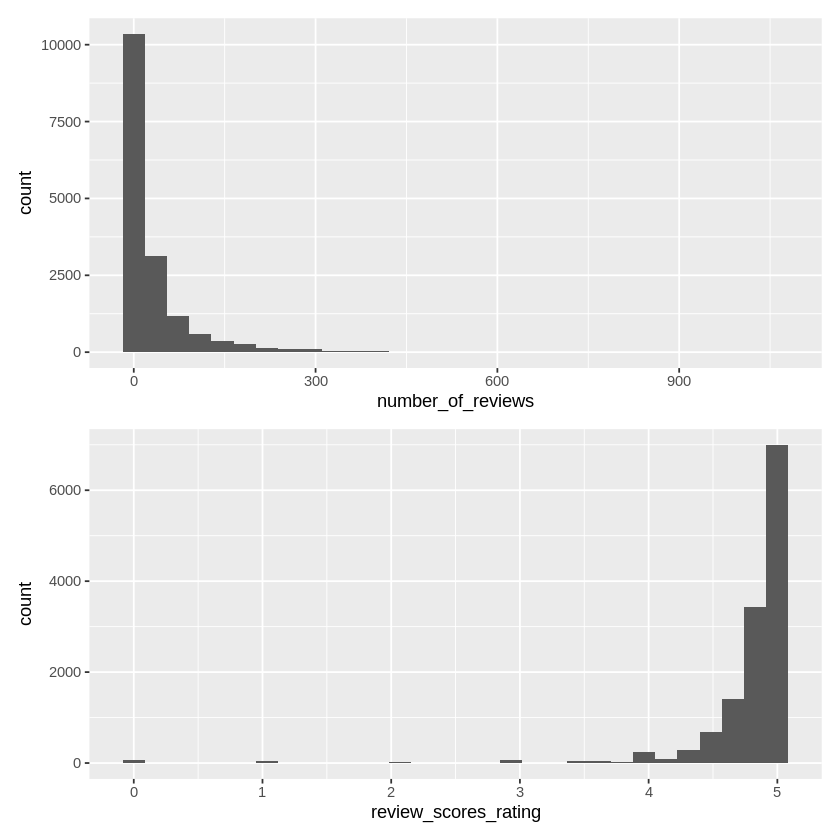

In [ ]:
hist_price = ggplot(df_listings) + 
  geom_histogram(aes(x = price), bins=75)

hist_accommodates = ggplot(df_listings) + 
  geom_histogram(aes(x = accommodates), bins=16)

hist_bedrooms = ggplot(df_listings) + 
  geom_histogram(aes(x = bedrooms), bins=11)

hist_bathrooms = ggplot(df_listings) + 
  geom_histogram(aes(x = bathrooms), bins=16)

hist_num_reviews = ggplot(df_listings) + 
  geom_histogram(aes(x = number_of_reviews), bins=30)

hist_review_scores = ggplot(df_listings) + 
  geom_histogram(aes(x = review_scores_rating), bins=30)

hist_price / hist_accommodates
hist_bedrooms / hist_bathrooms
hist_num_reviews / hist_review_scores

In [ ]:
#df_listings %>%
#  ggplot() + 
#  geom_histogram(aes(x=review_scores_rating), binwidth = .1) + 
#  scale_x_continuous(limits = c(0,5)) + 
#  scale_y_continuous(limits = c(0,2900))

In [ ]:
#Histograms for capacity, # of bathrooms, # of bedrooms, # of beds
#df_listings %>%
#  pivot_longer(cols=c('accommodates','beds', 'bedrooms','bathrooms'),names_to = 'vars', values_to = 'vals') %>%
#  ggplot() +
#  geom_histogram(aes(x=vals), binwidth = 1) + 
#  facet_wrap(vars~., scales = 'free')


#max(df_listings$accommodates)
#max(df_listings$bathrooms)
#max(df_listings$bedrooms)
#max(df_listings$beds)

**Observations for all Boxplots:** Although the majority of listings seem to be concentrated below the $250 price point there seems to be a listing almost at every price point for bedrooms, bathrooms, acommodates. This is an indication that some other factor is driving the price of a listing, could be location or ammenities such as a pool, jacuzzi, etc.

As expected, the median price seems to increase with the number of bedrooms and bathrooms and the relationship seems approximately linear. However, note that once we reach more than 7 bedrooms or more than 5 bathrooms, we see significantly fewer data points which could bias our results.

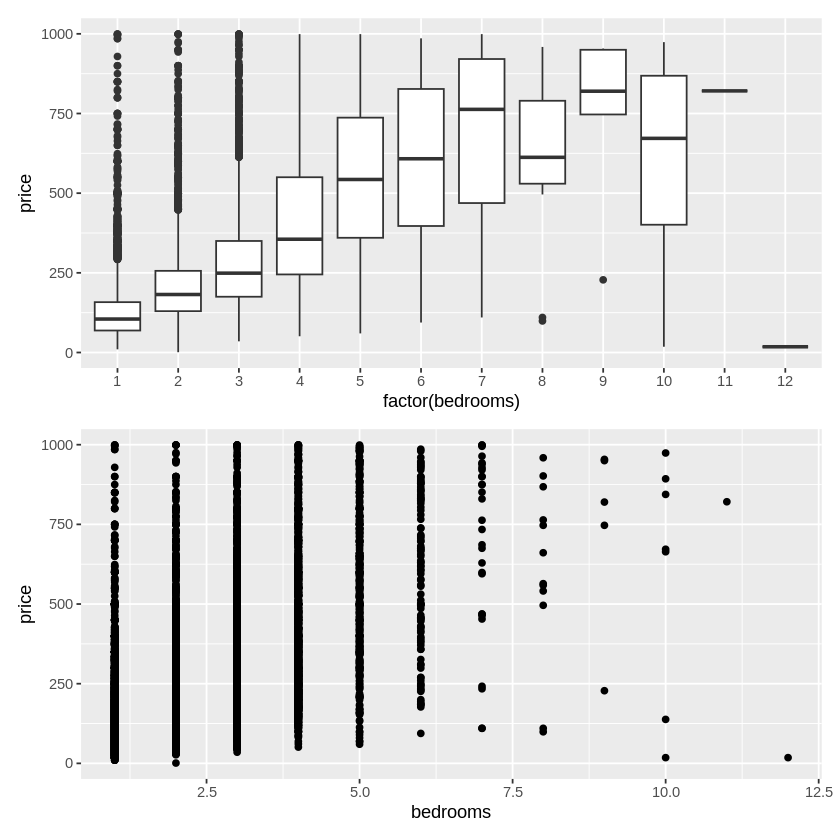

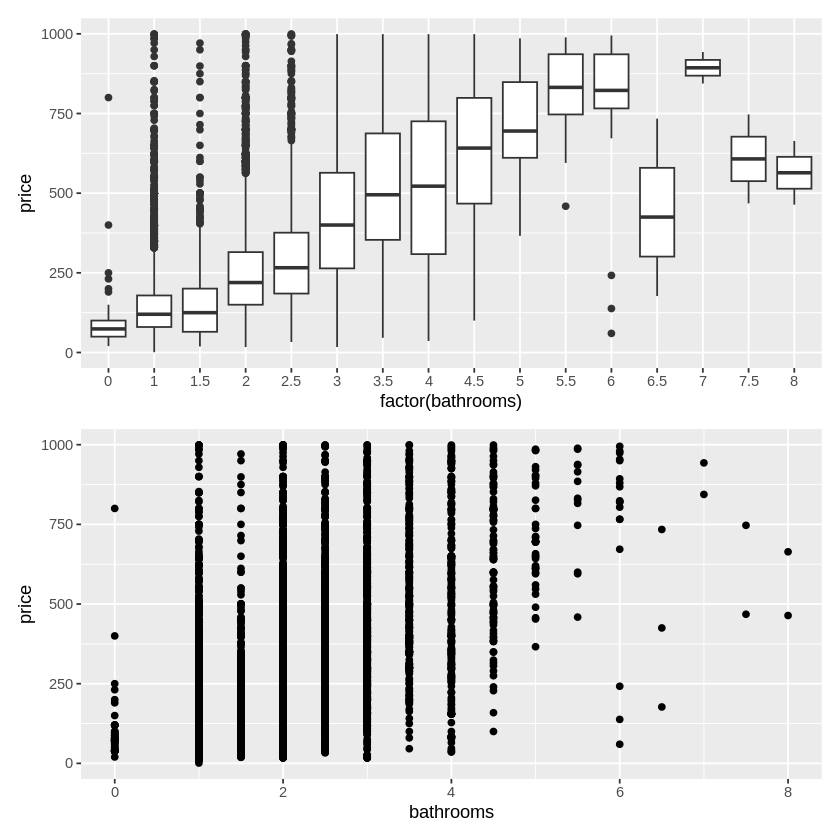

In [ ]:
#Boxplot and Scatterplot for price vs (bedrooms and bathrooms)

box1 = ggplot(df_listings) + 
  geom_boxplot(aes(x = factor(bedrooms), y = price)) 

p1 = ggplot(df_listings) + 
  geom_point(aes(x = bedrooms, y = price)) 

box2 = ggplot(df_listings) + 
  geom_boxplot(aes(x = factor(bathrooms), y = price))

p2 = ggplot(df_listings) + 
  geom_point(aes(x = bathrooms, y = price))

box1 / p1
box2 / p2

We can see that the median price also seems to increase with the number of people a listing can accomodate. The relationship also seems somewhat linear. 

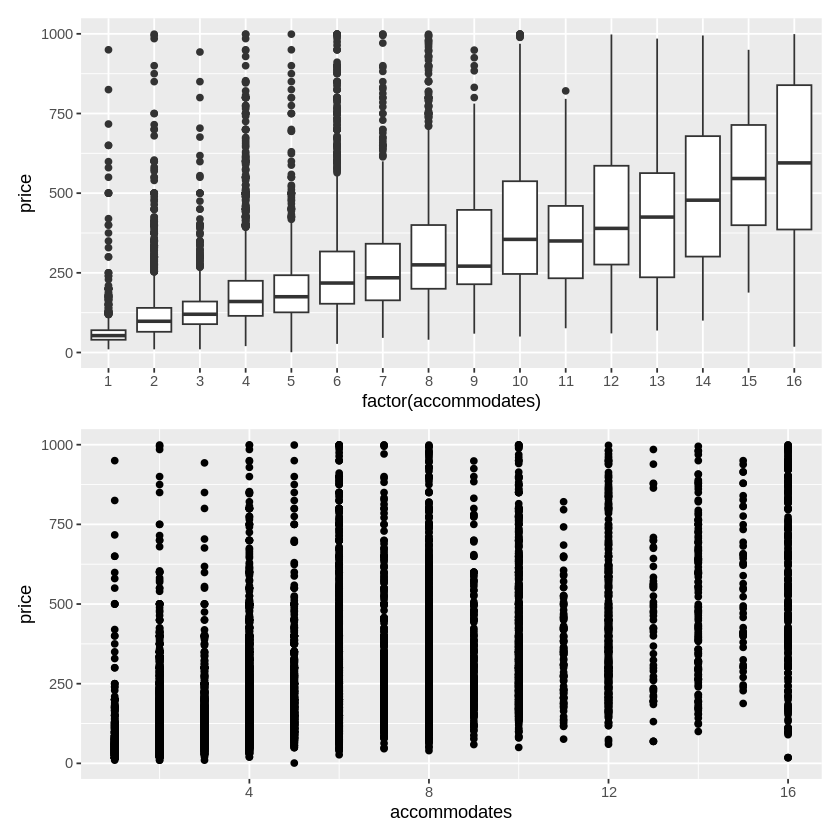

In [ ]:
#Boxplot and Scatterplot for price vs accomodates

box3 = ggplot(df_listings) + 
  geom_boxplot(aes(x = factor(accommodates), y = price)) 

p3 = ggplot(df_listings) + 
  geom_point(aes(x = accommodates, y = price))

box3 / p3

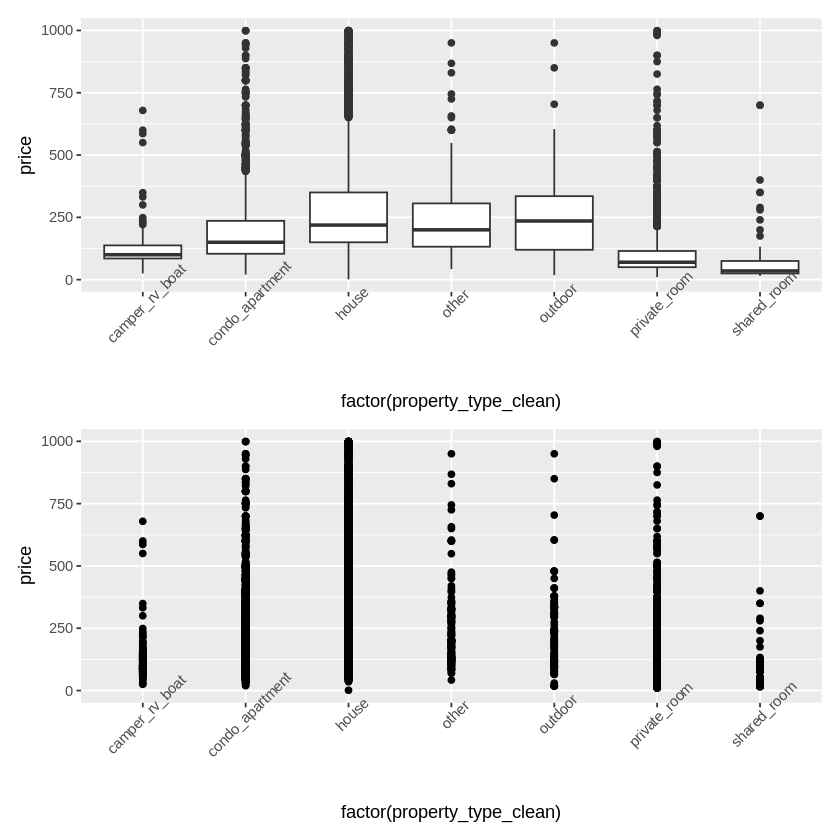

In [ ]:
#Boxplot and Scatterplot for price vs property_type_cleaned

box4 = ggplot(df_listings) + 
  geom_boxplot(aes(x = factor(property_type_clean), y = price)) +
  theme(axis.text.x = element_text(angle = 45))

p4 = ggplot(df_listings) + 
  geom_point(aes(x = factor(property_type_clean), y = price)) +
  theme(axis.text.x = element_text(angle = 45))

box4 / p4

As expected, as properties get close to downtown, prices tend to increase. Interesting here is that although downtown listings have higher median prices, it has less values for prices on the very high end potnentially due to the limited size of listings downtown or lower number of observations compared to the other locations.


    0     1     2 
11790  3650   956 

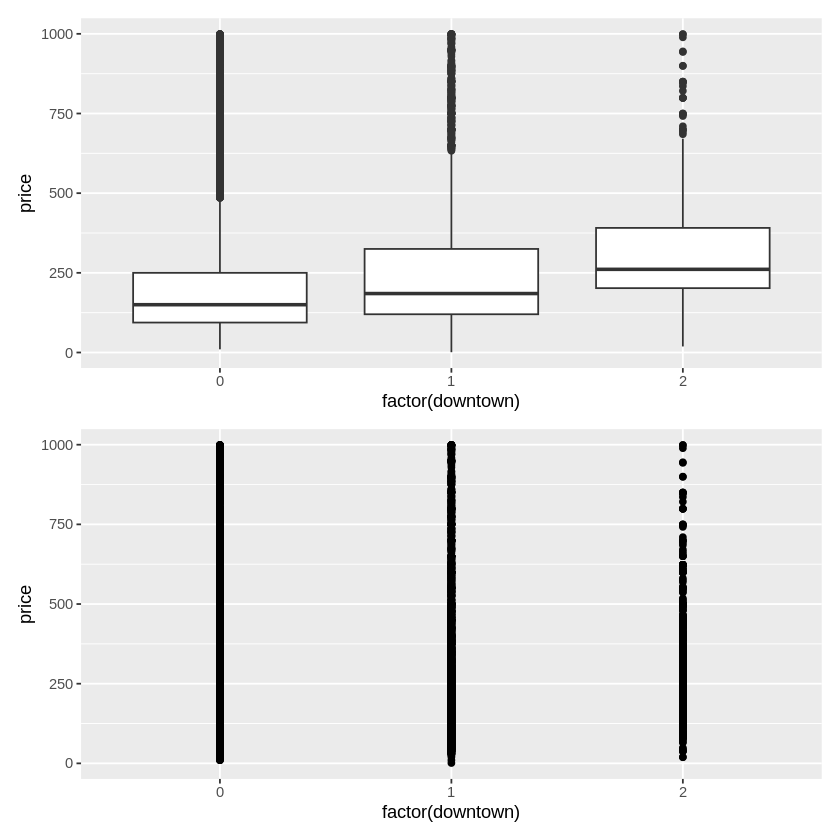

In [ ]:
#Boxplot and Scatterplot for price vs downtown
#0: Not Downtown or Austin Core
#1: Austin Core
#2: Downtown

box5 = ggplot(df_listings) + 
  geom_boxplot(aes(x = factor(downtown), y = price)) 

p5 = ggplot(df_listings) + 
  geom_point(aes(x = factor(downtown), y = price)) 

box5 / p5

table(df_listings$downtown) 

Warning message:
“Removed 2958 rows containing missing values (`geom_point()`).”


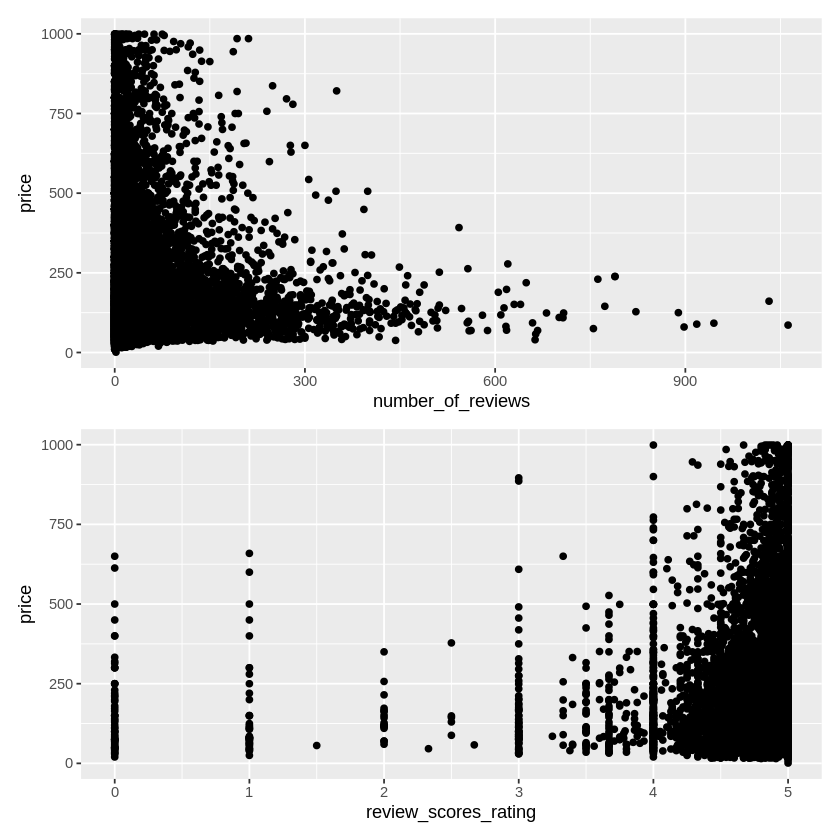

In [ ]:
#Scatterplot for price vs (number_of_reviews and review_scores_rating)

p6 = ggplot(df_listings) + 
  geom_point(aes(x = number_of_reviews, y = price)) 

p7 = ggplot(df_listings) + 
  geom_point(aes(x = review_scores_rating, y = price)) 

p6 / p7

In [ ]:
#Correlation Matrix for Reference (note: we are not choosing variables for regression based on this) 
#Only for referece to look at potentially odd correlations

price_cor <- data.frame(cor(df_listings[,unlist(lapply(df_listings, is.numeric))]))[13,]

price_cor <- t(price_cor)
price_cor <- na.omit(price_cor)
price_cor <- data.frame(price_cor)

price_cor %>% arrange(desc(price))


,price
,<dbl>
price,1.0000000000
accommodates,0.6087882100
bedrooms,0.5956788842
bathrooms,0.5856397530
downtown,0.1779432231
jacuzzi,0.1735864479
fireplace,0.1408768646
pool,0.1304871443
washer_dryer,0.1272265271


Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”


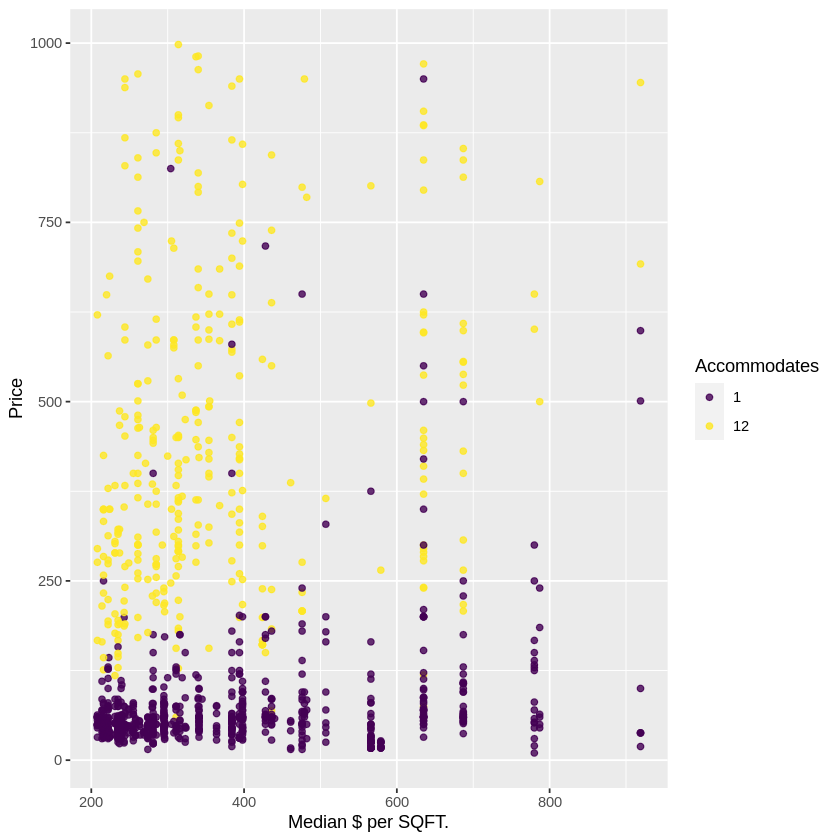

In [ ]:
#Price vs. median_price_SQFT for small (1 person) and large (12 person) listings
df_listings %>% filter(accommodates == 1  | accommodates == 12) %>%
  ggplot(aes(x=median_price_SQFT, y=price)) + 
  geom_point(alpha = .8, aes(color=factor(accommodates))) + 
  scale_color_viridis_d() + 
  labs(x='Median $ per SQFT.', y='Price', color = 'Accommodates')

  #Use viridis color scheme


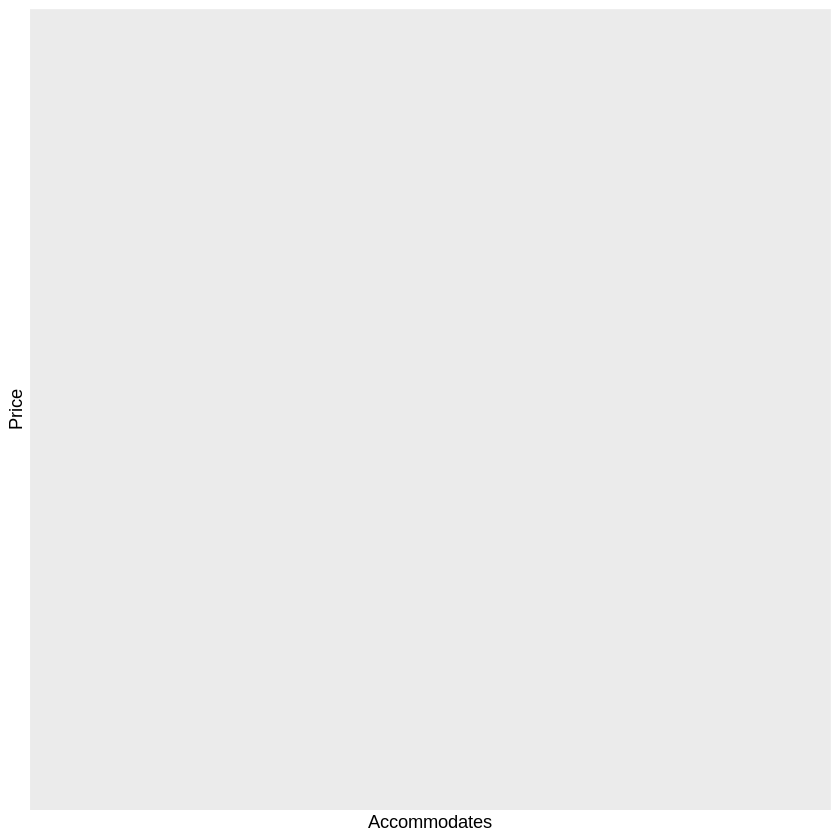

In [ ]:
#Price vs. Airbnb Size (Accommodates) for most and least expensive zipcode
df_listings %>% 
  filter(median_price_SQFT == max(df_listings$median_price_SQFT) | median_price_SQFT == min(df_listings$median_price_SQFT)) %>%
    ggplot(aes(x=accommodates,y=price)) +
    geom_point(alpha = 0.7, aes(color=factor(median_price_SQFT))) + 
    scale_color_viridis_d() + 
    labs(x='Accommodates', y='Price', color= 'Median $ per SQFT.')


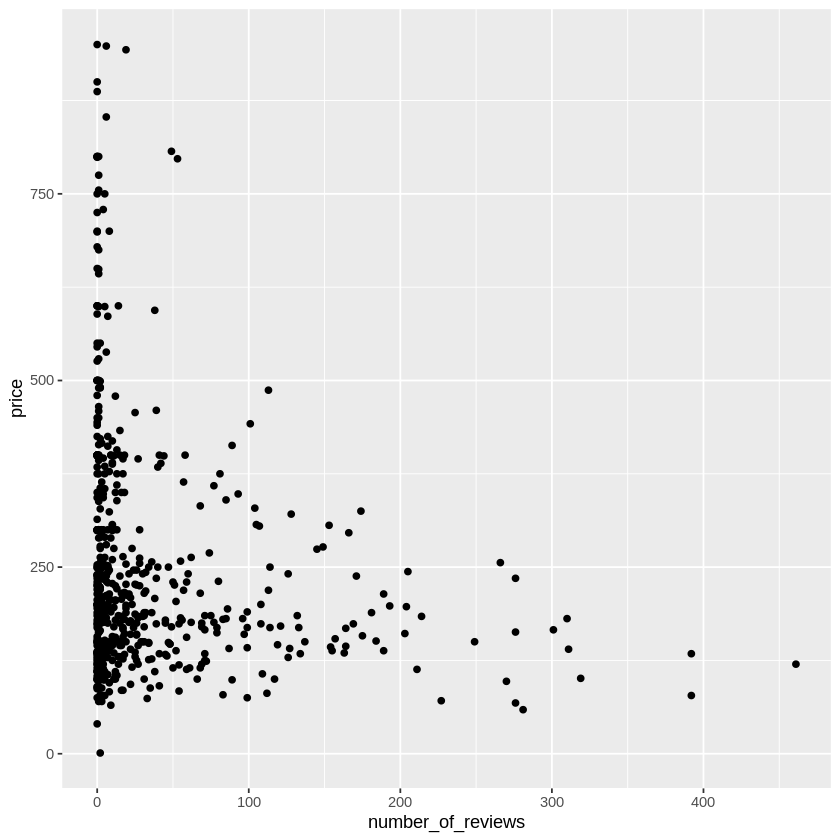

In [ ]:
df_listings %>% filter(zip_code == 78704 & bedrooms==2) %>%
  ggplot(aes(x=number_of_reviews,y= price)) +
  geom_point() +
  scale_color_viridis_d()

  

[1] 0.0002439619

integer(0)

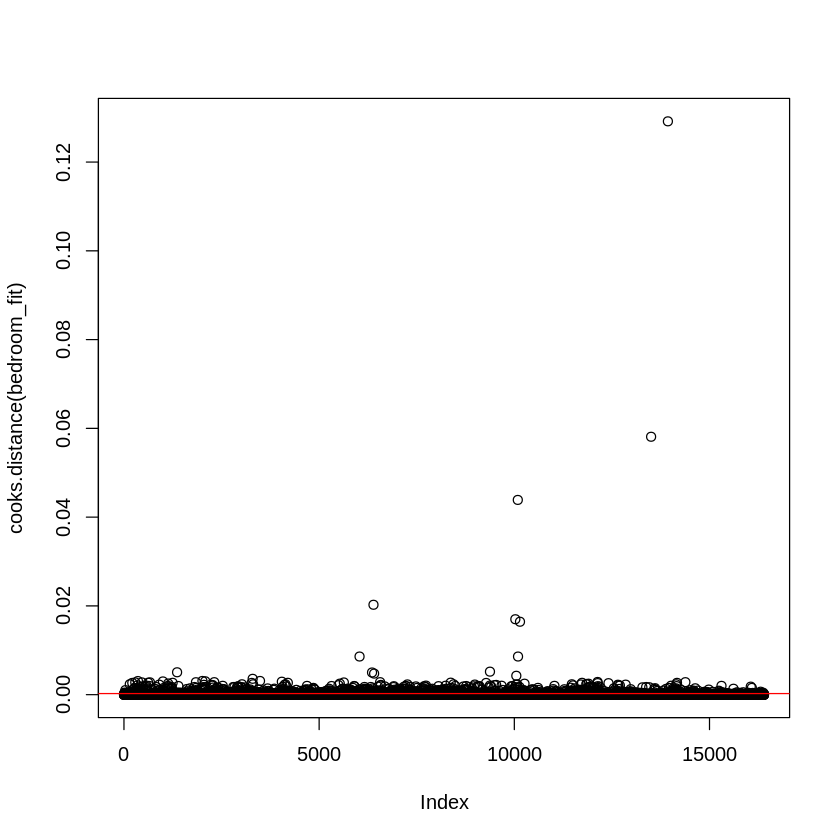

In [ ]:
#Cooks Distance
acc_fit = lm(price ~ accommodates, data = df_listings)
bath_fit = lm(price ~ bathrooms, data = df_listings)
bedroom_fit = lm(price ~ bedrooms, data = df_listings)
beds_fit = lm(price ~ beds, data = df_listings)

#A a general rule of thumb is that any point with a cook's distance
#over 4/n is considered an outlier
4/nrow(df_listings)
plot(cooks.distance(bedroom_fit)) + abline(h=4/nrow(df_listings), col = 'red')

In [ ]:
#########################################
#Simple Model Summary Function
#########################################
model_summaries <- function(data, xvar, yvar){
  xvar = enquo(arg = xvar)
  yvar = enquo(arg = yvar)
  #create new df to work from to not affect original data
  new.df <- data %>% 
    select(!!xvar, !!yvar) %>%
    mutate(observation = 1:nrow(data))
  name_list = names(new.df)

#linear
  linear.model = lm(unlist(new.df[2])~unlist(new.df[1]), data=new.df)
  print('Linear Model')
  print(summary(linear.model))
  print(' ')
  print(' ')
#squared
  squared.model = lm(unlist(new.df[2])~poly((unlist(new.df[1])), 2), data=new.df)
  print('Squared Model')
  print(summary(squared.model))
  print(' ')
  print(' ')
#cubic
  cubic.model = lm(unlist(new.df[2])~poly((unlist(new.df[1])), 3), data=new.df)
  print('Cubic Model')
  print(summary(cubic.model))
  print(' ')
  print(' ')
#spline
  print('Spline Model')
  spline.model = gam(unlist(new.df[2])~s(unlist(new.df[1])), data=new.df)
  print(summary(spline.model))
  print(' ')
  print(' ')
}



########################################
#Diagnostics Function for Linear Models
########################################
linear_diagnostics <- function(data, xvar, yvar){
  
  
  xvar = enquo(arg = xvar)
  yvar = enquo(arg = yvar)
  #create new df to work from to not affect original data
  new.df <- data %>% 
    select(!!xvar, !!yvar) %>%
    mutate(observation = 1:nrow(data))
  name_list = names(new.df)


  lm.model = lm(unlist(new.df[2])~unlist(new.df[1]), data=new.df)

  print(summary(lm.model))
  
  # Tack the residuals onto our dataset
  new.df = new.df %>% mutate(resids = resid(lm.model),
                       stdresids = rstandard(lm.model))
  
  # Linear Regression Visualization
  p <-ggplot(aes(x=unlist(new.df[1]), y=!!yvar), data=new.df) + 
    geom_point(alpha = 0.6) + 
    geom_smooth(method="lm") + xlab(name_list[1]) + ggtitle(paste0(name_list[1], ' Regressed to Price'))

  print(p)
  
  # Always plot residuals vs. predictor variable
  # We're looking for nonlinear trends -- indicating E(e_i|X) != 0 --
  # and for patterns in the spread indicating Var(e_i|X) isn't constant
  q <- ggplot(aes(x=unlist(new.df[1]), y=resids), data=new.df) + 
    geom_point() + 
    geom_smooth() + xlab(name_list[1]) + ggtitle(paste0('Residuals vs ', name_list[1]))
  print(q)
  
  r <- ggplot(aes(x=unlist(new.df[1]), y=stdresids), data=new.df) + 
    geom_point() + 
    geom_smooth() + xlab(name_list[1]) + ggtitle(paste0('Standardized Residuals vs ', name_list[1]))
  print(r)
  
   #Dated absolute residuals
  x <- ggplot(aes(x=as.Date(observation,origin="1993-12-31"), y=stdresids), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(yintercept=0, col='red')
  print(x)
  x <- ggplot(aes(x=as.Date(observation,origin="1993-12-31"), y=abs(stdresids)), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(yintercept=0, col='red')
  print(x)
  
  # Plotting successive residuals against each other
  # head() and tail() here are used to get "every day except the last"
  # and "every day except the first", respectively
  # see help(head)
  lag_df = data.frame(resid.today =head(rstandard(lm.model),-1),
                      resid.tomorrow = tail(rstandard(lm.model),-1))
  
  print(cor(lag_df$resid.today, lag_df$resid.tomorrow))  
  
  y <- ggplot(aes(x=resid.today, y=resid.tomorrow), data=lag_df) +
    geom_point() + 
    geom_smooth()
  print(y)




  # Always plot residuals^2 vs.
  # predictor variable
  # It's easier to read off trends in the spread of the residuals here -- remember,
  # the expected residual should be zero so the level here should be constant
  s <- ggplot(aes(x=unlist(new.df[1]), y=resids^2), data=new.df) + 
    geom_point() + 
    geom_smooth() + xlab(name_list[1]) + ggtitle(paste0('Squared Residuals vs ', name_list[1]))
  print(s)
  
  t <- ggplot(aes(x=unlist(new.df[1]), y=stdresids^2), data=new.df) + 
    geom_point() + 
    geom_smooth() + xlab(name_list[1]) + ggtitle(paste0('Squared Standardized Residuals vs ', name_list[1]))
  print(t)
  
  # Those plots are sensitive to outliers, let's try absolute values
  u <- ggplot(aes(x=unlist(new.df[1]), y=abs(resids)), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(aes(yintercept=mean(abs(resids)), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Absolute Value Residuals vs ', name_list[1]))
  print(u)
  
  v <- ggplot(aes(x=unlist(new.df[1]), y=abs(stdresids)), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(aes(yintercept=mean(abs(stdresids)), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Absolute Value Standardized Residuals vs ', name_list[1]))
  print(v)
  
  # Always plot distribution of residuals
  w <- ggplot(aes(x=stdresids), data=new.df) + 
    geom_histogram(aes(y=..density..), bins=30) + 
    stat_function(fun = dnorm, args = list(mean = 0, sd = 1), col='blue') + ggtitle(paste0('Distribution of Residuals from ', name_list[1]))
  print(w)
  
  ## ----qqplot-of-residuals, echo=FALSE-------------------------------------
  # An alternative: plot observed quantiles vs. theoretical Gaussian quantiles
  qqnorm(residuals(lm.model))
  qqline(residuals(lm.model))
  
  qqnorm(rstandard(lm.model))
  qqline(rstandard(lm.model))
}


##########################################
#Diagnostics Function for Squared Models
##########################################
quad_diagnostics <- function(data, xvar, yvar){
  
  
  xvar = enquo(arg = xvar)
  yvar = enquo(arg = yvar)
  #create new df to work from to not affect original data
  new.df <- data %>% 
    select(!!xvar, !!yvar) %>%
    mutate(observation = 1:nrow(data))
  name_list = names(new.df)


  lm.model = lm(unlist(new.df[2])~poly((unlist(new.df[1])), 2), data=new.df)

  print(summary(lm.model))
  
  # Tack the residuals onto our dataset
  new.df = new.df %>% mutate(resids = resid(lm.model),
                       stdresids = rstandard(lm.model))
  
  # Regression Visualization
  p <-ggplot(aes(x=unlist(new.df[1]), y=!!yvar), data=new.df) + 
    geom_point(alpha = 0.6) + 
    geom_smooth(method="lm", formula = y ~ poly(x, 2)) + xlab(name_list[1]) + ggtitle(paste0(name_list[1], ' Regressed to Price'))

  print(p)


  # Always plot residuals vs. predictor variable
  # We're looking for nonlinear trends -- indicating E(e_i|X) != 0 --
  # and for patterns in the spread indicating Var(e_i|X) isn't constant
  q <- ggplot(aes(x=unlist(new.df[1]), y=resids), data=new.df) + 
    geom_point() + 
    geom_smooth() + xlab(name_list[1]) + ggtitle(paste0('Residuals vs ', name_list[1]))
  print(q)
  
  r <- ggplot(aes(x=unlist(new.df[1]), y=stdresids), data=new.df) + 
    geom_point() + 
    geom_smooth() + xlab(name_list[1]) + ggtitle(paste0('Standardized Residuals vs ', name_list[1]))
  print(r)
  
   #Dated absolute residuals
  x <- ggplot(aes(x=as.Date(observation,origin="1993-12-31"), y=stdresids), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(yintercept=0, col='red')
  print(x)
  x <- ggplot(aes(x=as.Date(observation,origin="1993-12-31"), y=abs(stdresids)), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(yintercept=0, col='red')
  print(x)
  
  # Plotting successive residuals against each other
  # head() and tail() here are used to get "every day except the last"
  # and "every day except the first", respectively
  # see help(head)
  lag_df = data.frame(resid.today =head(rstandard(lm.model),-1),
                      resid.tomorrow = tail(rstandard(lm.model),-1))

  print(cor(lag_df$resid.today, lag_df$resid.tomorrow))  
  
  y <- ggplot(aes(x=resid.today, y=resid.tomorrow), data=lag_df) +
    geom_point() + 
    geom_smooth()
  print(y)




  # Always plot residuals^2 vs.
  # predictor variable
  # It's easier to read off trends in the spread of the residuals here -- remember,
  # the expected residual should be zero so the level here should be constant
  s <- ggplot(aes(x=unlist(new.df[1]), y=resids^2), data=new.df) + 
    geom_point() + 
    geom_smooth() + geom_hline(aes(yintercept=mean(resids^2), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Squared Residuals vs ', name_list[1]))
  print(s)
  
  t <- ggplot(aes(x=unlist(new.df[1]), y=stdresids^2), data=new.df) + 
    geom_point() + 
    geom_smooth() + geom_hline(aes(yintercept=mean(stdresids^2), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Squared Standardized Residuals vs ', name_list[1]))
  print(t)
  
  # Those plots are sensitive to outliers, let's try absolute values
  u <- ggplot(aes(x=unlist(new.df[1]), y=abs(resids)), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(aes(yintercept=mean(abs(resids)), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Absolute Value Residuals vs ', name_list[1]))
  print(u)
  
  v <- ggplot(aes(x=unlist(new.df[1]), y=abs(stdresids)), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(aes(yintercept=mean(abs(stdresids)), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Absolute Value Standardized Residuals vs ', name_list[1]))
  print(v)
  
  # Always plot distribution of residuals
  w <- ggplot(aes(x=stdresids), data=new.df) + 
    geom_histogram(aes(y=..density..), bins=30) + 
    stat_function(fun = dnorm, args = list(mean = 0, sd = 1), col='blue') + ggtitle(paste0('Distribution of Residuals from ', name_list[1]))
  print(w)
  
  ## ----qqplot-of-residuals, echo=FALSE-------------------------------------
  # An alternative: plot observed quantiles vs. theoretical Gaussian quantiles
  qqnorm(residuals(lm.model))
  qqline(residuals(lm.model))
  
  qqnorm(rstandard(lm.model))
  qqline(rstandard(lm.model))
}

##########################################
#Diagnostics Function for Cubic Models
##########################################
cubic_diagnostics <- function(data, xvar, yvar){
  
  
  xvar = enquo(arg = xvar)
  yvar = enquo(arg = yvar)
  #create new df to work from to not affect original data
  new.df <- data %>% 
    select(!!xvar, !!yvar) %>%
    mutate(observation = 1:nrow(data))
  name_list = names(new.df)


  lm.model = lm(unlist(new.df[2])~poly((unlist(new.df[1])), 3), data=new.df)

  print(summary(lm.model))
  
  # Tack the residuals onto our dataset
  new.df = new.df %>% mutate(resids = resid(lm.model),
                       stdresids = rstandard(lm.model))
  
  # Regression Visualization
  p <-ggplot(aes(x=unlist(new.df[1]), y=!!yvar), data=new.df) + 
    #geom_point(alpha = 0.6) + 
    #geom_smooth(method="lm", formula = y ~ poly(x, 3)) + xlab(name_list[1]) + ggtitle(paste0(name_list[1], ' Regressed to Price'))

  print(p)

  
  # Always plot residuals vs. predictor variable
  # We're looking for nonlinear trends -- indicating E(e_i|X) != 0 --
  # and for patterns in the spread indicating Var(e_i|X) isn't constant
  q <- ggplot(aes(x=unlist(new.df[1]), y=resids), data=new.df) + 
    geom_point() + 
    geom_smooth() + xlab(name_list[1]) + ggtitle(paste0('Residuals vs ', name_list[1]))
  print(q)
  
  r <- ggplot(aes(x=unlist(new.df[1]), y=stdresids), data=new.df) + 
    geom_point() + 
    geom_smooth() + xlab(name_list[1]) + ggtitle(paste0('Standardized Residuals vs ', name_list[1]))
  print(r)
  
   #Dated absolute residuals
  x <- ggplot(aes(x=as.Date(observation,origin="1993-12-31"), y=stdresids), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(yintercept=0, col='red')
  print(x)
  x <- ggplot(aes(x=as.Date(observation,origin="1993-12-31"), y=abs(stdresids)), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(yintercept=0, col='red')
  print(x)
  
  # Plotting successive residuals against each other
  # head() and tail() here are used to get "every day except the last"
  # and "every day except the first", respectively
  # see help(head)
  lag_df = data.frame(resid.today =head(rstandard(lm.model),-1),
                      resid.tomorrow = tail(rstandard(lm.model),-1))
  
  print(cor(lag_df$resid.today, lag_df$resid.tomorrow))

  y <- ggplot(aes(x=resid.today, y=resid.tomorrow), data=lag_df) +
    geom_point() + 
    geom_smooth()
  print(y)




  # Always plot residuals^2 vs.
  # predictor variable
  # It's easier to read off trends in the spread of the residuals here -- remember,
  # the expected residual should be zero so the level here should be constant
  s <- ggplot(aes(x=unlist(new.df[1]), y=resids^2), data=new.df) + 
    geom_point() + 
    geom_smooth() + geom_hline(aes(yintercept=mean(resids^2), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Squared Residuals vs ', name_list[1]))
  print(s)
  
  t <- ggplot(aes(x=unlist(new.df[1]), y=stdresids^2), data=new.df) + 
    geom_point() + 
    geom_smooth() + geom_hline(aes(yintercept=mean(stdresids^2), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Squared Standardized Residuals vs ', name_list[1]))
  print(t)
  
  # Those plots are sensitive to outliers, let's try absolute values
  u <- ggplot(aes(x=unlist(new.df[1]), y=abs(resids)), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(aes(yintercept=mean(abs(resids)), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Absolute Value Residuals vs ', name_list[1]))
  print(u)
  
  v <- ggplot(aes(x=unlist(new.df[1]), y=abs(stdresids)), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(aes(yintercept=mean(abs(stdresids)), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Absolute Value Standardized Residuals vs ', name_list[1]))
  print(v)
  
  # Always plot distribution of residuals
  w <- ggplot(aes(x=stdresids), data=new.df) + 
    geom_histogram(aes(y=..density..), bins=30) + 
    stat_function(fun = dnorm, args = list(mean = 0, sd = 1), col='blue') + ggtitle(paste0('Distribution of Residuals from ', name_list[1]))
  print(w)
  
  ## ----qqplot-of-residuals, echo=FALSE-------------------------------------
  # An alternative: plot observed quantiles vs. theoretical Gaussian quantiles
  qqnorm(residuals(lm.model))
  qqline(residuals(lm.model))
  
  qqnorm(rstandard(lm.model))
  qqline(rstandard(lm.model))
}

##########################################
#Diagnostics Function for Spline Models
##########################################
spline_diagnostics <- function(data, xvar, yvar){
  
  
  xvar = enquo(arg = xvar)
  yvar = enquo(arg = yvar)
  #create new df to work from to not affect original data
  new.df <- data %>% 
    select(!!xvar, !!yvar) %>%
    mutate(observation = 1:nrow(data))
  name_list = names(new.df)


  lm.model = gam(unlist(new.df[2])~s(unlist(new.df[1])), data=new.df)

  print(summary(lm.model))

  
  # Tack the residuals onto our dataset
  new.df = new.df %>% mutate(resids = residuals(lm.model, type = 'response'),
                       stdresids = (resids/sd(resids)))

  
  # Linear Regression Visualization
  p <-ggplot(aes(x=unlist(new.df[1]), y=!!yvar), data=new.df) + 
    geom_point(alpha = 0.6) + 
    geom_smooth(method="gam") + xlab(name_list[1]) + ggtitle(paste0(name_list[1], ' Regressed to Price'))

  print(p)
  
  # Always plot residuals vs. predictor variable
  # We're looking for nonlinear trends -- indicating E(e_i|X) != 0 --
  # and for patterns in the spread indicating Var(e_i|X) isn't constant
  q <- ggplot(aes(x=unlist(new.df[1]), y=resids), data=new.df) + 
    geom_point() + 
    geom_smooth() + xlab(name_list[1]) + ggtitle(paste0('Residuals vs ', name_list[1]))
  print(q)
  
  r <- ggplot(aes(x=unlist(new.df[1]), y=stdresids), data=new.df) + 
    geom_point() + 
    geom_smooth() + xlab(name_list[1]) + ggtitle(paste0('Standardized Residuals vs ', name_list[1]))
  print(r)
  
   #Dated absolute residuals
  x <- ggplot(aes(x=as.Date(observation,origin="1993-12-31"), y=stdresids), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(yintercept=0, col='red')
  print(x)
  x <- ggplot(aes(x=as.Date(observation,origin="1993-12-31"), y=abs(stdresids)), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(yintercept=0, col='red')
  print(x)
  
  # Plotting successive residuals against each other
  # head() and tail() here are used to get "every day except the last"
  # and "every day except the first", respectively
  # see help(head)
  lag_df = data.frame(resid.today =head(new.df$stdresids,-1),
                      resid.tomorrow = tail(new.df$stdresids,-1))
  
  print(cor(lag_df$resid.today, lag_df$resid.tomorrow))

  y <- ggplot(aes(x=resid.today, y=resid.tomorrow), data=lag_df) +
    geom_point() + 
    geom_smooth()
  print(y)




  # Always plot residuals^2 vs.
  # predictor variable
  # It's easier to read off trends in the spread of the residuals here -- remember,
  # the expected residual should be zero so the level here should be constant
  s <- ggplot(aes(x=unlist(new.df[1]), y=resids^2), data=new.df) + 
    geom_point() + 
    geom_smooth() + geom_hline(aes(yintercept=mean(resids^2), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Squared Residuals vs ', name_list[1]))
  print(s)
  
  t <- ggplot(aes(x=unlist(new.df[1]), y=stdresids^2), data=new.df) + 
    geom_point() + 
    geom_smooth() + geom_hline(aes(yintercept=mean(stdresids^2), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Squared Standardized Residuals vs ', name_list[1]))
  print(t)
  
  # Those plots are sensitive to outliers, let's try absolute values
  u <- ggplot(aes(x=unlist(new.df[1]), y=abs(resids)), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(aes(yintercept=mean(abs(resids)), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Absolute Value Residuals vs ', name_list[1]))
  print(u)
  
  v <- ggplot(aes(x=unlist(new.df[1]), y=abs(stdresids)), data=new.df) + 
    geom_point() + 
    geom_smooth() + 
    geom_hline(aes(yintercept=mean(abs(stdresids)), col='red')) + xlab(name_list[1]) + ggtitle(paste0('Absolute Value Standardized Residuals vs ', name_list[1]))
  print(v)
  
  # Always plot distribution of residuals
  w <- ggplot(aes(x=stdresids), data=new.df) + 
    geom_histogram(aes(y=..density..), bins=30) + 
    stat_function(fun = dnorm, args = list(mean = 0, sd = 1), col='blue') + ggtitle(paste0('Distribution of Residuals from ', name_list[1]))
  print(w)
  
  ## ----qqplot-of-residuals, echo=FALSE-------------------------------------
  # An alternative: plot observed quantiles vs. theoretical Gaussian quantiles
  qqnorm(residuals(lm.model))
  qqline(residuals(lm.model))
  
  qqnorm(rstandard(lm.model))
  qqline(rstandard(lm.model))
}

In [ ]:
#names(num.df.listings)

Diagnostics of # of people accommodated vs. Price - Linear Model

In [ ]:
num.df.listings <- df_listings[,unlist(lapply(df_listings, is.numeric))] %>% na.omit() %>% subset(beds<50)


#num

num.column.names = c('accommodates', 'beds', 'bedrooms', 'median_price_SQFT', 'total_listing_count', 'number_of_reviews', 'review_scores_rating') 

for (x in num.column.names) {
  print(x)
  model_summaries(num.df.listings, x, price)
}

[1] "accommodates"


Warning message:
“Using an external vector in selections was deprecated in tidyselect 1.1.0.
ℹ Please use `all_of()` or `any_of()` instead.
  # Was:
  data %>% select(x)

  # Now:
  data %>% select(all_of(x))

See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>.”


[1] "Linear Model"

Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-570.77  -68.26  -23.83   38.78  891.78 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        38.4324     2.1582   17.81   <2e-16 ***
unlist(new.df[1])  34.3962     0.3533   97.36   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 133 on 13342 degrees of freedom
Multiple R-squared:  0.4154,	Adjusted R-squared:  0.4153 
F-statistic:  9480 on 1 and 13342 DF,  p-value: < 2.2e-16

[1] " "
[1] " "
[1] "Squared Model"

Call:
lm(formula = unlist(new.df[2]) ~ poly((unlist(new.df[1])), 2), 
    data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-560.62  -68.76  -23.15   38.24  893.67 

Coefficients:
                               Estimate Std. Error t value Pr(>|t|)    
(Intercept)                     216.161      1.151 187.757   <2e-16 ***


In [ ]:
model_summaries(num.df.listings, accommodates, price)

[1] "Linear Model"

Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-570.77  -68.26  -23.83   38.78  891.78 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        38.4324     2.1582   17.81   <2e-16 ***
unlist(new.df[1])  34.3962     0.3533   97.36   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 133 on 13342 degrees of freedom
Multiple R-squared:  0.4154,	Adjusted R-squared:  0.4153 
F-statistic:  9480 on 1 and 13342 DF,  p-value: < 2.2e-16

[1] " "
[1] " "
[1] "Squared Model"

Call:
lm(formula = unlist(new.df[2]) ~ poly((unlist(new.df[1])), 2), 
    data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-560.62  -68.76  -23.15   38.24  893.67 

Coefficients:
                               Estimate Std. Error t value Pr(>|t|)    
(Intercept)                     216.161      1.151 187.757   <2e-16 ***


For accomodations, there is no numerical benefit given by using a model that is more complicated than a linear model as far as R^2, residual standard deviation, or the p-values for any coefficients.


Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-570.77  -68.26  -23.83   38.78  891.78 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        38.4324     2.1582   17.81   <2e-16 ***
unlist(new.df[1])  34.3962     0.3533   97.36   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 133 on 13342 degrees of freedom
Multiple R-squared:  0.4154,	Adjusted R-squared:  0.4153 
F-statistic:  9480 on 1 and 13342 DF,  p-value: < 2.2e-16



`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


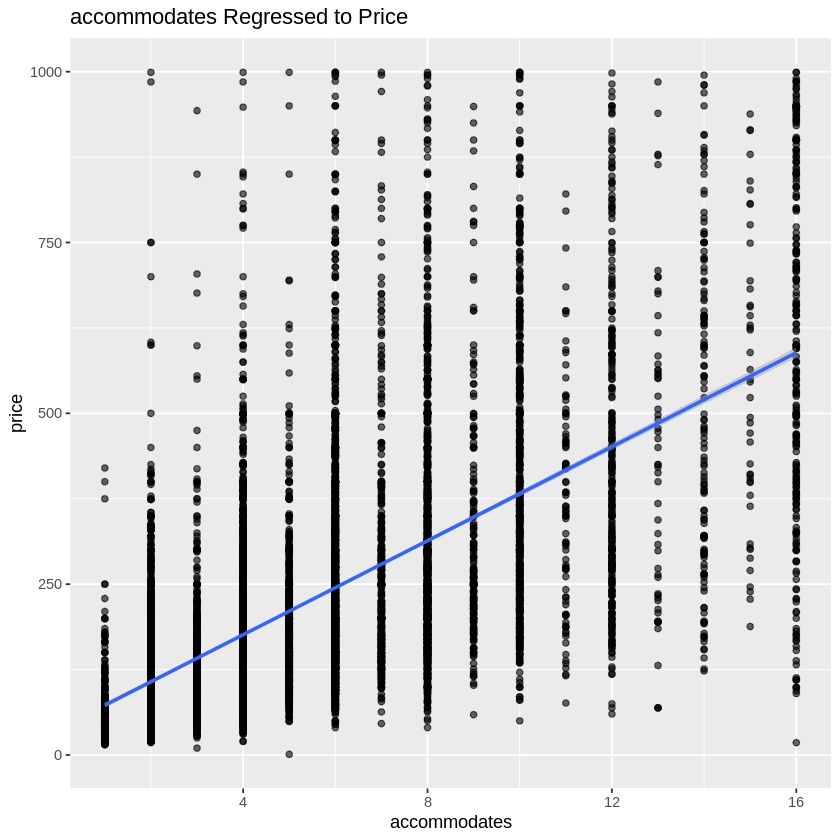

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


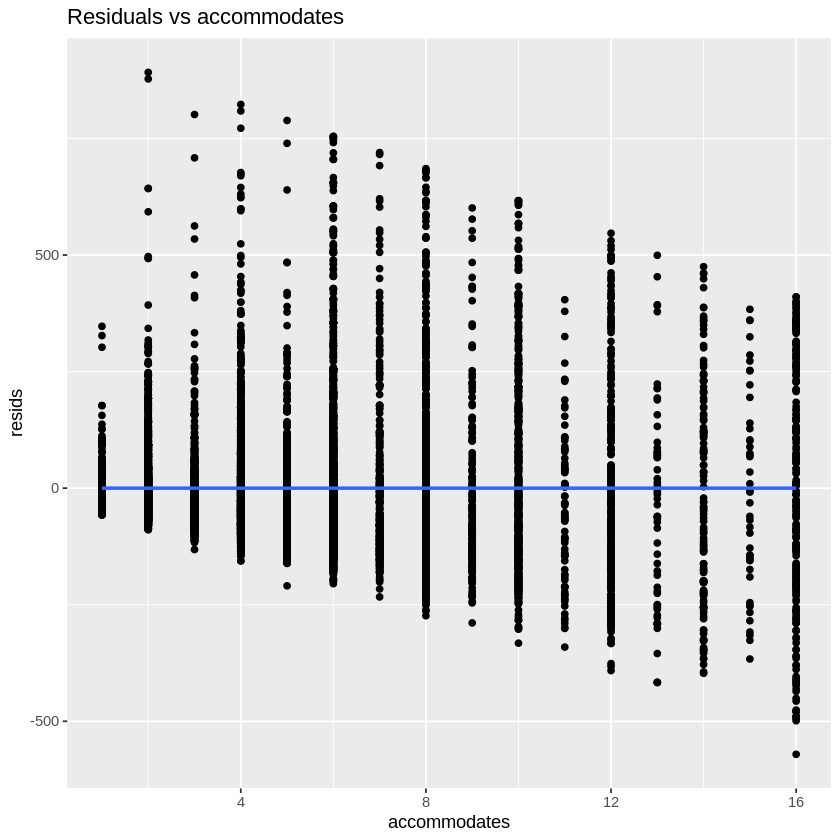

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


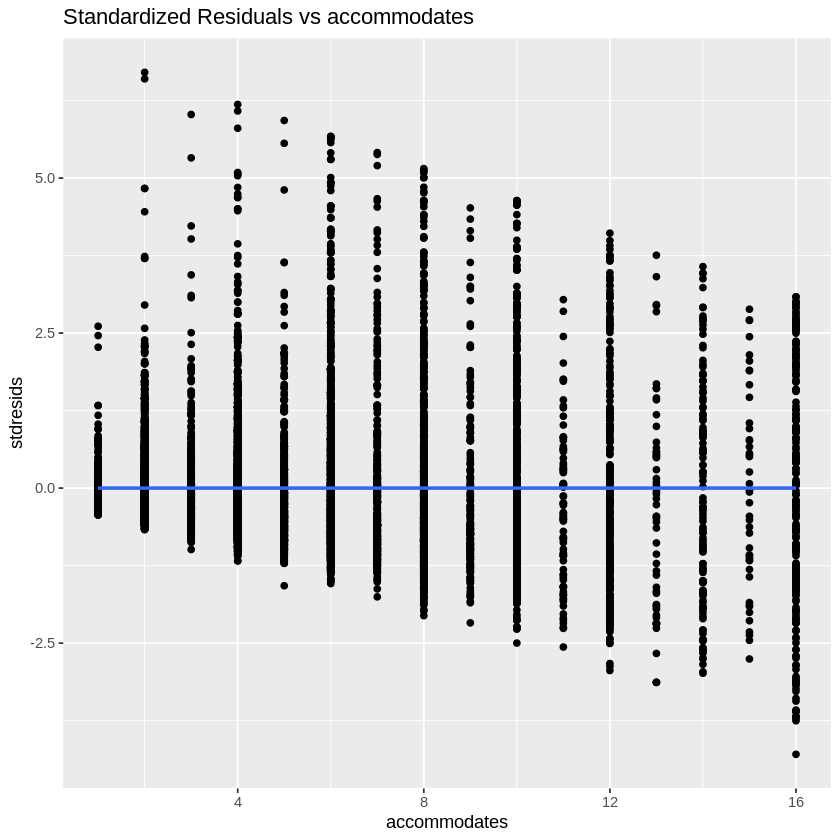

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


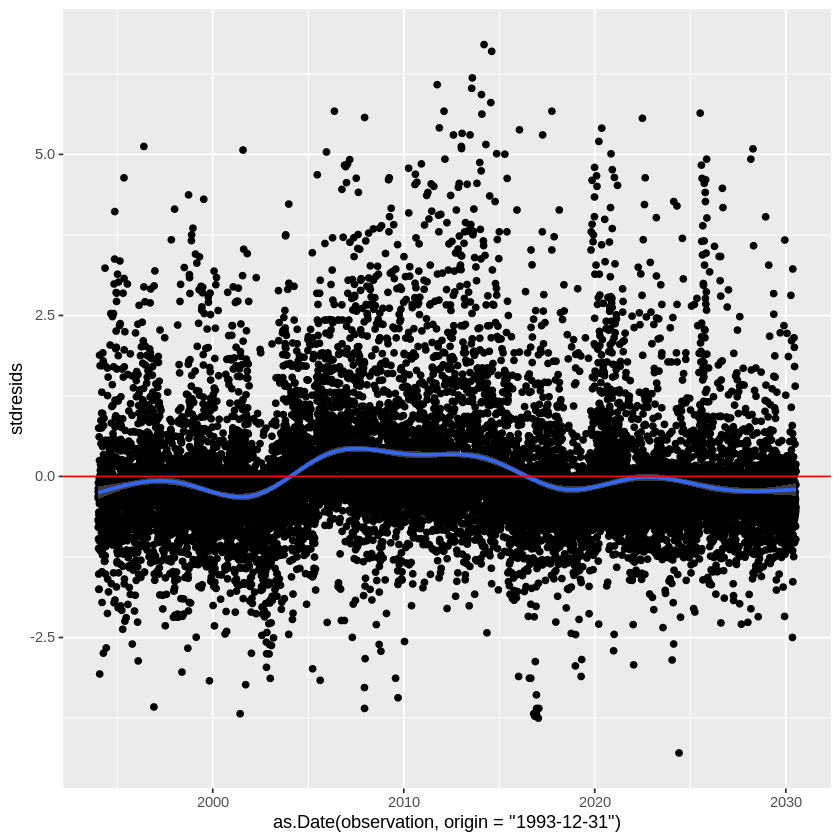

[1] 0.1031962


`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


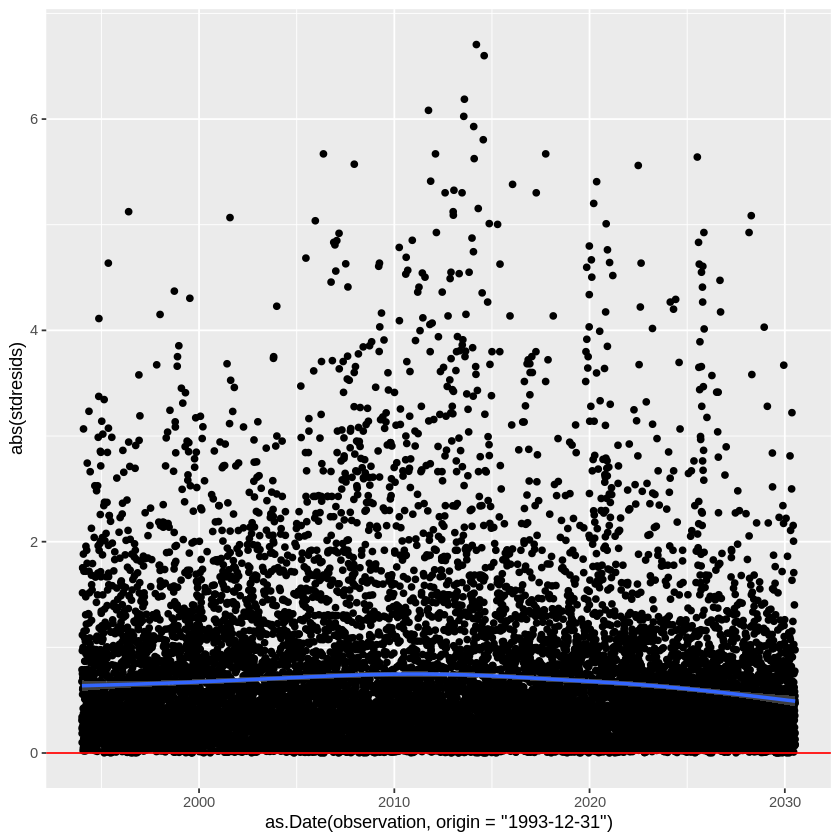

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


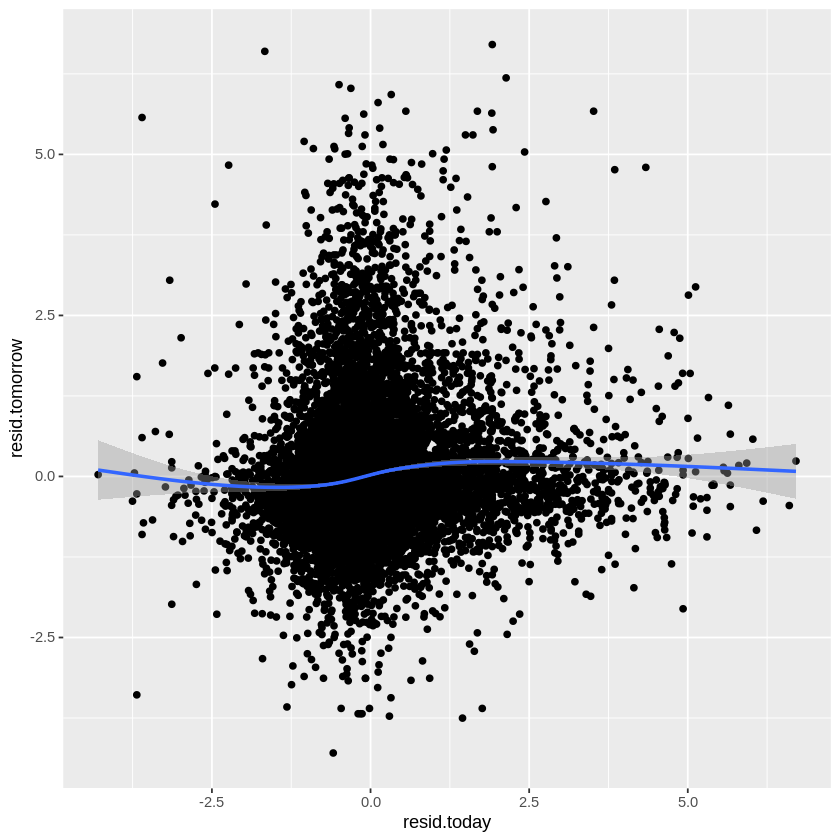

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


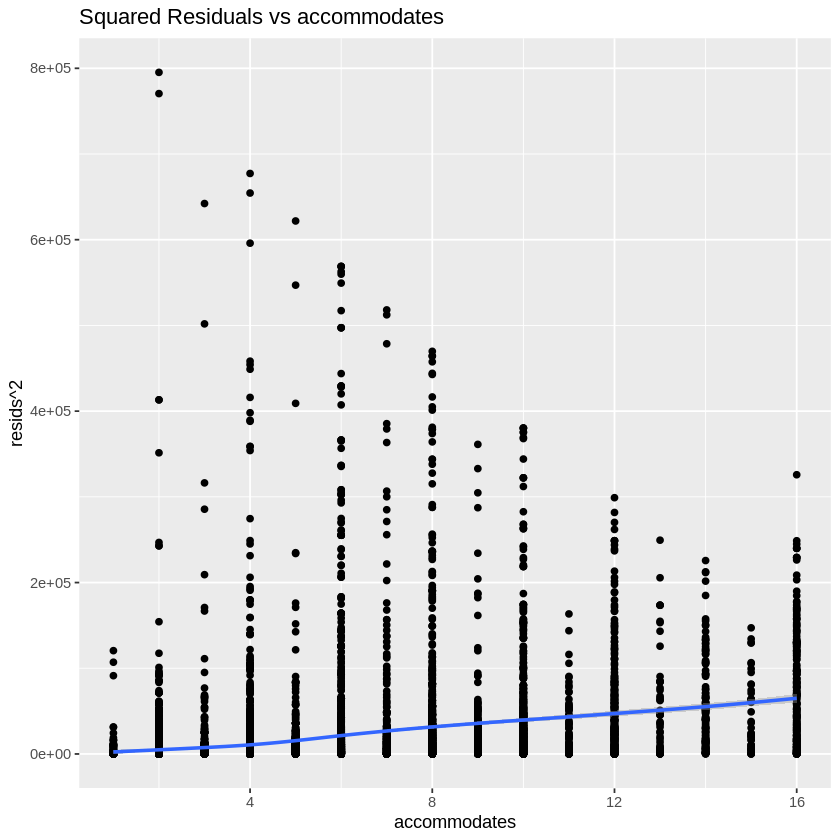

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


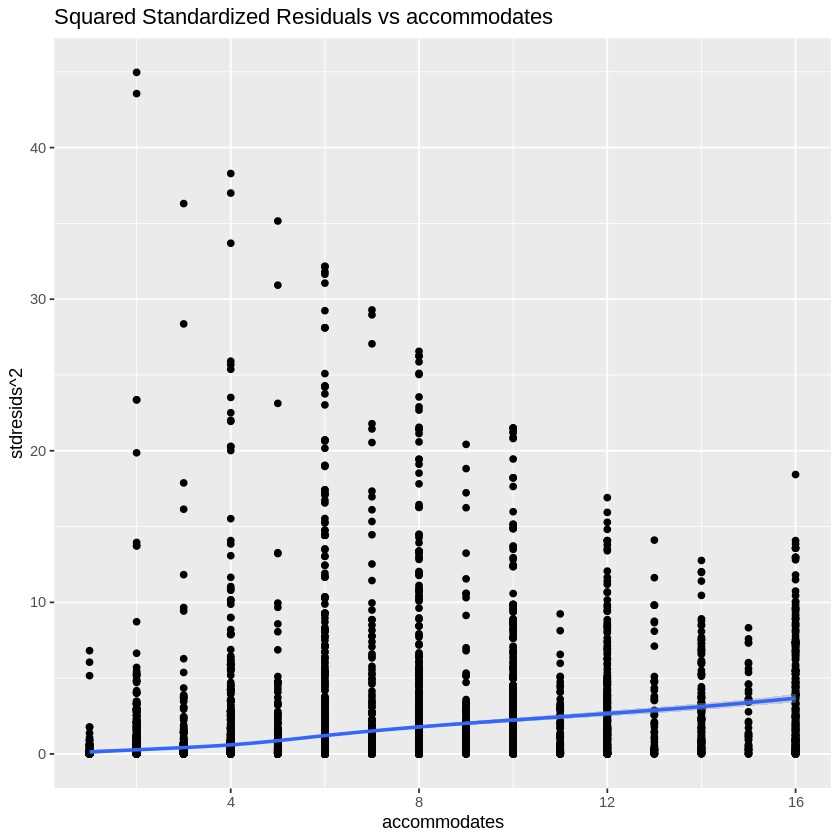

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


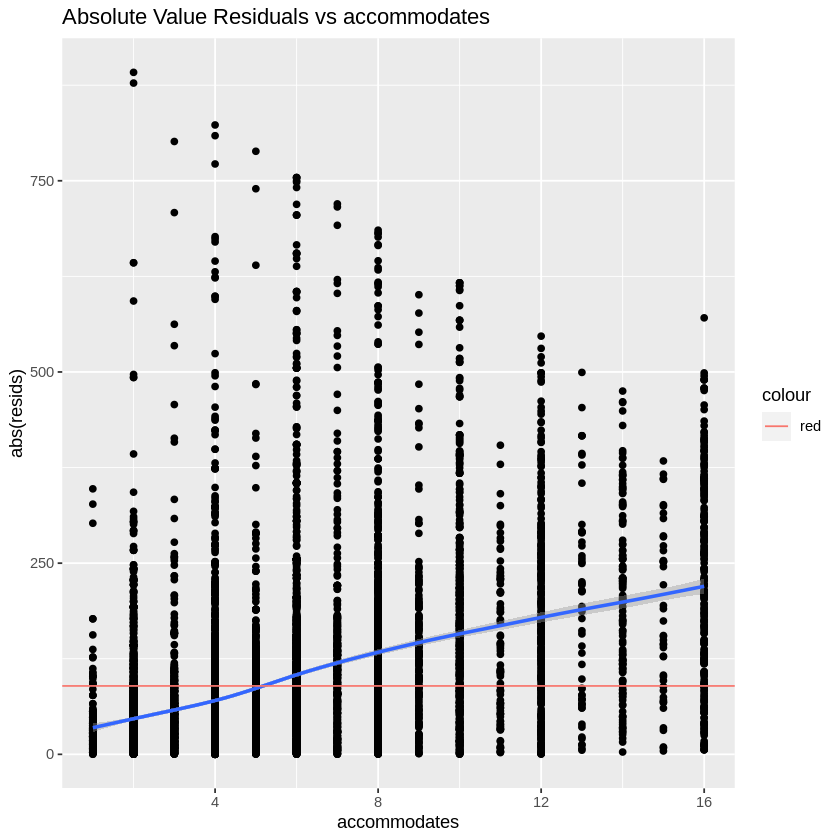

Warning message:
“The dot-dot notation (`..density..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(density)` instead.”


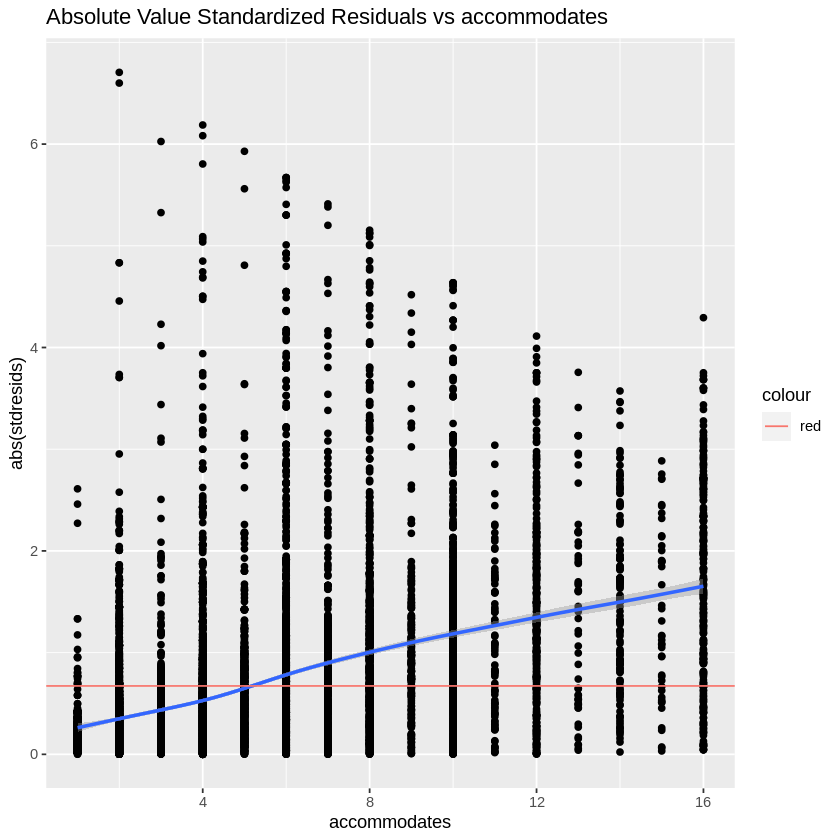

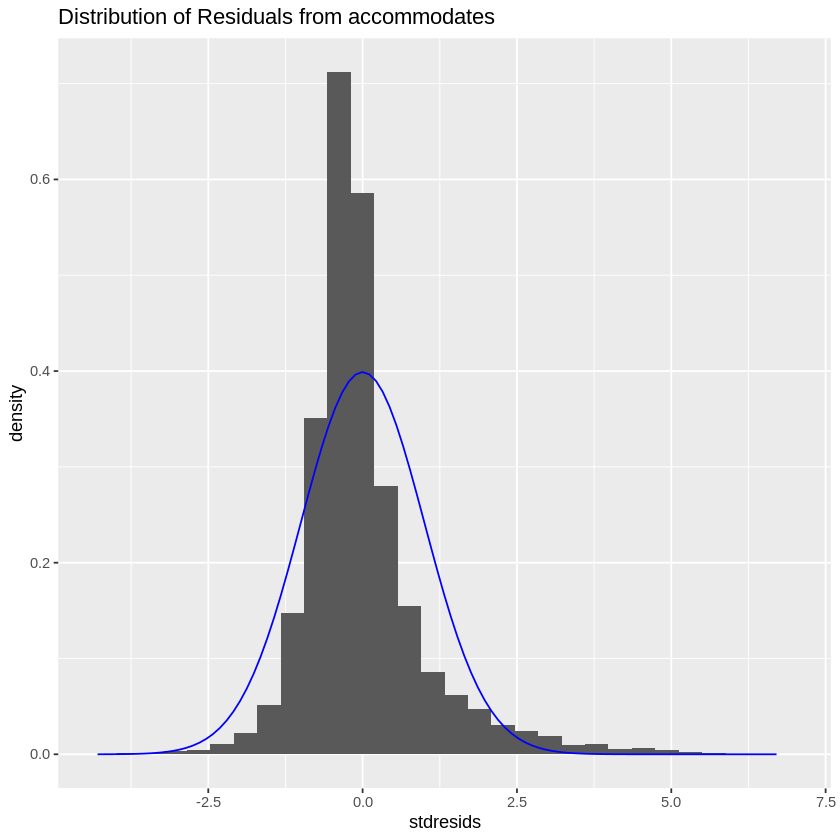

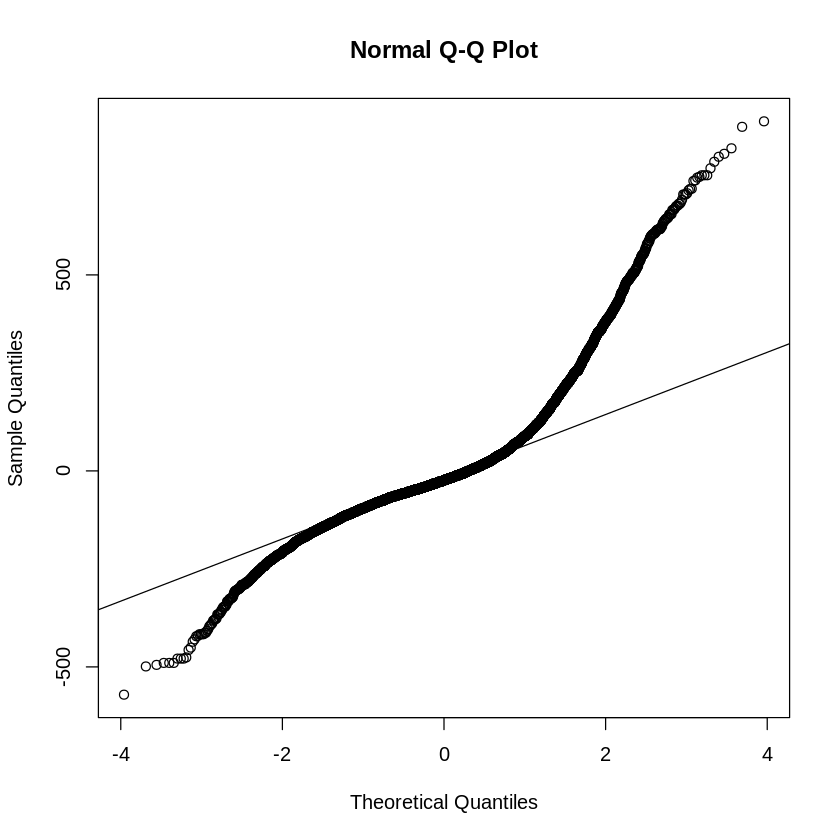

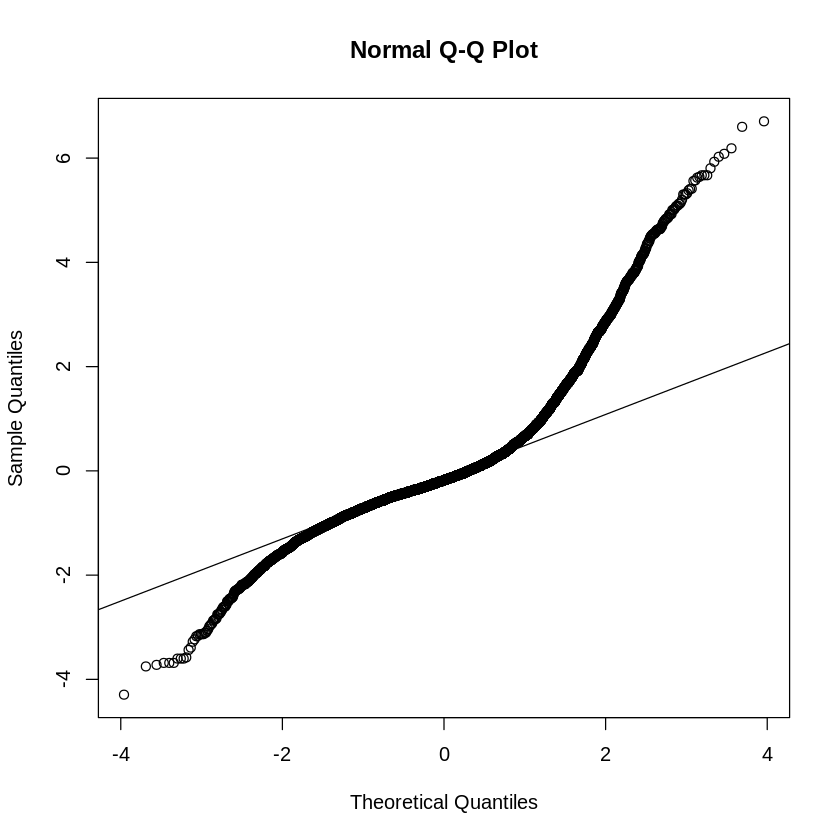

In [ ]:
linear_diagnostics(num.df.listings, accommodates, price)


Based on the diagnostics, the residuals appear to show a sort of non-linear trend, however this is not necessarily supported by the other types of models and their summary statistics.  As a result, this could be due to a concentration of data some levels of accomodates and limited data at the low and high quartiles.  There is, in particular a lack of data at the low end of the number of accomodates, which shows the strongest part of the non-linear trend and so this viual mat be attributed to this.  The residuals to increase toward the higher end of accomodations, indicating heteroskedacisity. An adjustment factor, such as location could help to fix this.  In general, the residuals do appear to be gaussian, with a slightly longer tail in the positive direction, a bootstrap on the parameters can alleviate this issue.
The residuals do appear to have a small amount of correlation as the lag plot has some nonlinearity.  The value of the correlation is ~0.1 which could be as a result of the time period during which the data was taken and how prices moved in general across that period. In general, the simplicity of this linear model makes it the best explainer for the relationship between accomodations and price.

In [ ]:
model_summaries(num.df.listings, beds, price)
cor(num.df.listings$beds, num.df.listings$accommodates)

[1] "Linear Model"

Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-819.51  -77.57  -28.97   38.73  871.03 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        80.6662     1.9517   41.33   <2e-16 ***
unlist(new.df[1])  47.3026     0.5378   87.95   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 138.4 on 13342 degrees of freedom
Multiple R-squared:  0.367,	Adjusted R-squared:  0.3669 
F-statistic:  7735 on 1 and 13342 DF,  p-value: < 2.2e-16

[1] " "
[1] " "
[1] "Squared Model"

Call:
lm(formula = unlist(new.df[2]) ~ poly((unlist(new.df[1])), 2), 
    data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-644.53  -74.47  -26.47   39.51  884.53 

Coefficients:
                               Estimate Std. Error t value Pr(>|t|)    
(Intercept)                     216.161      1.186  182.19   <2e-16 ***

[1] 0.8864173

Looking at the models for the relationship between beds and price, it appears to behave similarly to accomodates which makes sense as there is a strong correlation between beds and accomodates (~0.886), as a result of this colinearity, the model behaves the same with relatively similar summary statistics, as such there are not really benefits to justify a more complicated model beyond the linear.


Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-819.51  -77.57  -28.97   38.73  871.03 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        80.6662     1.9517   41.33   <2e-16 ***
unlist(new.df[1])  47.3026     0.5378   87.95   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 138.4 on 13342 degrees of freedom
Multiple R-squared:  0.367,	Adjusted R-squared:  0.3669 
F-statistic:  7735 on 1 and 13342 DF,  p-value: < 2.2e-16



`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


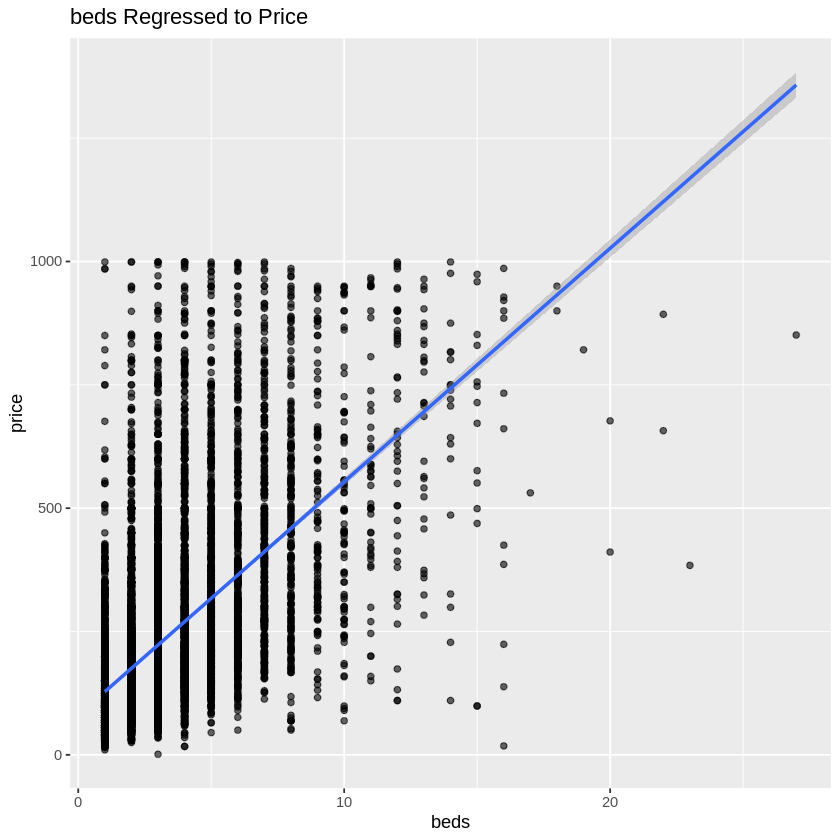

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


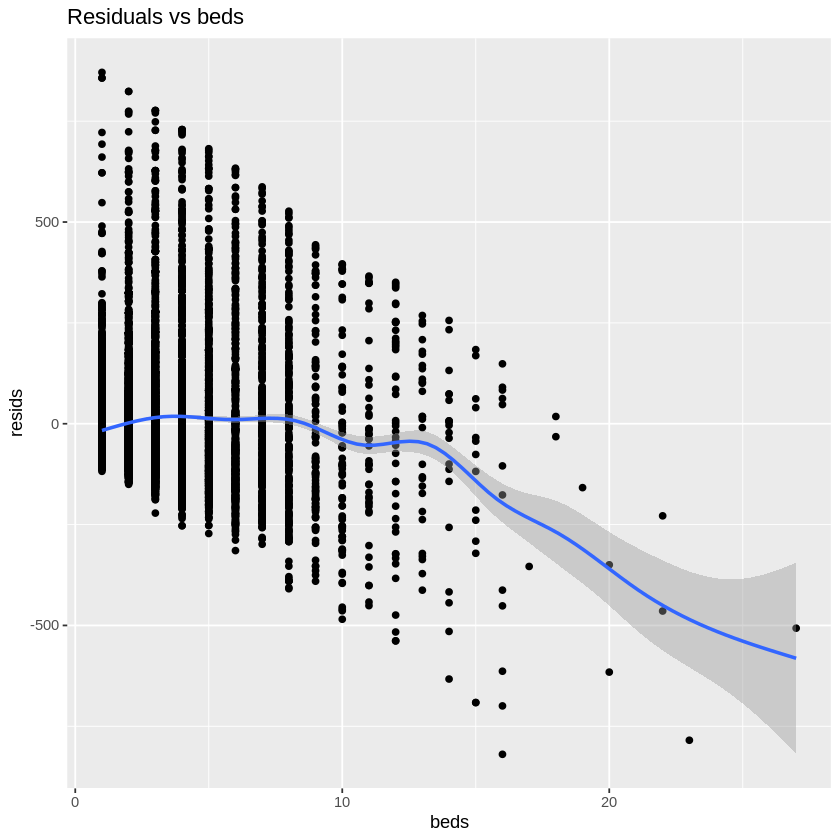

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


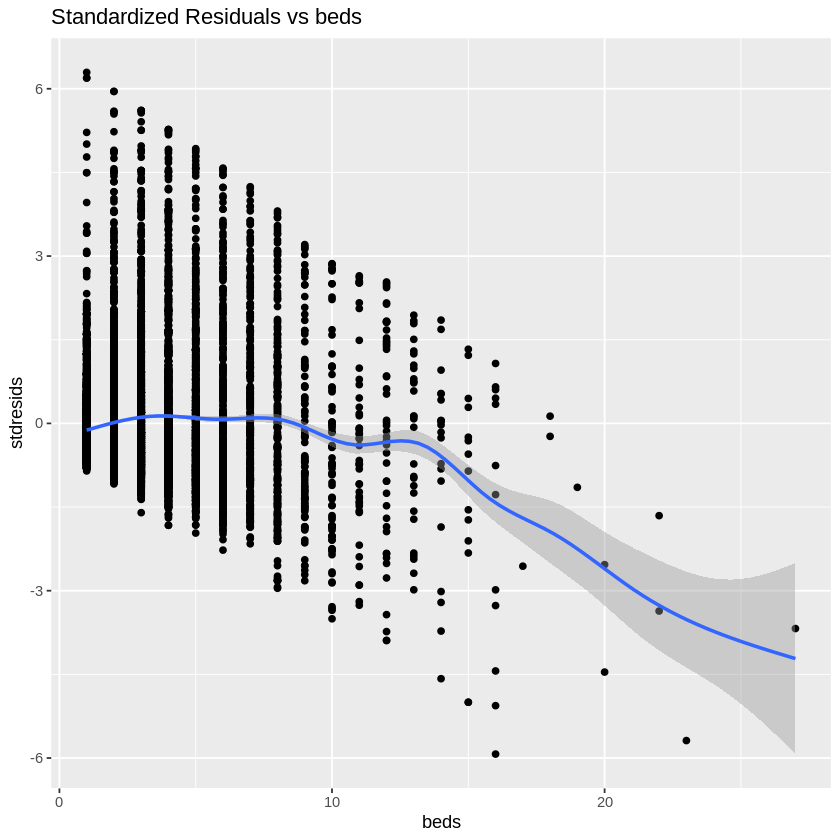

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


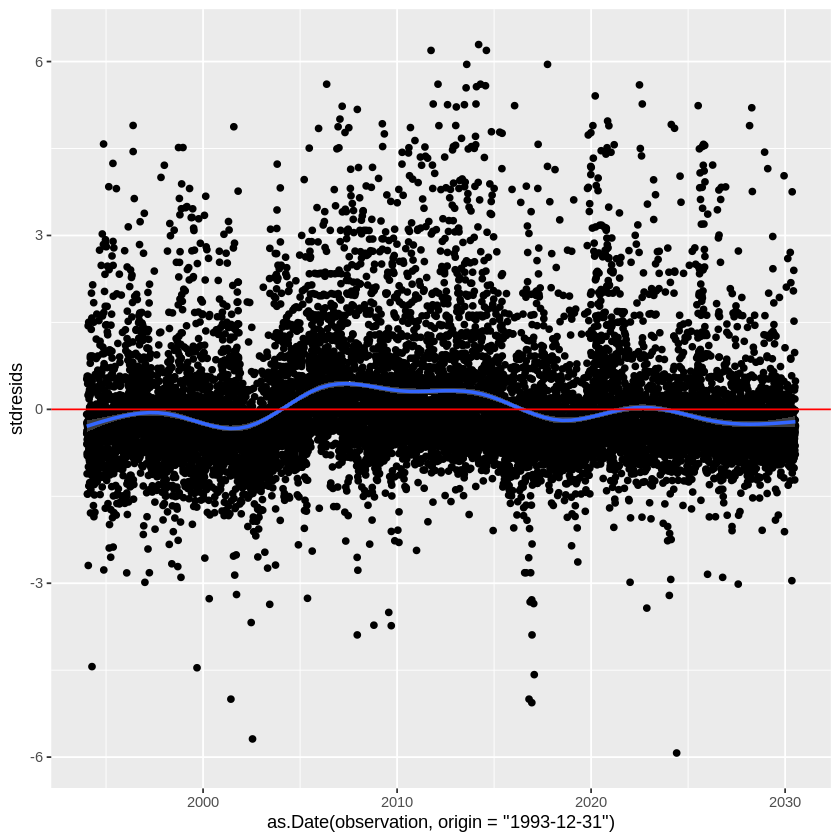

[1] 0.1123369


`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


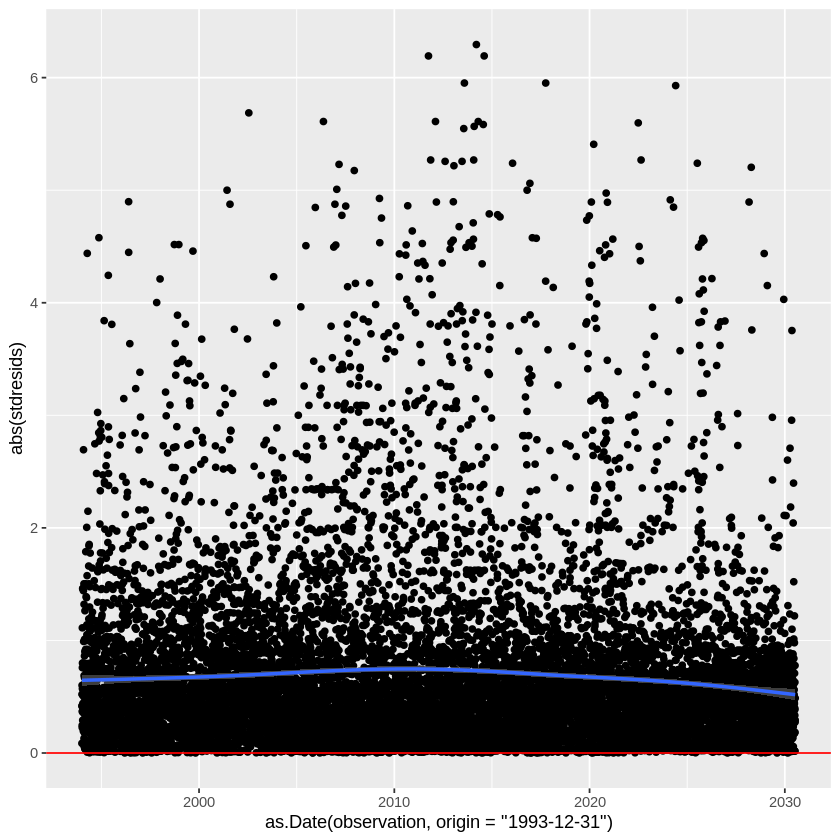

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


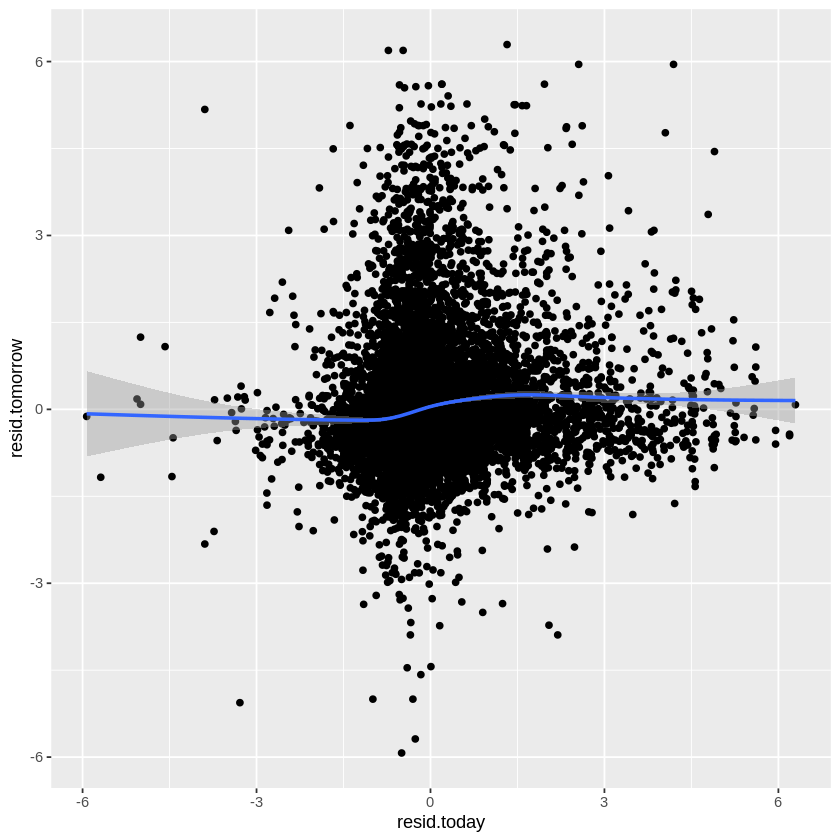

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


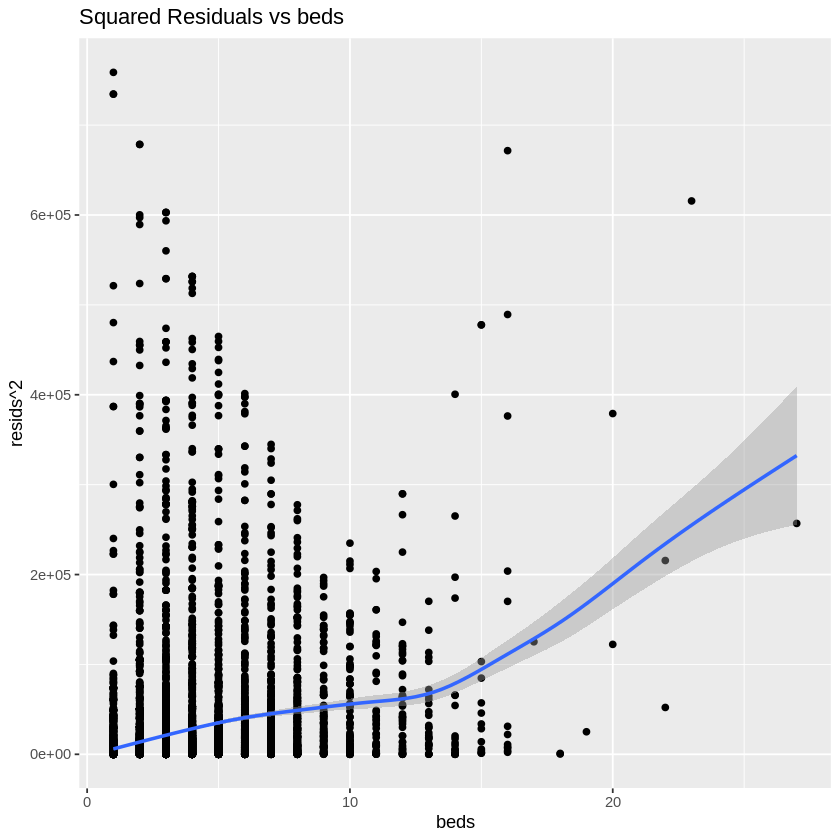

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


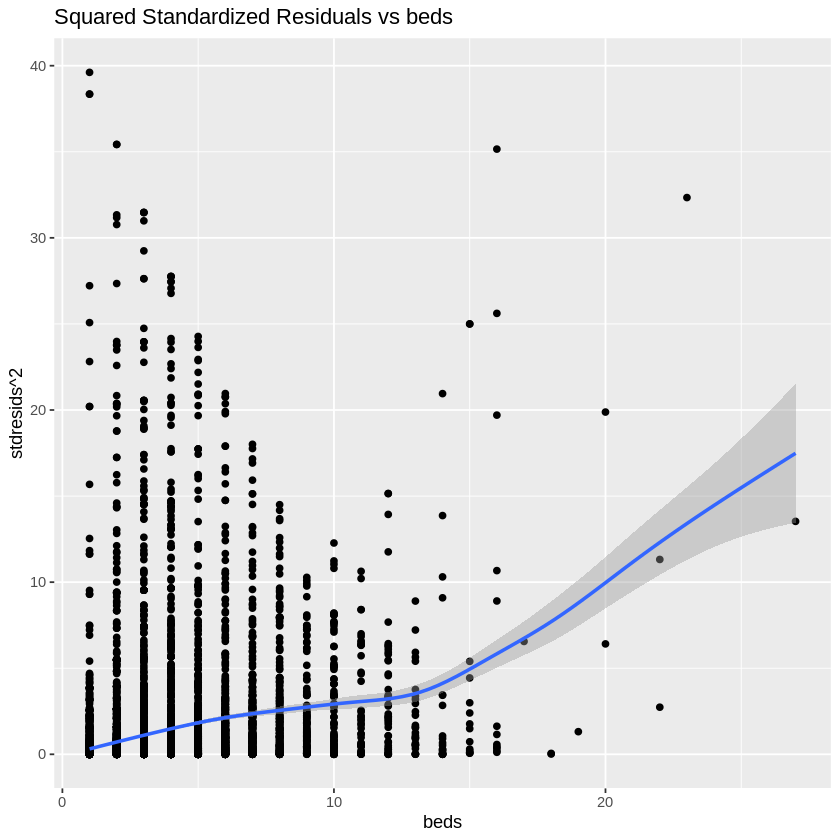

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


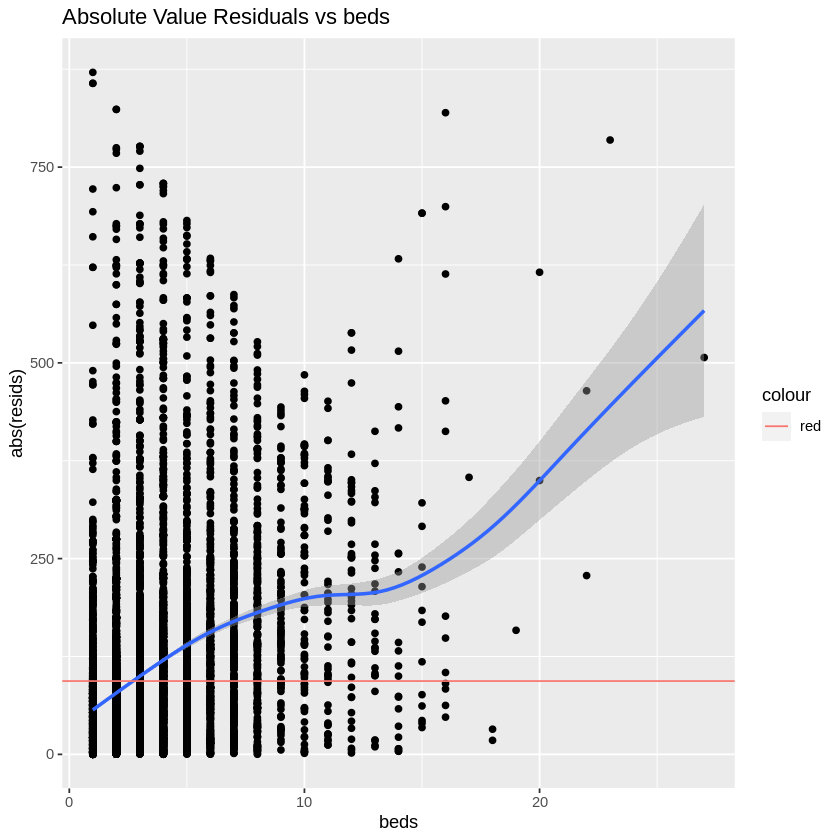

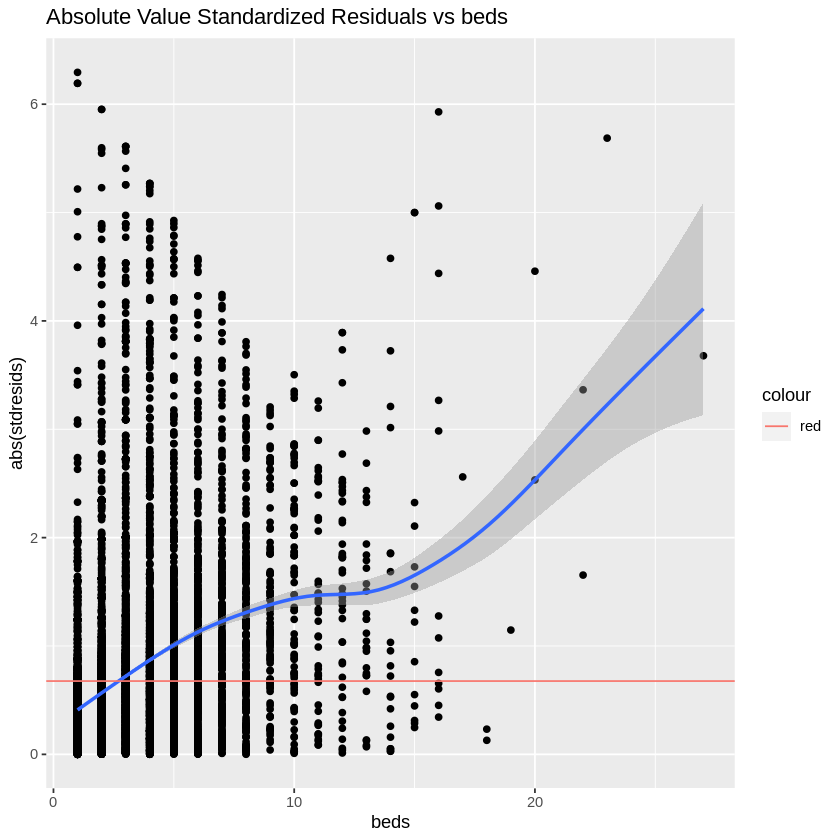

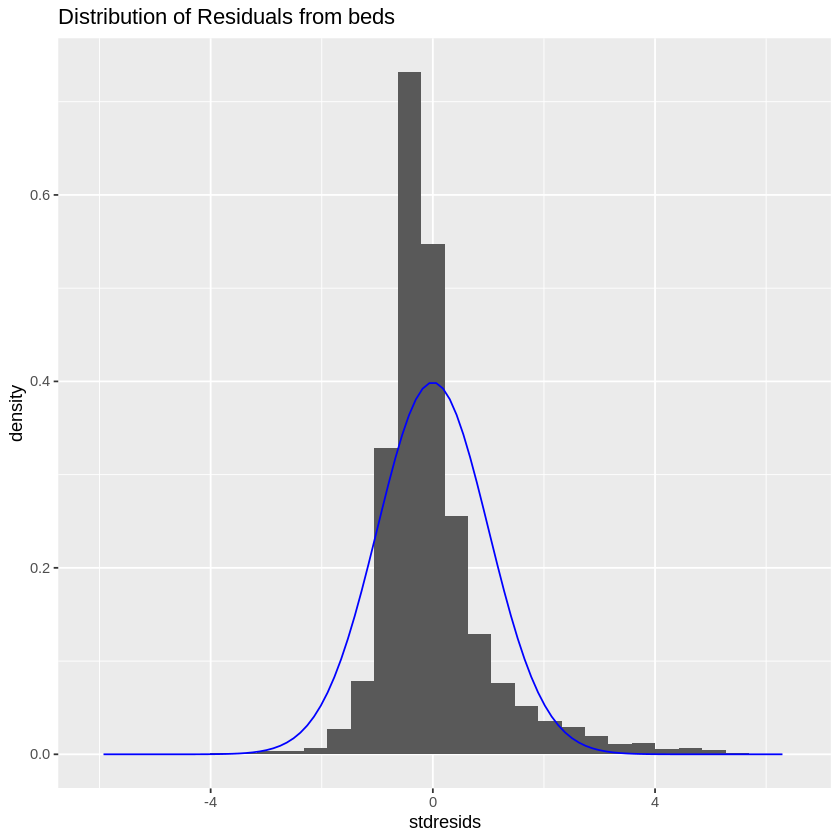

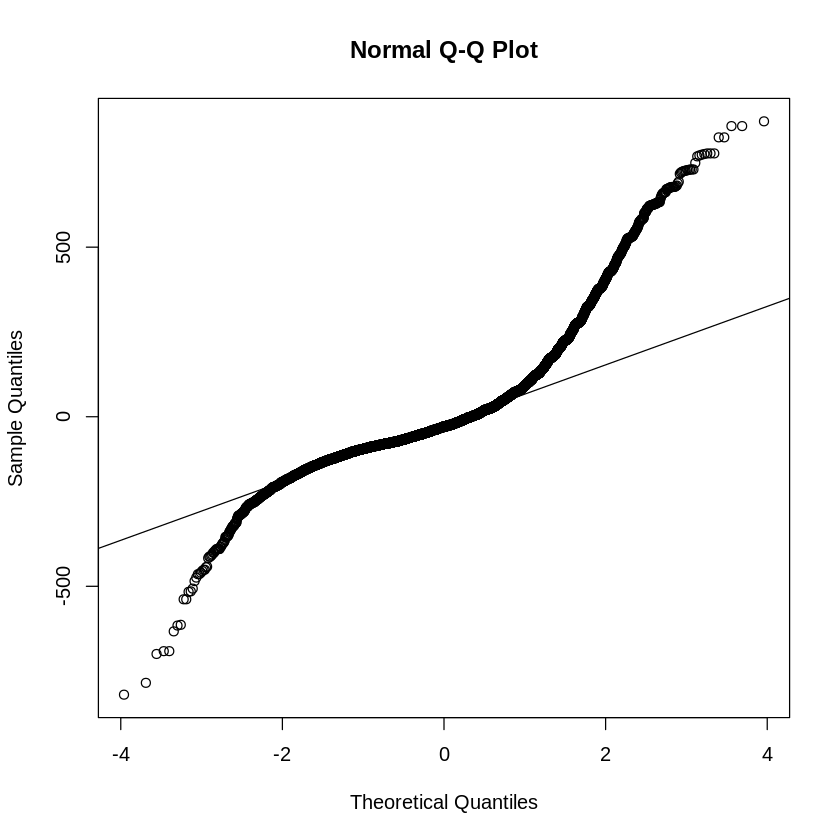

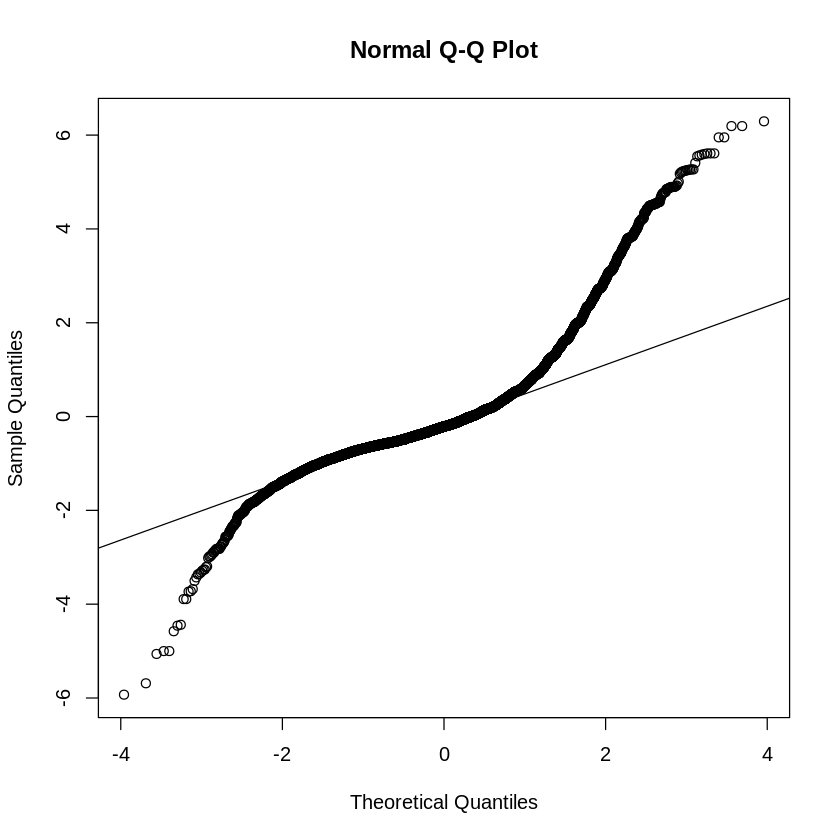

In [ ]:
linear_diagnostics(num.df.listings, beds, price)

Note:The data has an extreme point of a unit with 55 beds with the second highest being less than 30. As is would be surprising that an airbnb could have this many beds, and would still be incredibly unusual if it did, I am removing this point from the dataset as it strongly affects the diagnostic plots.

Based on the diagnostics, the residuals appear to show a sort of non-linear trend, this is minorly supported by a slight improvement in RSD and R^2 from the squared and cubic models.  
However, this improvement is very limited and does not justify making the model more complicated as it does not better explain the relationship.  
This could be due to a concentration of data some levels of accomodates and limited data at the high quartile.  
This lack of data at the high end of the number of beds, which shows the strongest part of the non-linear trend and so this visual may be attributed to this.  The residuals do increase toward the higher end of accomodations, indicating heteroskedacisity. An adjustment factor,  could help to explain whether this comes from beds or another factor .  
The residuals do appear to be normal in the bulk of the data, following the assumption of gaussian error assumed by the model summary. 
The residuals do appear to have a small amount of correlation as the lag plot has some nonlinearity.  The value of the correlation is ~0.1 which could be as a result of the time period during which the data was taken and how prices moved in general across that period. In general, the simplicity of this linear model makes it the best simple explainer for the relationship between accomodations and price.

In [ ]:
cor(num.df.listings$accommodates, num.df.listings$bedrooms)

[1] 0.8619873

In [ ]:
model_summaries(num.df.listings, bedrooms, price)

[1] "Linear Model"

Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-934.28  -72.57  -23.44   41.43  881.43 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        24.8258     2.2945   10.82   <2e-16 ***
unlist(new.df[1])  92.7452     0.9608   96.53   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 133.5 on 13342 degrees of freedom
Multiple R-squared:  0.4112,	Adjusted R-squared:  0.4111 
F-statistic:  9317 on 1 and 13342 DF,  p-value: < 2.2e-16

[1] " "
[1] " "
[1] "Squared Model"

Call:
lm(formula = unlist(new.df[2]) ~ poly((unlist(new.df[1])), 2), 
    data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-930.08  -72.46  -23.45   41.54  881.54 

Coefficients:
                               Estimate Std. Error t value Pr(>|t|)    
(Intercept)                     216.161      1.156 187.058   <2e-16 **

Looking at the models for the relationship between bedrooms and price, it appears to behave similarly to accomodates which makes sense as there is a strong correlation between beds and accomodates (~0.862), as a result of this colinearity, the model behaves the same with relatively similar summary statistics, as such there are not really benefits to justify a more complicated model beyond the linear.


Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-934.28  -72.57  -23.44   41.43  881.43 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        24.8258     2.2945   10.82   <2e-16 ***
unlist(new.df[1])  92.7452     0.9608   96.53   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 133.5 on 13342 degrees of freedom
Multiple R-squared:  0.4112,	Adjusted R-squared:  0.4111 
F-statistic:  9317 on 1 and 13342 DF,  p-value: < 2.2e-16



`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


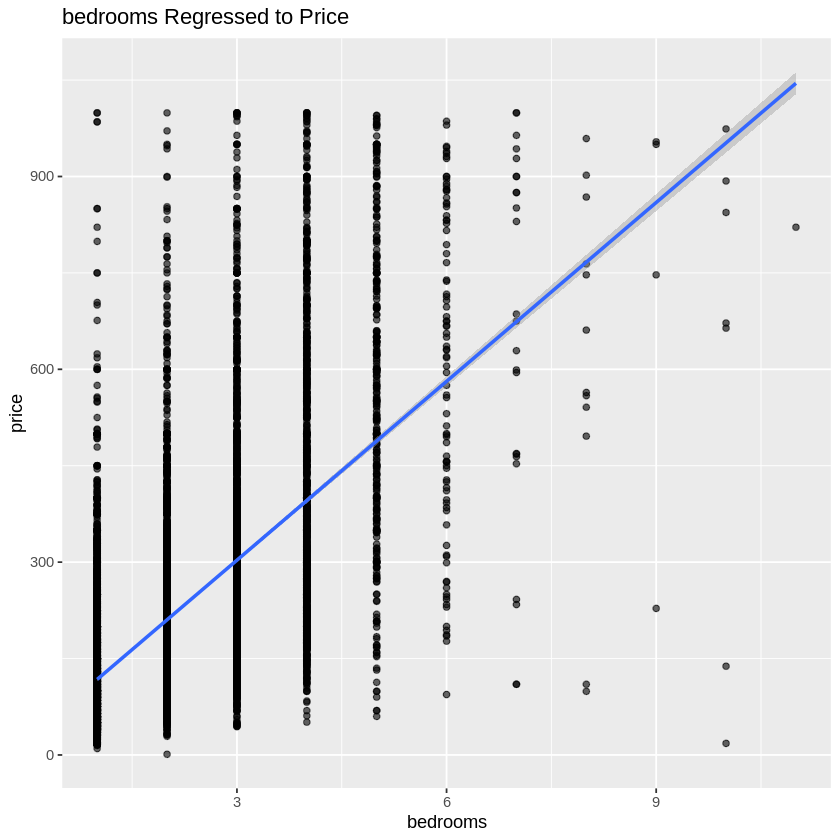

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


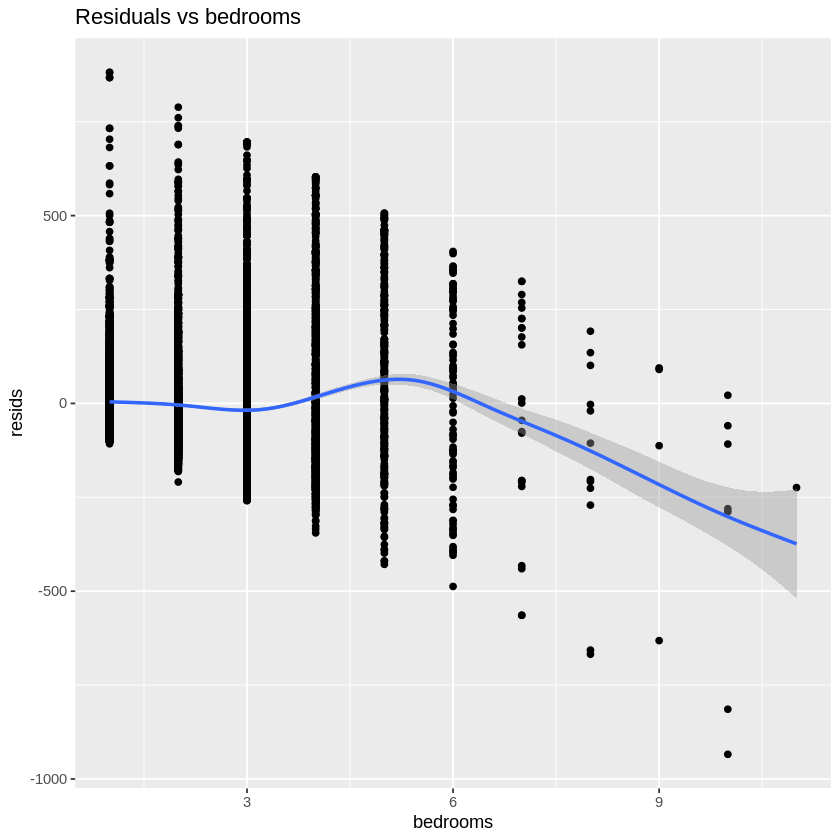

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


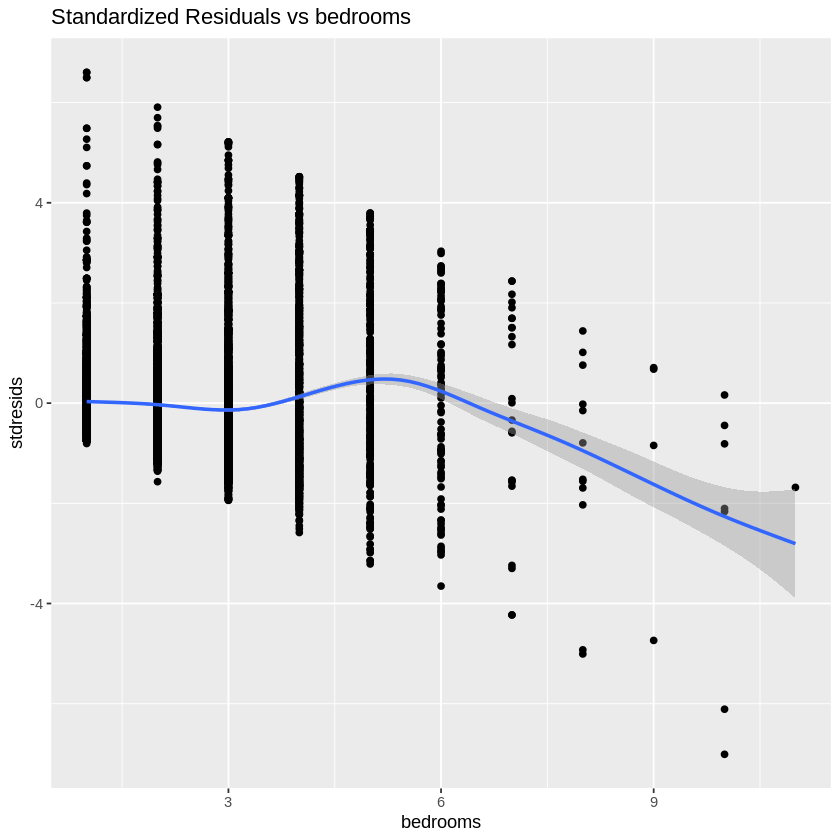

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


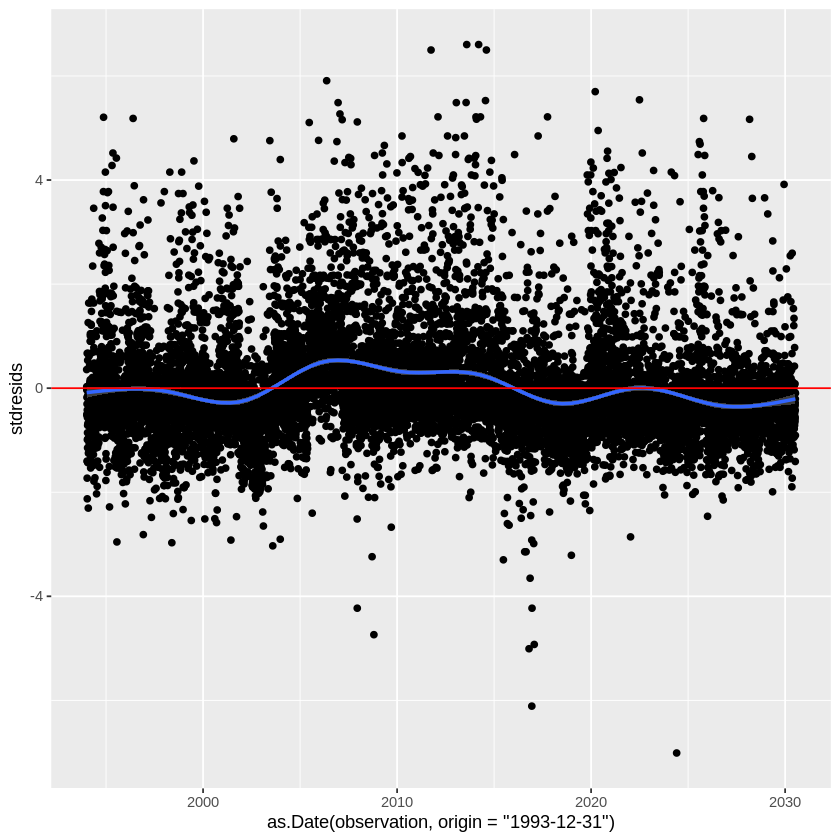

[1] 0.1396644


`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


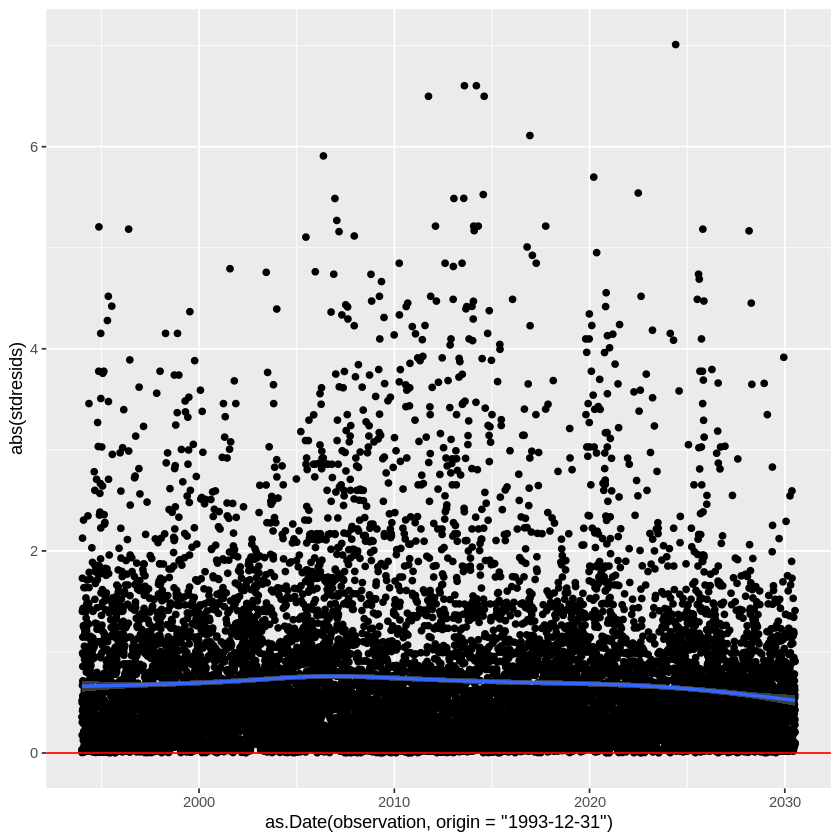

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


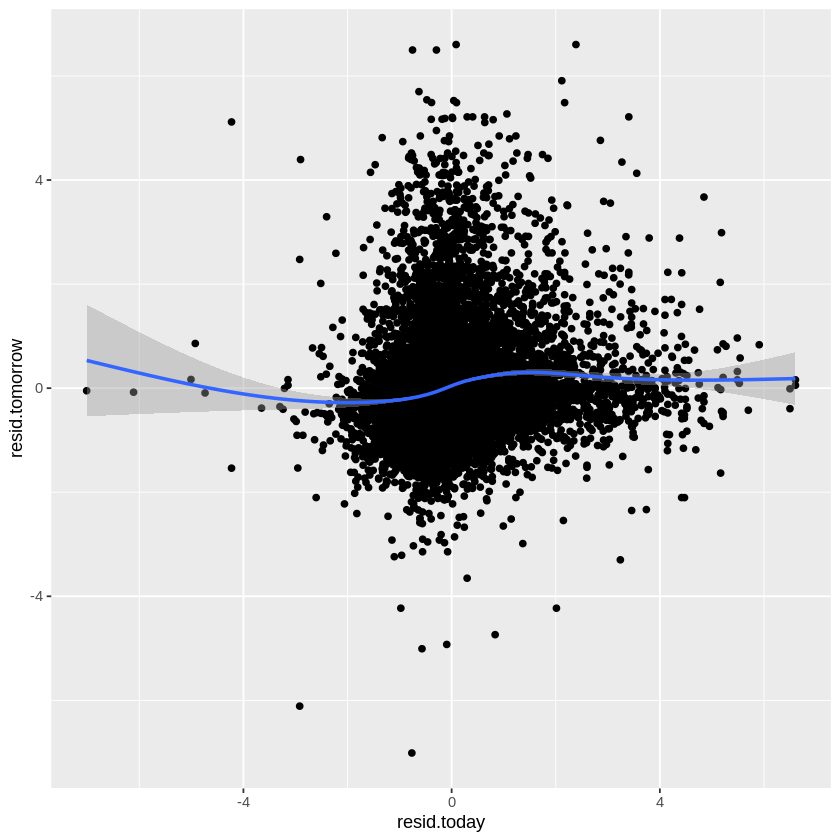

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


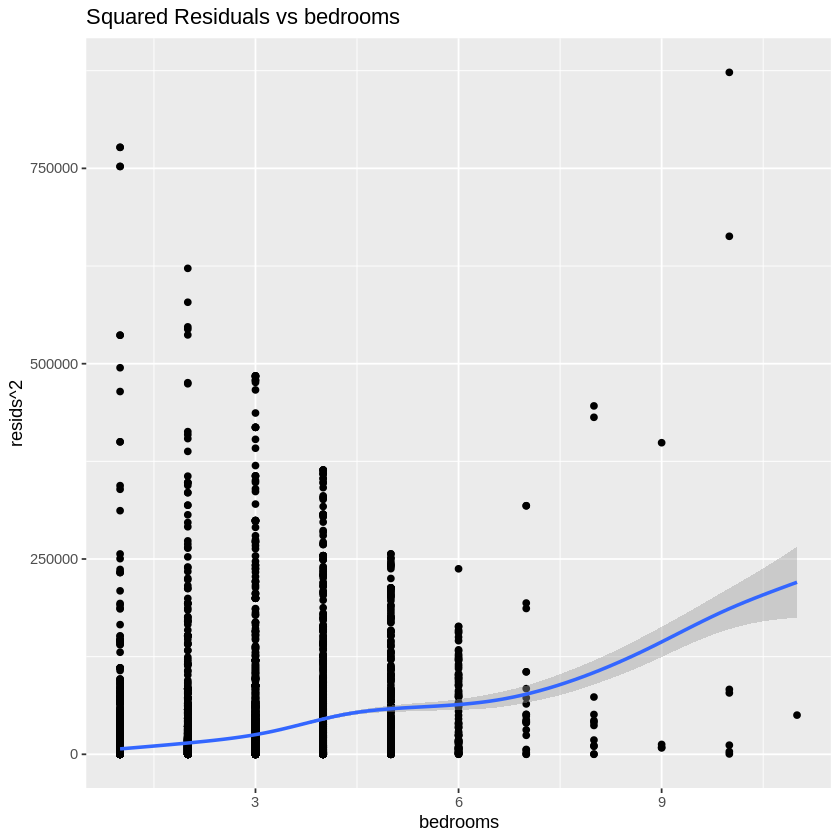

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


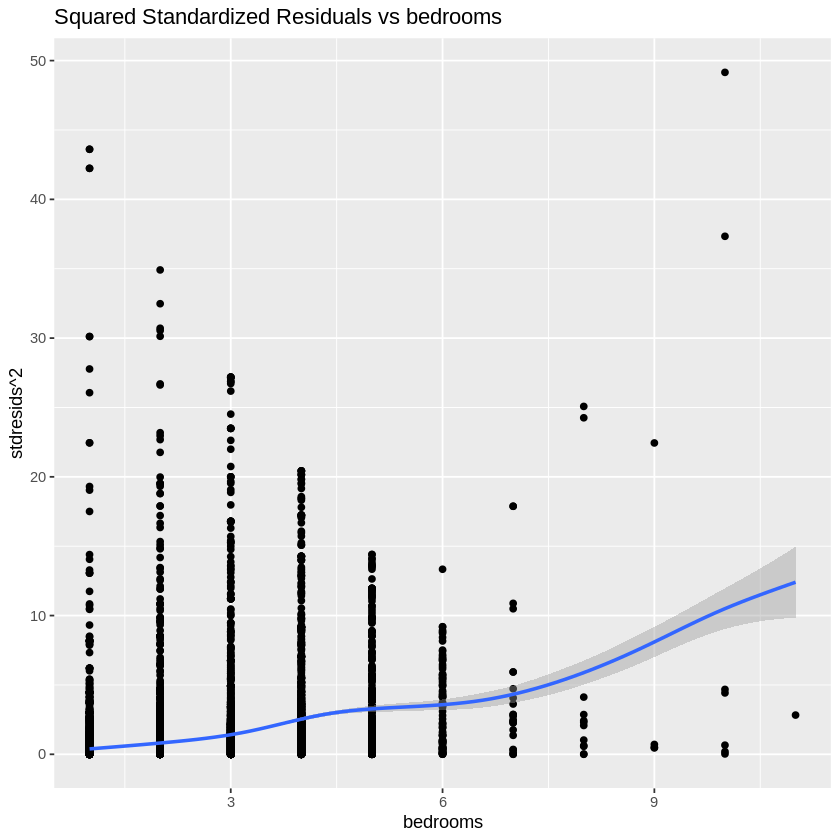

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


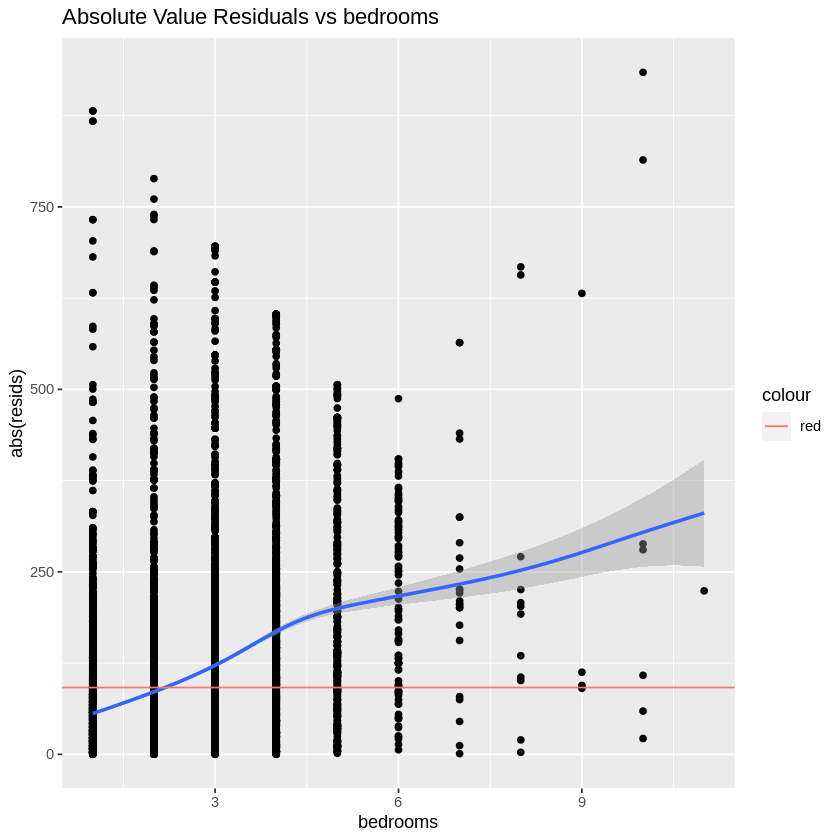

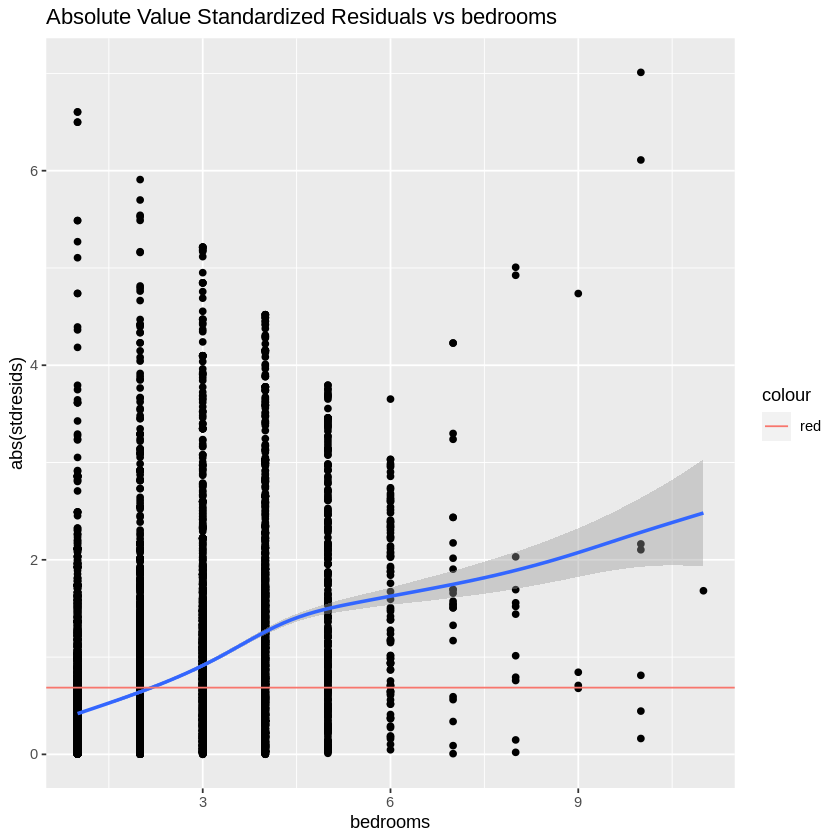

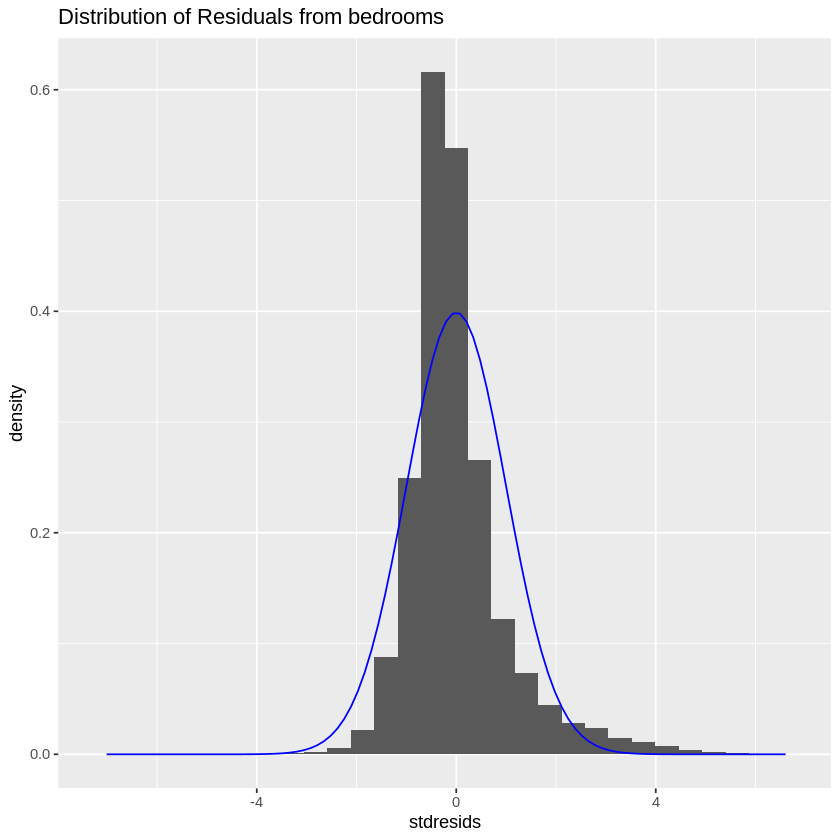

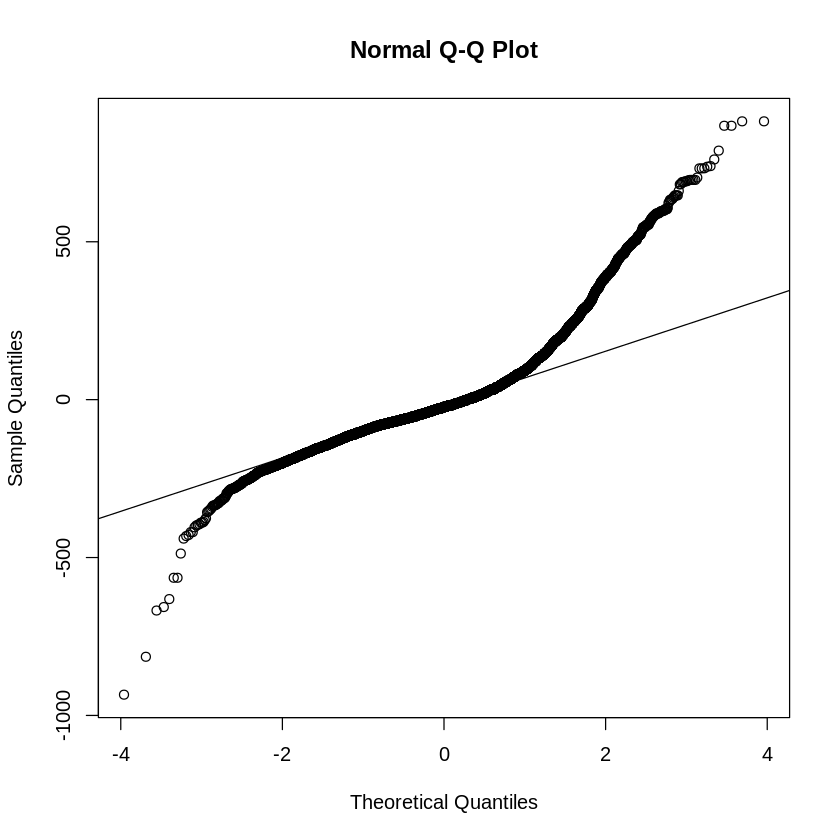

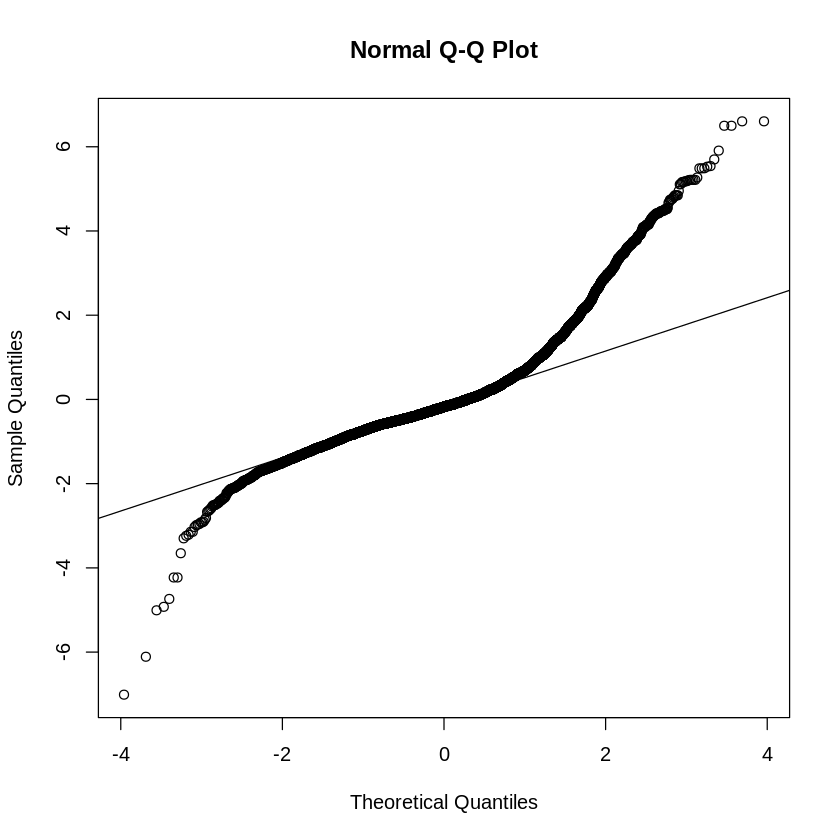

In [ ]:
linear_diagnostics(num.df.listings, bedrooms, price)

All the things that were explained by the relationship with bedrooms appear to be true as a result, please refer to the write up of that model for interpretation of the diagnostics.

In [ ]:
cor(num.df.listings$beds, num.df.listings$bedrooms)

[1] 0.8198953

In [ ]:
model_summaries(num.df.listings, median_price_SQFT, price)

[1] "Linear Model"

Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-252.11 -113.88  -51.84   52.54  809.68 

Coefficients:
                   Estimate Std. Error t value Pr(>|t|)    
(Intercept)       1.633e+02  3.727e+00   43.81   <2e-16 ***
unlist(new.df[1]) 1.174e-01  7.575e-03   15.49   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 172.4 on 13342 degrees of freedom
Multiple R-squared:  0.01767,	Adjusted R-squared:  0.0176 
F-statistic:   240 on 1 and 13342 DF,  p-value: < 2.2e-16

[1] " "
[1] " "
[1] "Squared Model"

Call:
lm(formula = unlist(new.df[2]) ~ poly((unlist(new.df[1])), 2), 
    data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-269.35 -113.13  -52.27   51.32  802.18 

Coefficients:
                              Estimate Std. Error t value Pr(>|t|)    
(Intercept)                    216.161      1.492 144.906  < 2e-16 

There is a very limited improvement across all models from the linear model.  The linear model is the simplest and as a result that may be the best choice for interpretation.  Note, none of the R^2 values for any of the models are (greater than 0.01), as a result this is likely a poor individual predictor of price by itself, but may be important to add to a larger model. 


Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-252.11 -113.88  -51.84   52.54  809.68 

Coefficients:
                   Estimate Std. Error t value Pr(>|t|)    
(Intercept)       1.633e+02  3.727e+00   43.81   <2e-16 ***
unlist(new.df[1]) 1.174e-01  7.575e-03   15.49   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 172.4 on 13342 degrees of freedom
Multiple R-squared:  0.01767,	Adjusted R-squared:  0.0176 
F-statistic:   240 on 1 and 13342 DF,  p-value: < 2.2e-16



`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


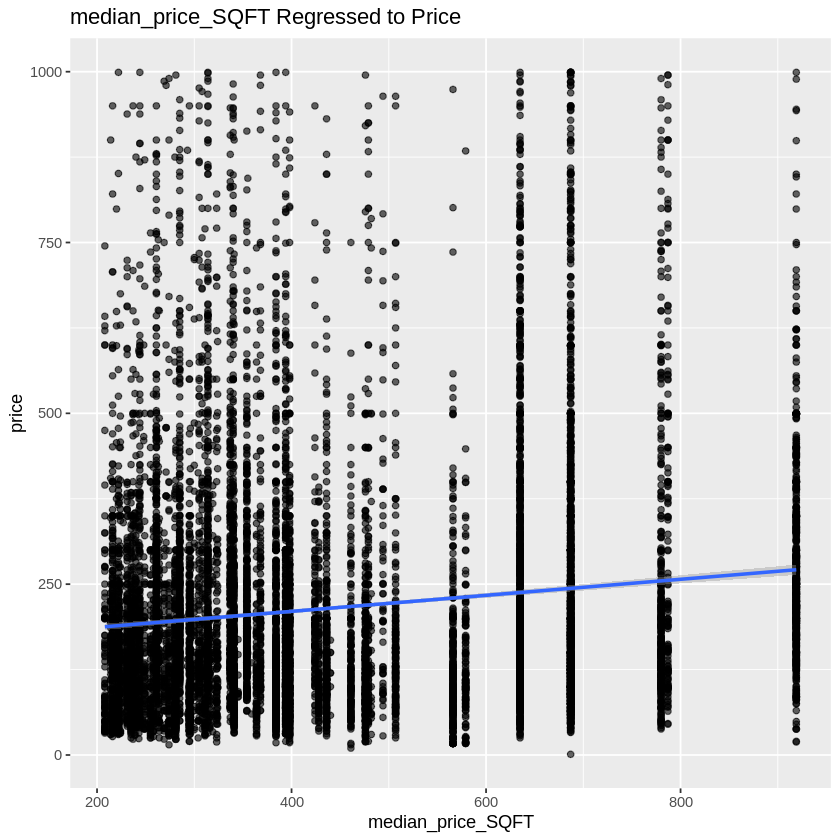

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


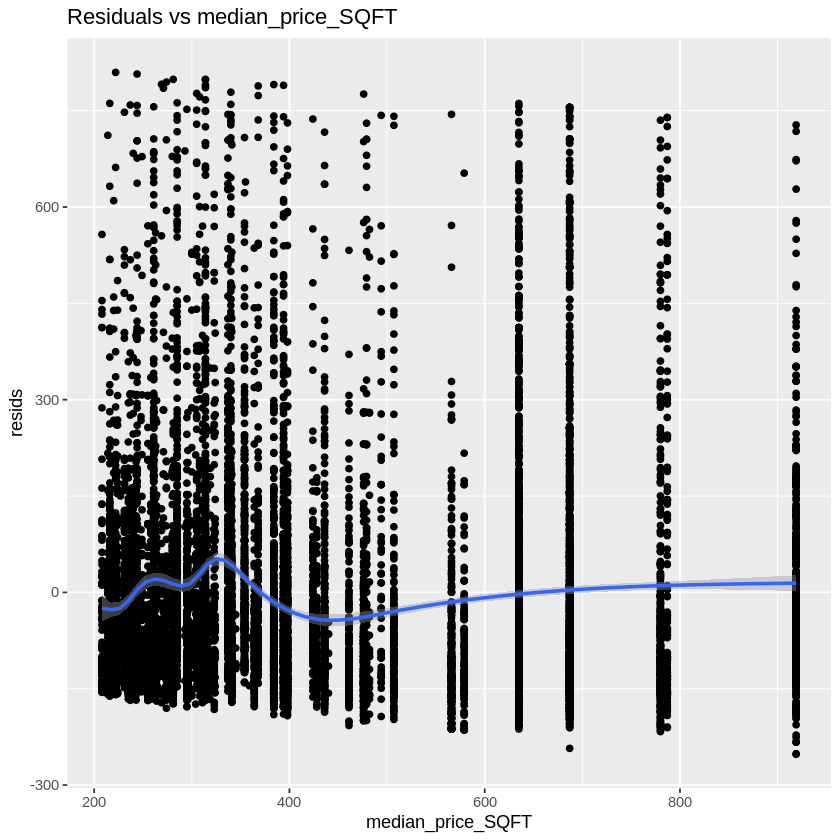

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


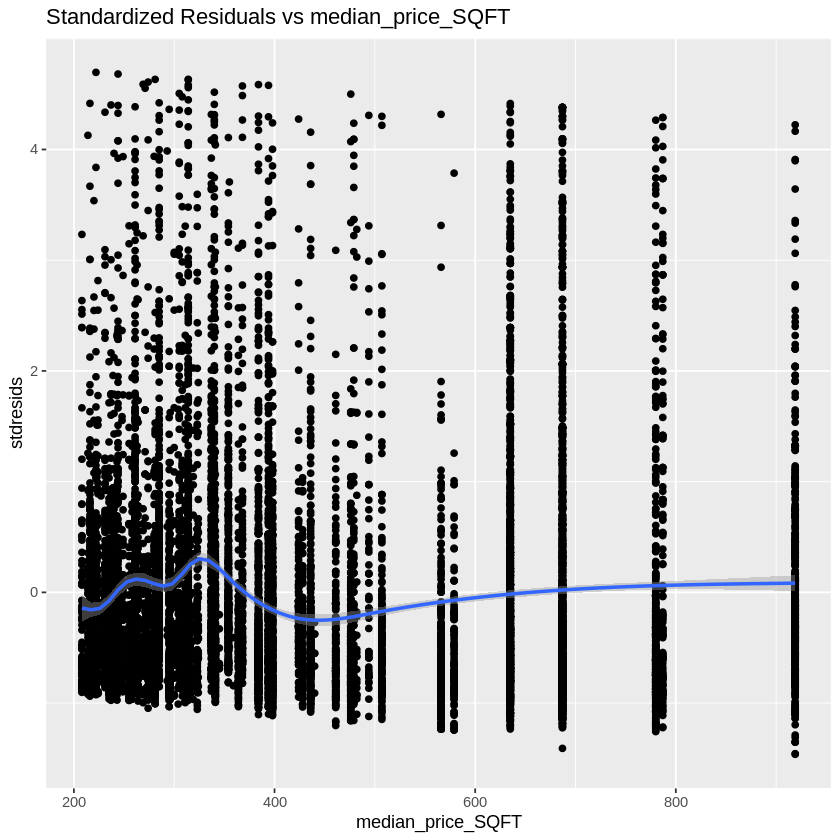

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


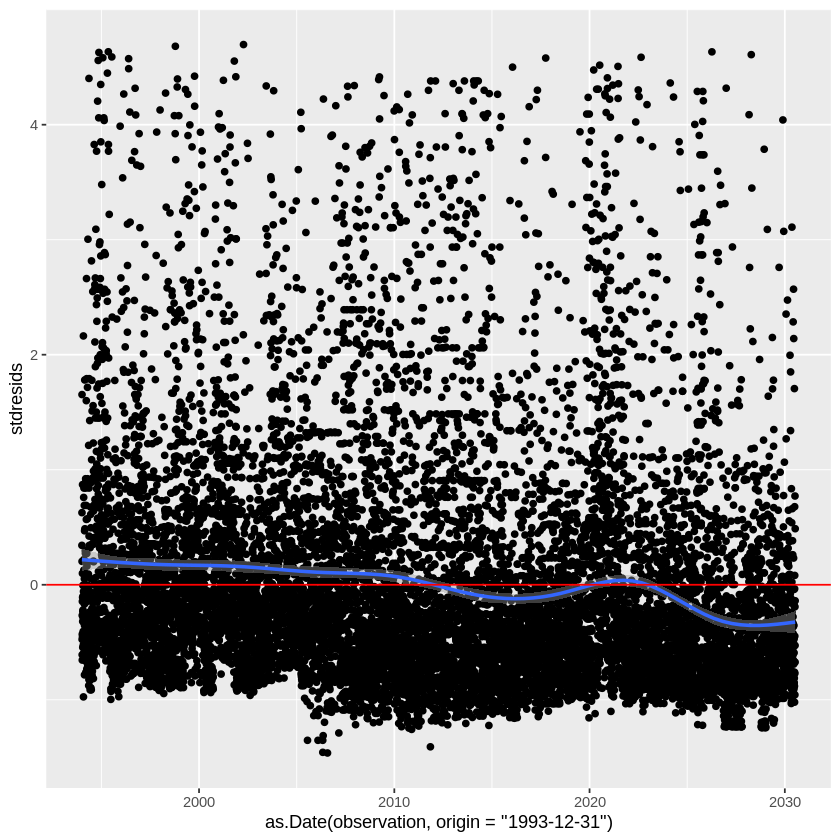

[1] 0.08514432


`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


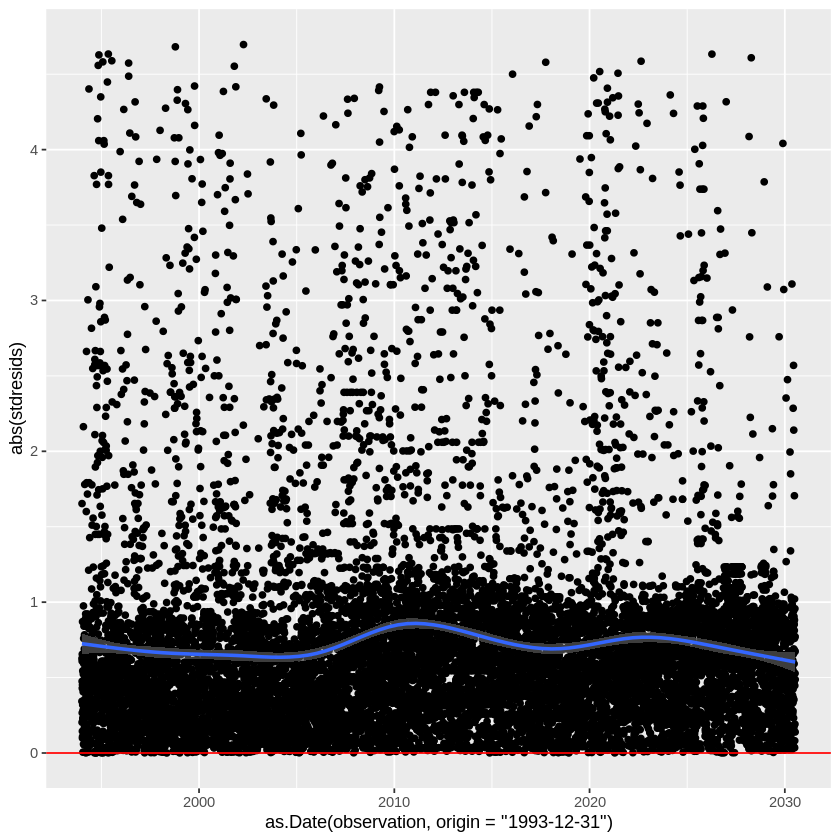

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


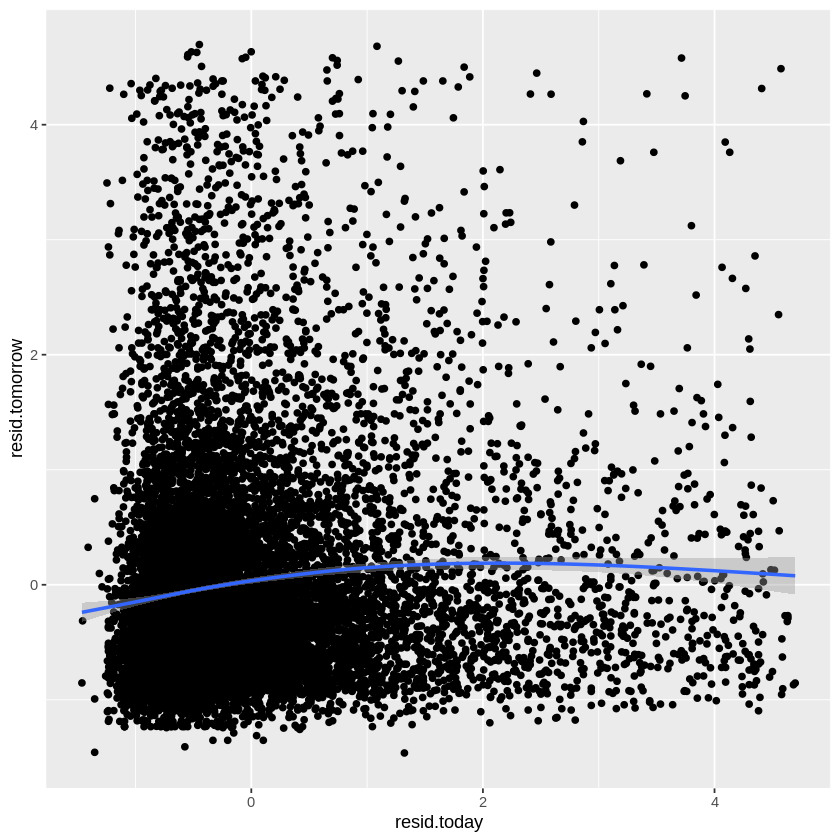

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


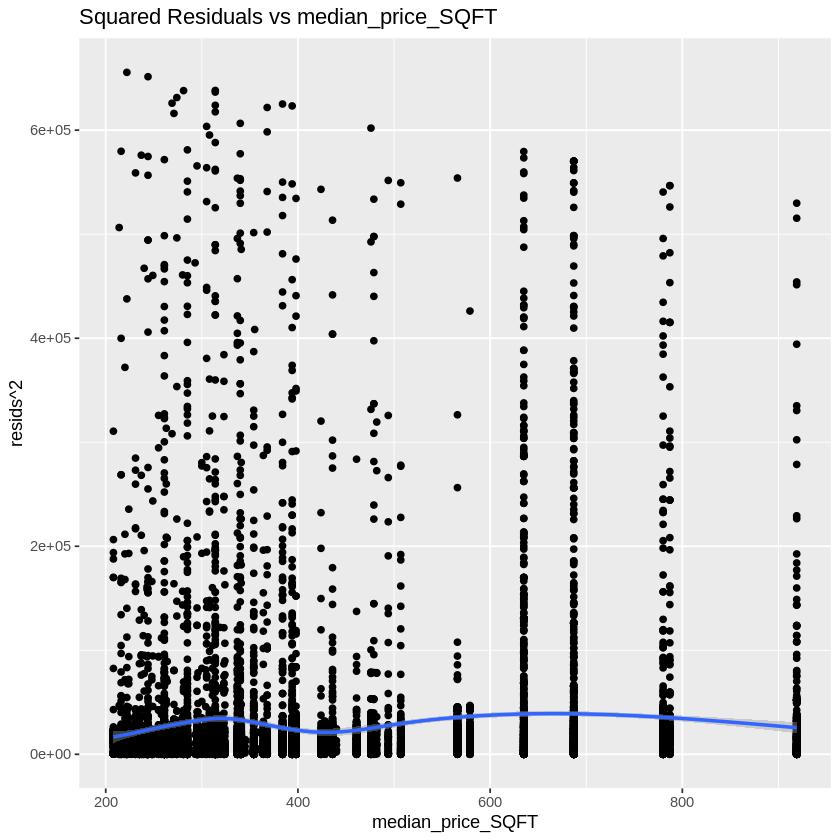

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


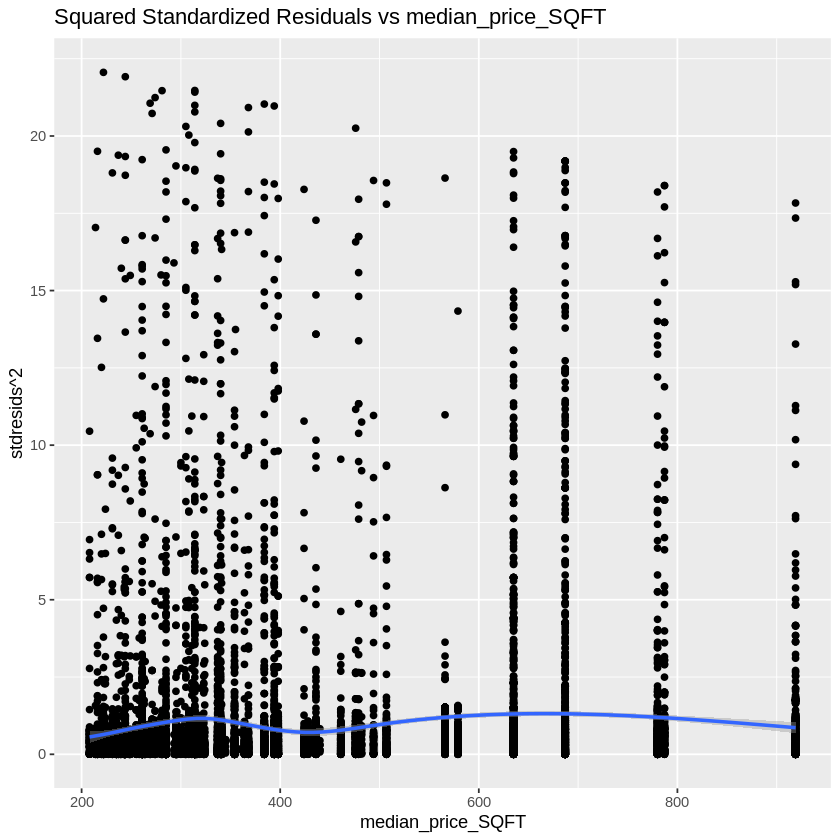

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


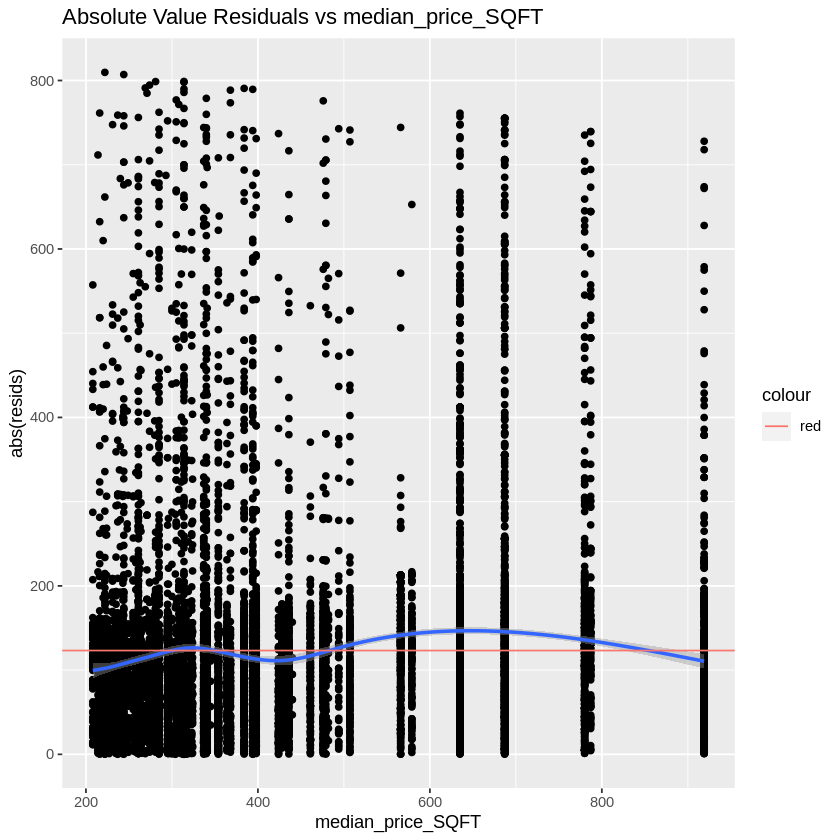

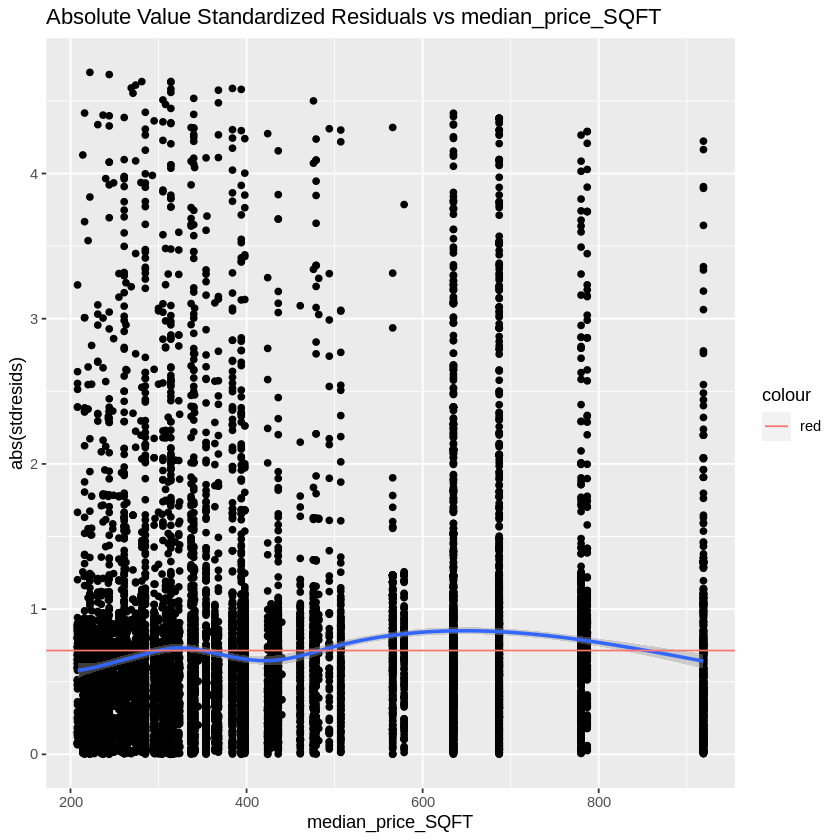

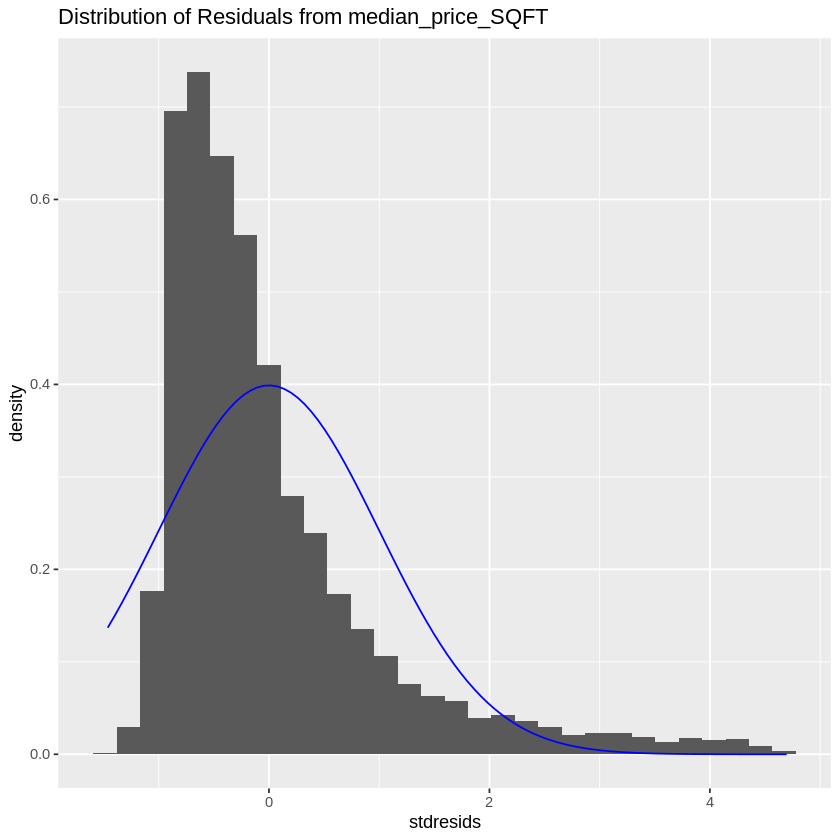

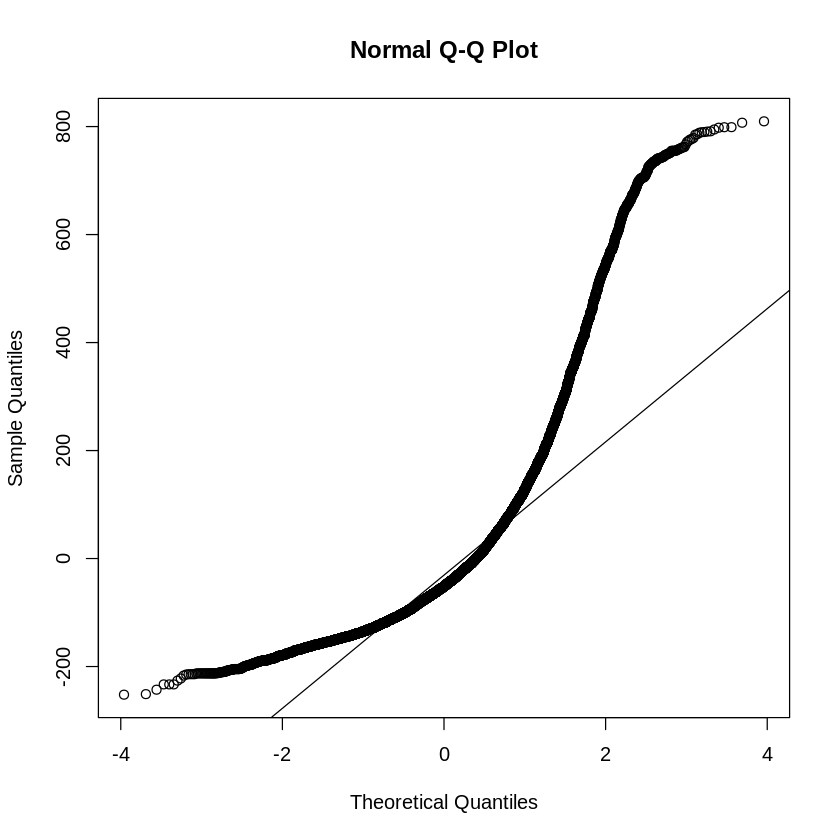

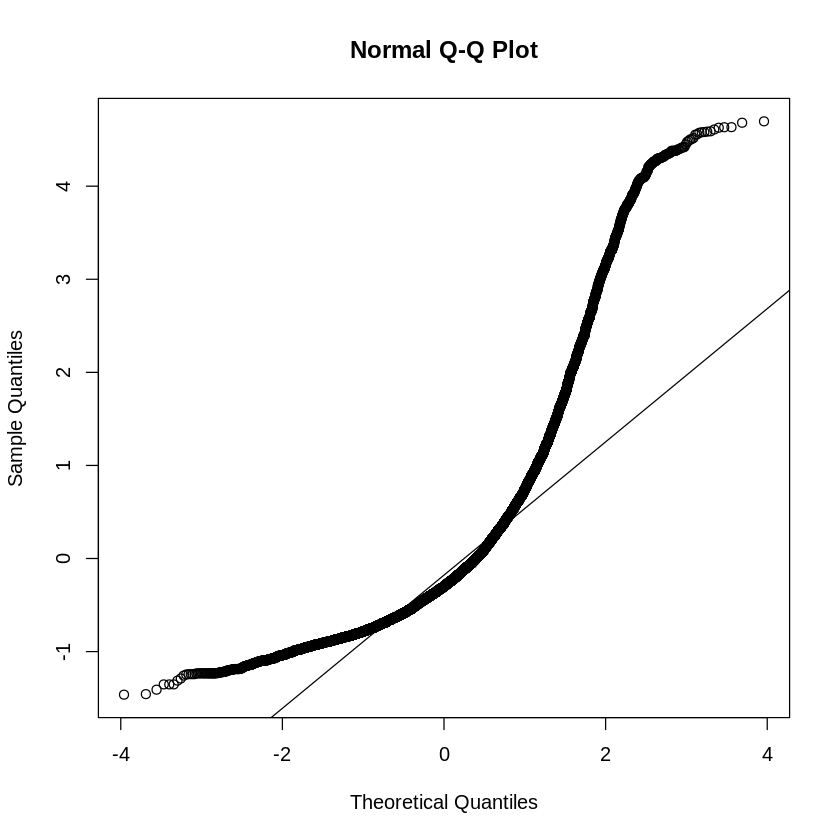

In [ ]:
linear_diagnostics(num.df.listings, median_price_SQFT, price)

From a model perspective, the residuals do have an average very close to zero, as would be expected from a good model.  There is a small correlation between lag values of (0.08) a low correlation is to be expected, and so this is not particularly concerning.  The error does seem homoskedastic with the error at each point in the model hovering around the mean.  The error is far from normal with a strong bias to the positive tail.  If this were used as an individual model, boostrapping could be used to help limit any misinterpretation from the model summary values. 

In [ ]:
model_summaries(num.df.listings, total_listing_count, price)

[1] "Linear Model"

Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-220.78 -114.12  -52.57   51.06  786.39 

Coefficients:
                   Estimate Std. Error t value Pr(>|t|)    
(Intercept)       208.39594    2.78051  74.949  < 2e-16 ***
unlist(new.df[1])   0.04958    0.01493   3.322 0.000897 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 173.9 on 13342 degrees of freedom
Multiple R-squared:  0.0008263,	Adjusted R-squared:  0.0007514 
F-statistic: 11.03 on 1 and 13342 DF,  p-value: 0.0008972

[1] " "
[1] " "
[1] "Squared Model"

Call:
lm(formula = unlist(new.df[2]) ~ poly((unlist(new.df[1])), 2), 
    data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-229.19 -112.65  -51.73   50.31  828.28 

Coefficients:
                               Estimate Std. Error t value Pr(>|t|)    
(Intercept)                     216.161      1.502 143.893  <

There is a very limited improvement across all models from the linear model.  The linear model is the simplest and as a result that may be the best choice for interpretation.  Note, none of the R^2 values for any of the models are (greater than 0.01), as a result this is likely a poor individual predictor of price by itself, but may be important to add to a larger model. 


Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-220.78 -114.12  -52.57   51.06  786.39 

Coefficients:
                   Estimate Std. Error t value Pr(>|t|)    
(Intercept)       208.39594    2.78051  74.949  < 2e-16 ***
unlist(new.df[1])   0.04958    0.01493   3.322 0.000897 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 173.9 on 13342 degrees of freedom
Multiple R-squared:  0.0008263,	Adjusted R-squared:  0.0007514 
F-statistic: 11.03 on 1 and 13342 DF,  p-value: 0.0008972



`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


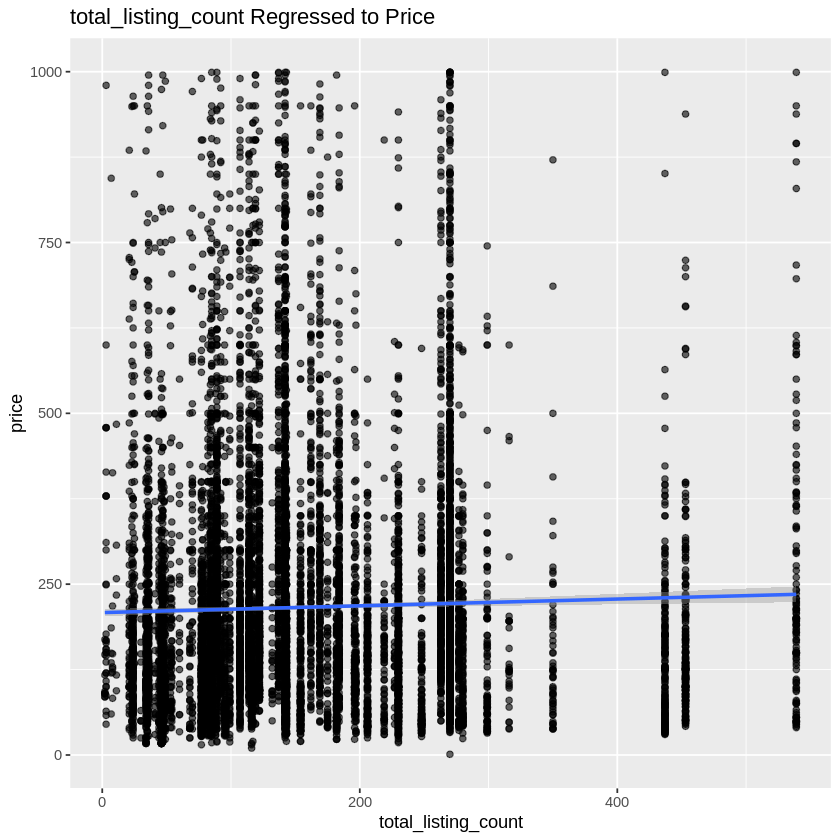

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


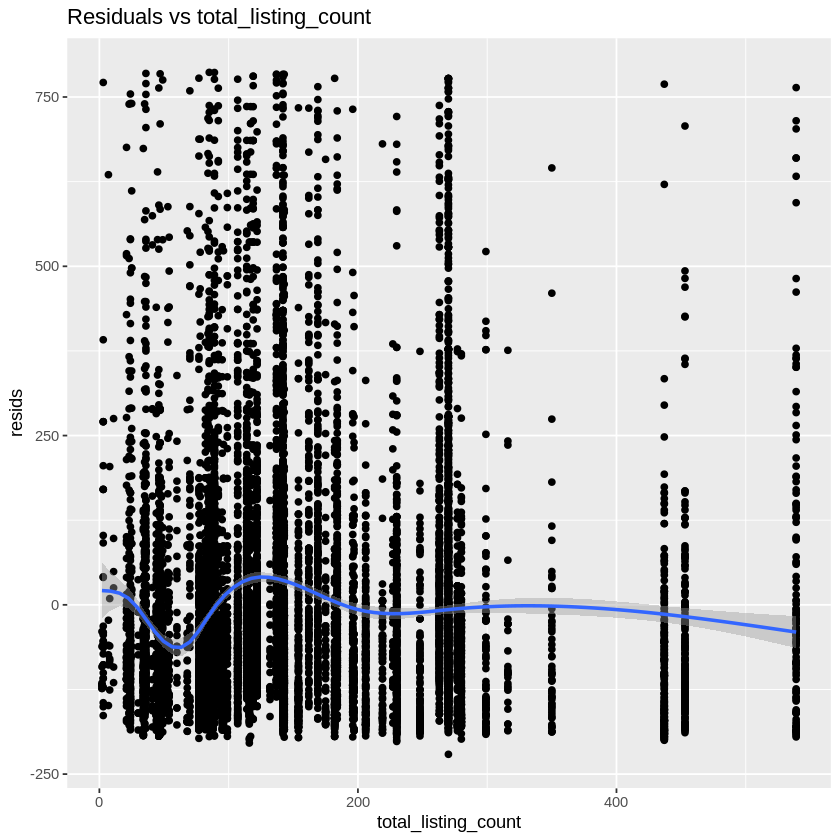

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


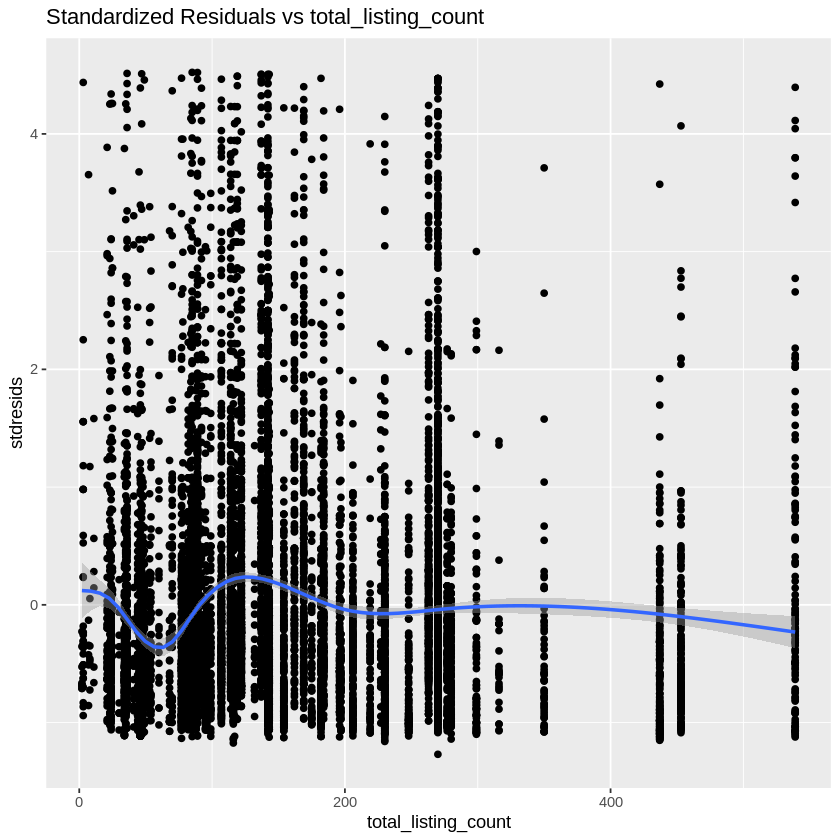

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


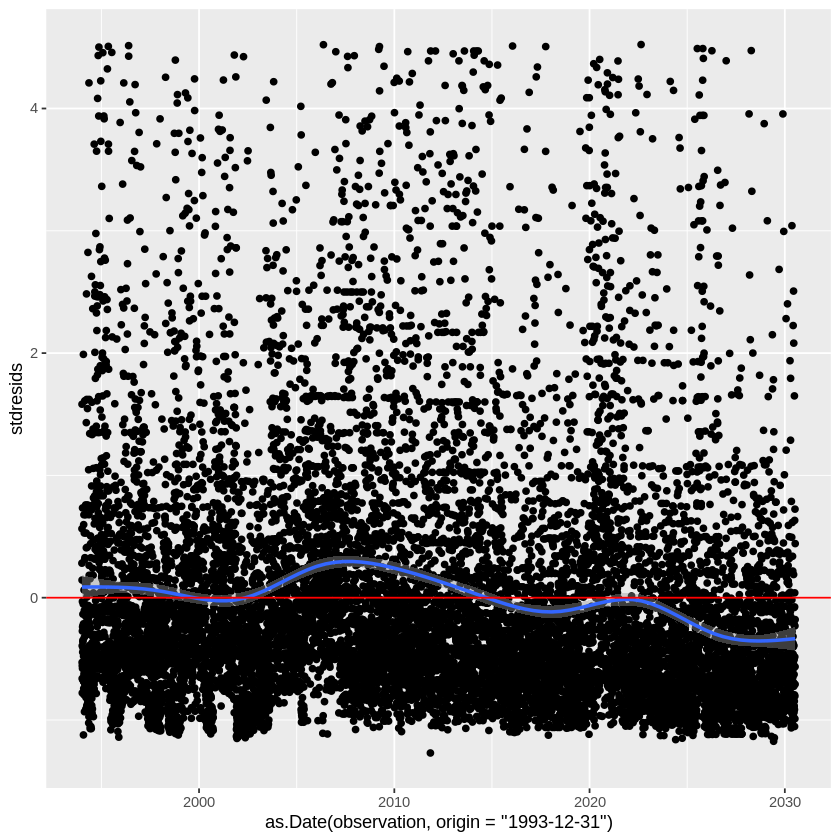

[1] 0.1004644


`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


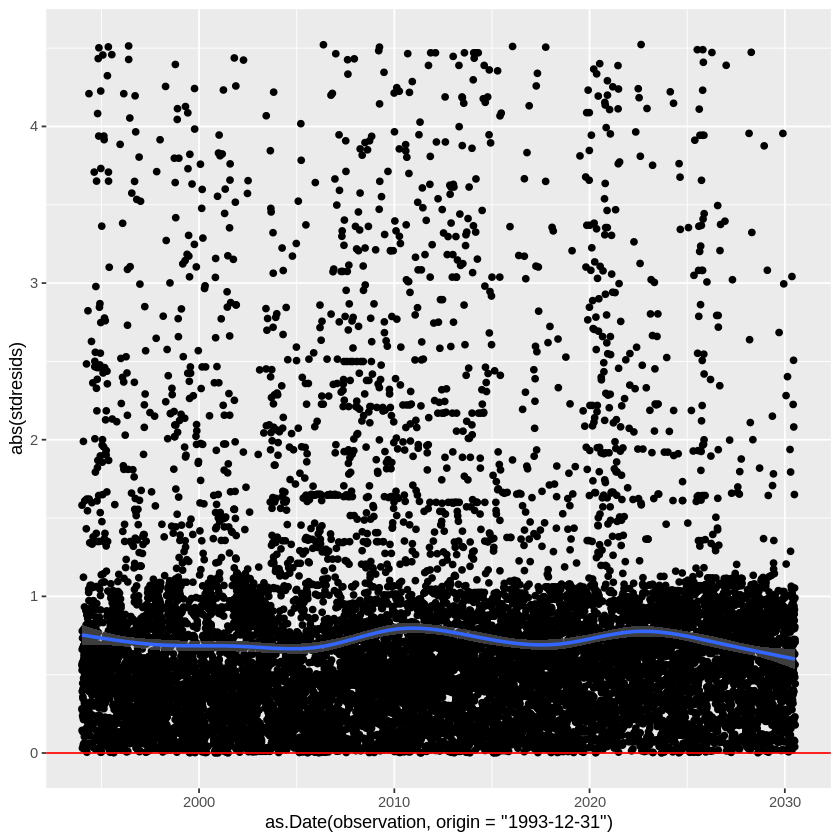

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


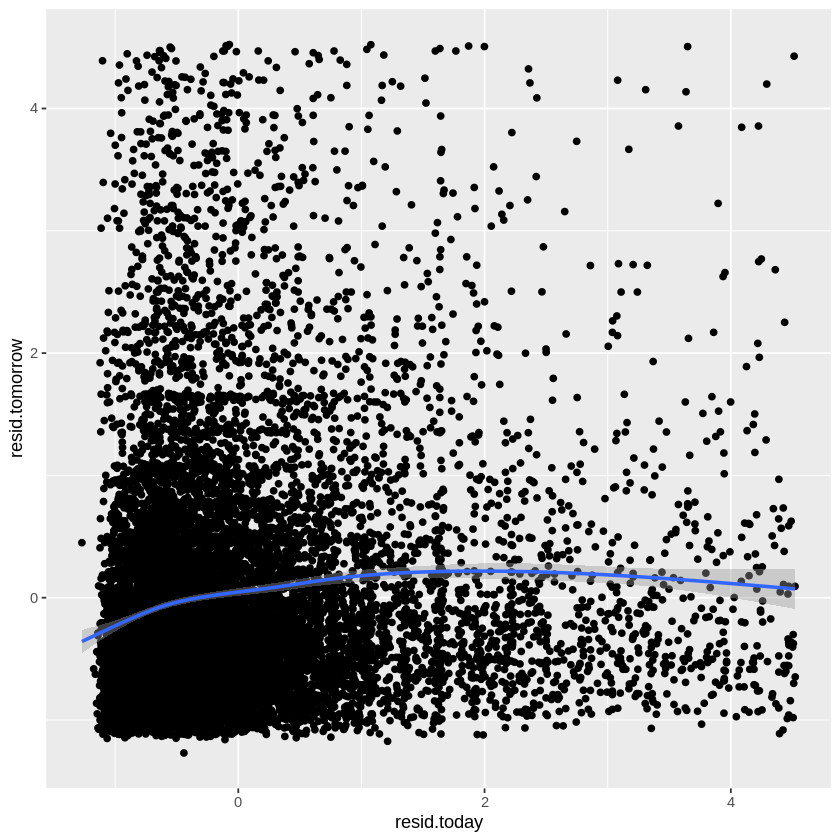

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


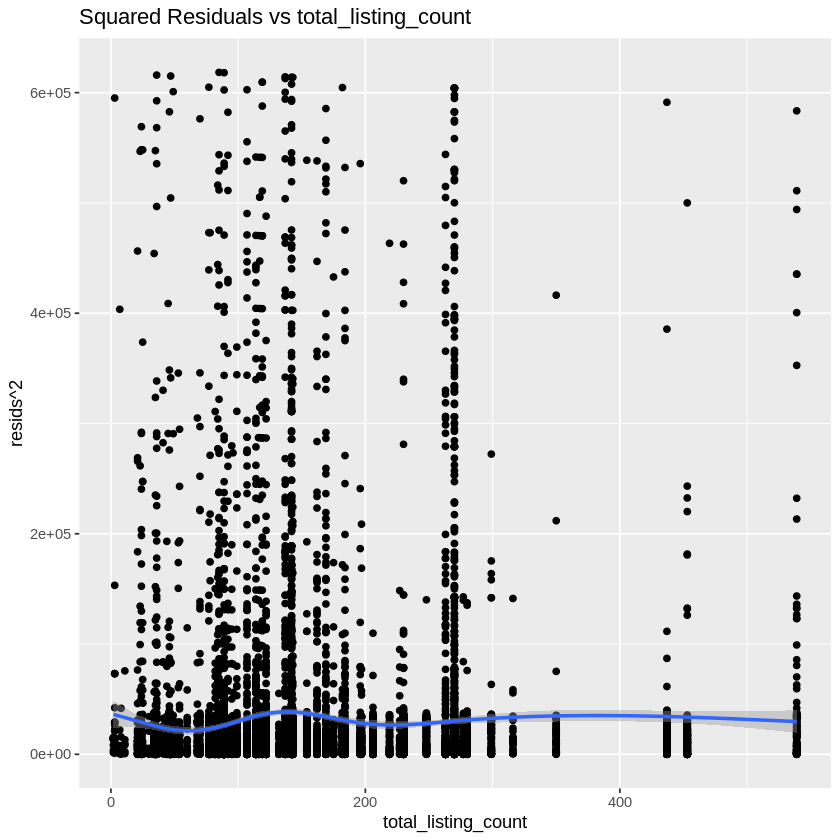

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


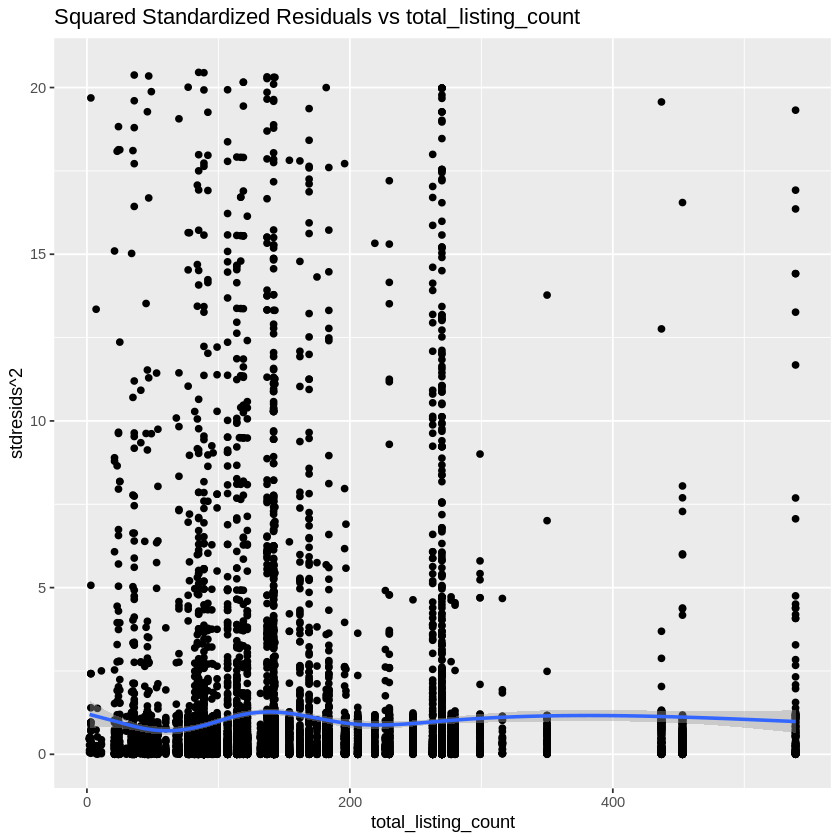

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


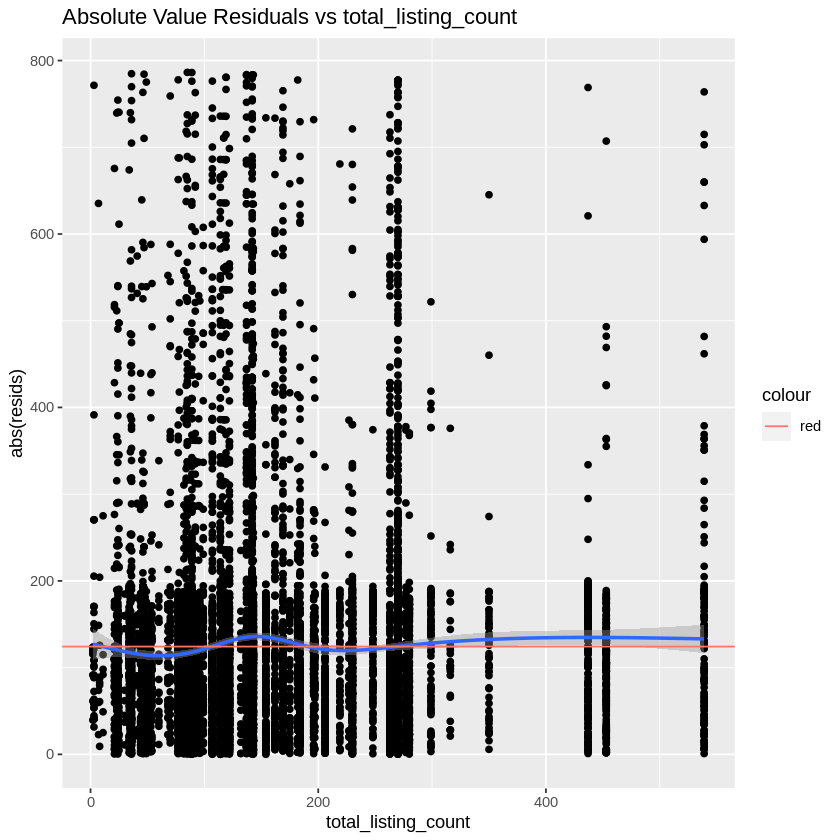

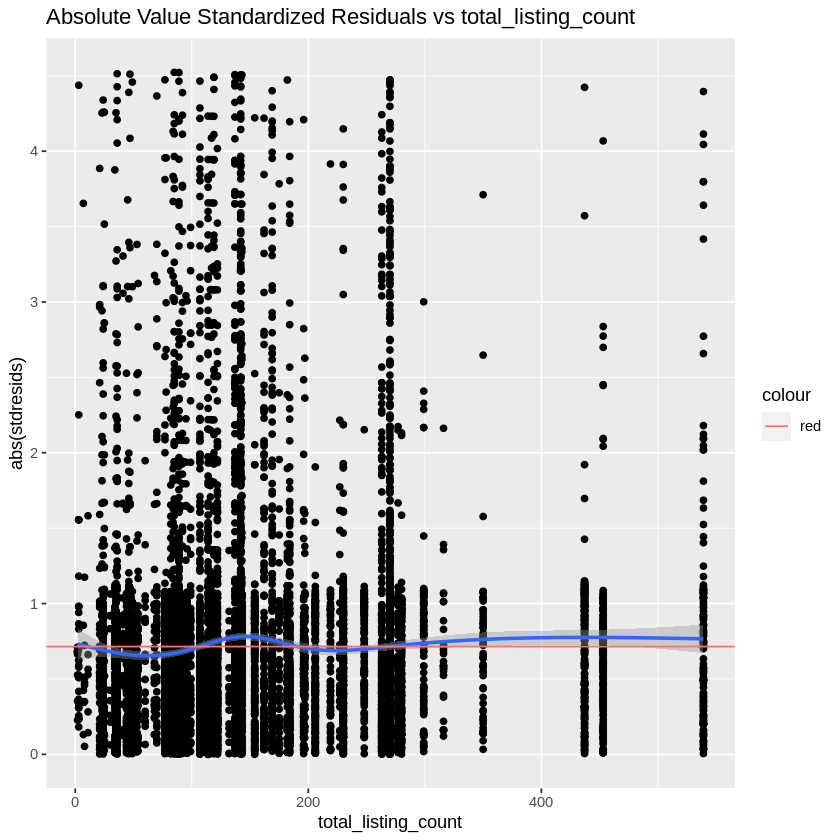

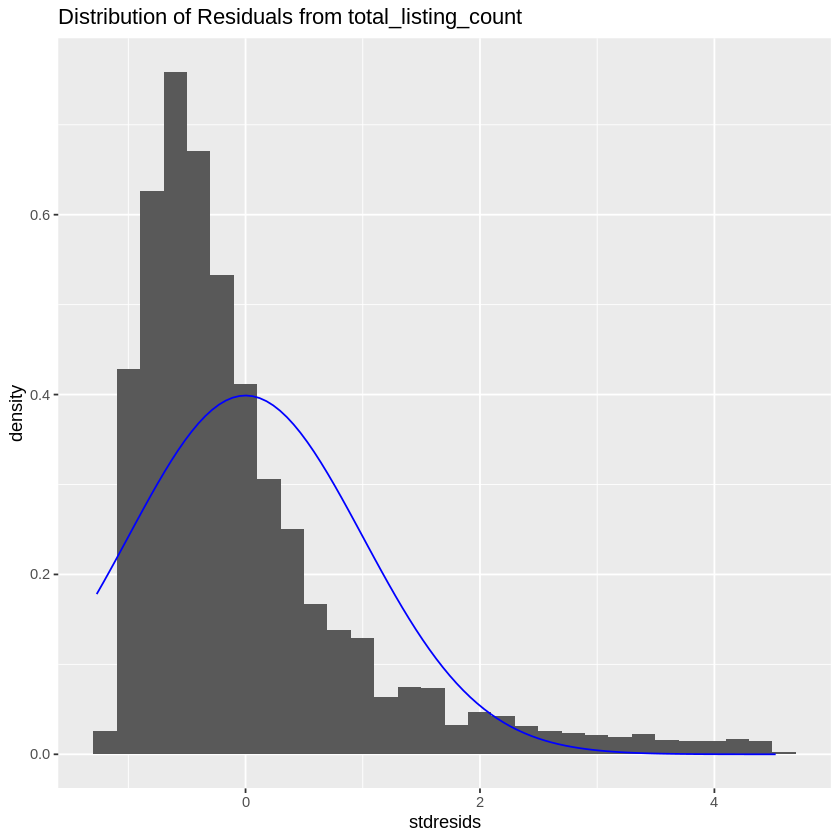

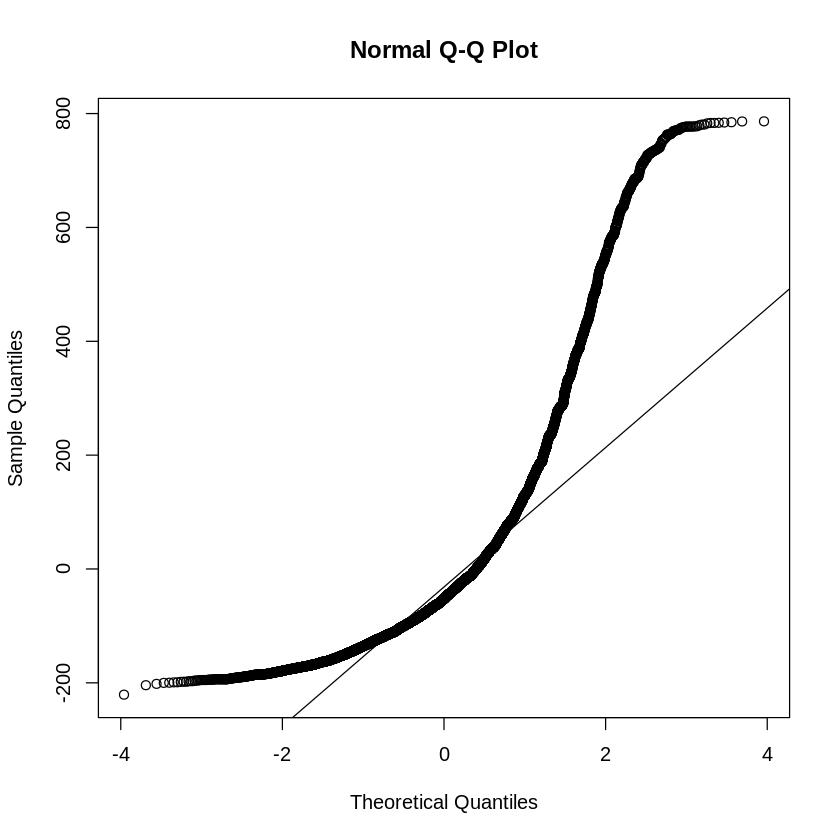

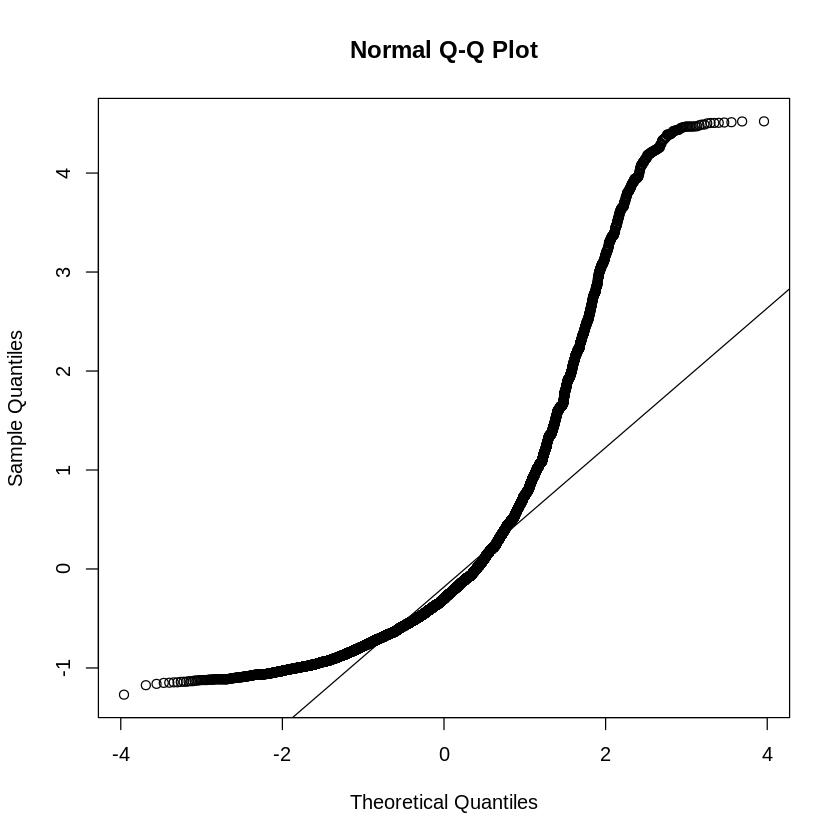

In [ ]:
linear_diagnostics(num.df.listings, total_listing_count, price)

This model behaves almost identitcally to median_price_SQFT, as a result please refer to the diagnostics from that model for explanation of this one. 

In [ ]:
model_summaries(num.df.listings, number_of_reviews, price)

[1] "Linear Model"

Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-221.18 -114.03  -49.04   51.96  793.67 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)       222.4729     1.7291 128.666  < 2e-16 ***
unlist(new.df[1])  -0.1476     0.0200  -7.381 1.66e-13 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 173.6 on 13342 degrees of freedom
Multiple R-squared:  0.004067,	Adjusted R-squared:  0.003992 
F-statistic: 54.48 on 1 and 13342 DF,  p-value: 1.662e-13

[1] " "
[1] " "
[1] "Squared Model"

Call:
lm(formula = unlist(new.df[2]) ~ poly((unlist(new.df[1])), 2), 
    data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-220.91 -114.16  -49.25   51.95  792.76 

Coefficients:
                               Estimate Std. Error t value Pr(>|t|)    
(Intercept)                     216.161      1.503 143.831  < 2e-1

There is a very limited improvement across all models from the linear model.  The linear model is the simplest and as a result that may be the best choice for interpretation.  Note, none of the R^2 values for any of the models are (greater than 0.01), as a result this is likely a poor individual predictor of price by itself, but may be important to add to a larger model. 


Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-221.18 -114.03  -49.04   51.96  793.67 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)       222.4729     1.7291 128.666  < 2e-16 ***
unlist(new.df[1])  -0.1476     0.0200  -7.381 1.66e-13 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 173.6 on 13342 degrees of freedom
Multiple R-squared:  0.004067,	Adjusted R-squared:  0.003992 
F-statistic: 54.48 on 1 and 13342 DF,  p-value: 1.662e-13



`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


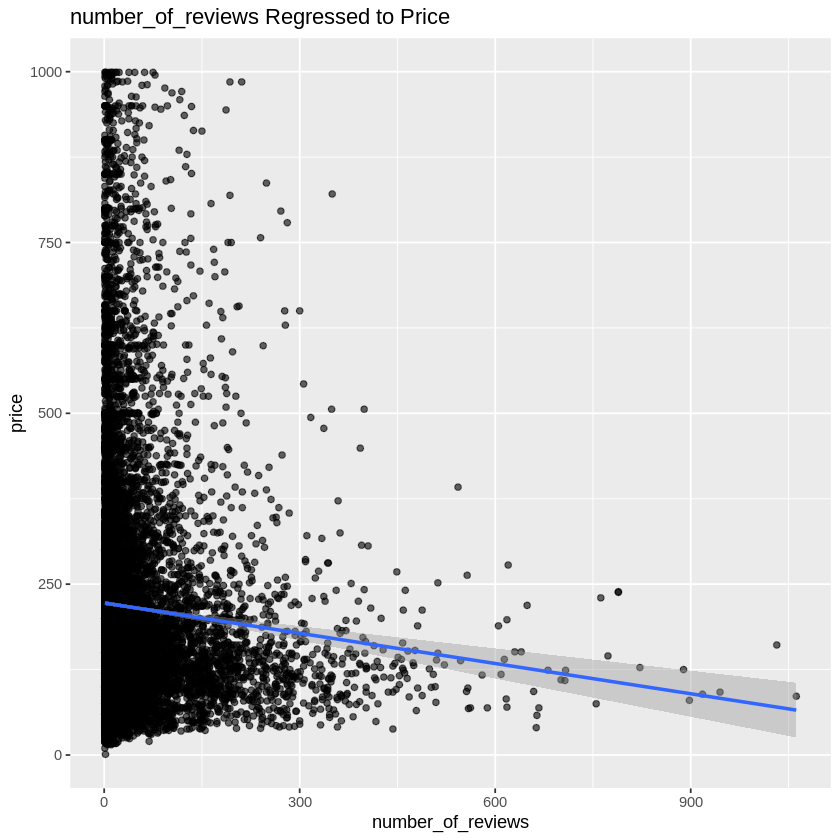

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


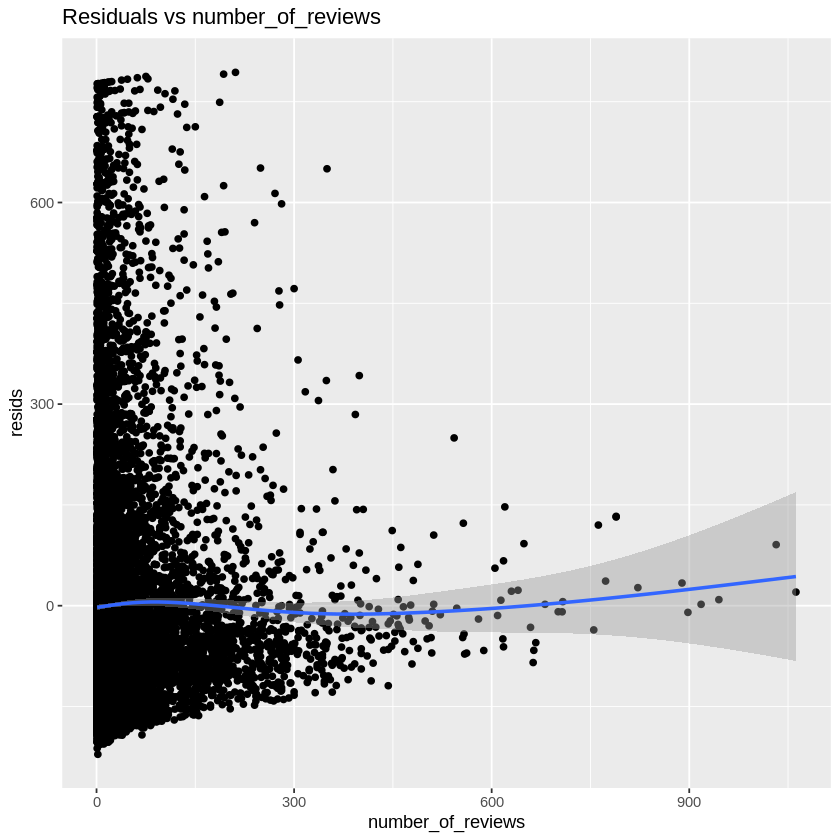

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


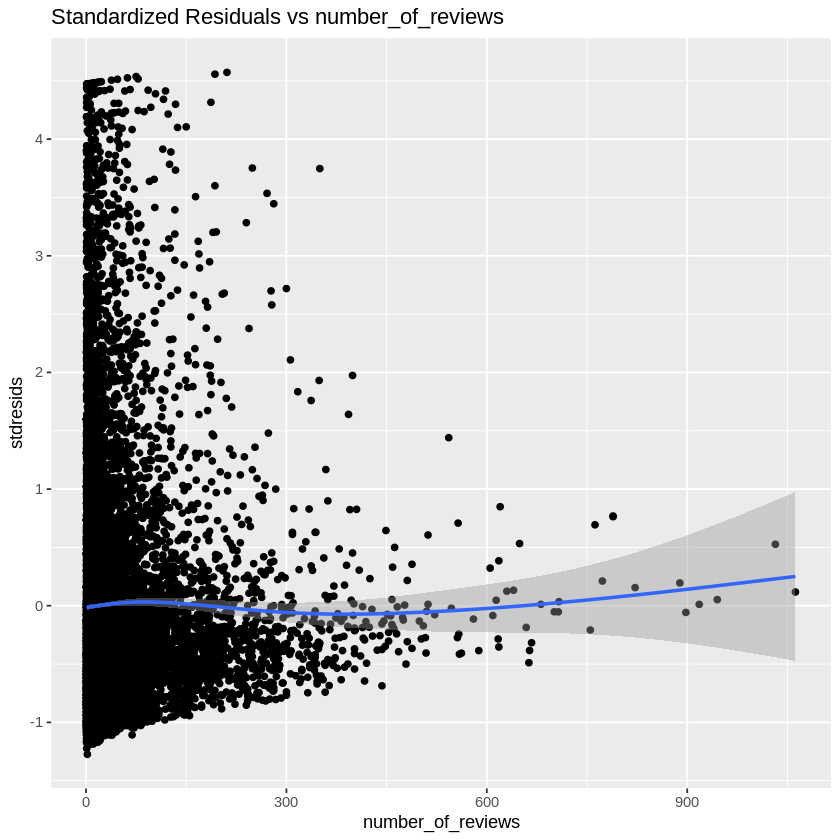

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


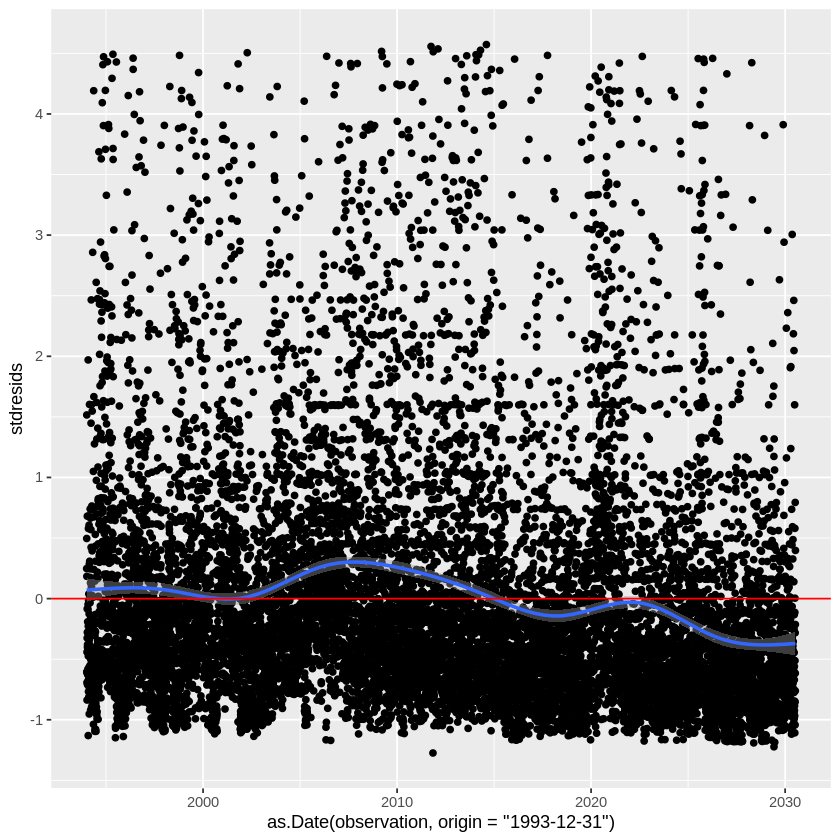

[1] 0.1043173


`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


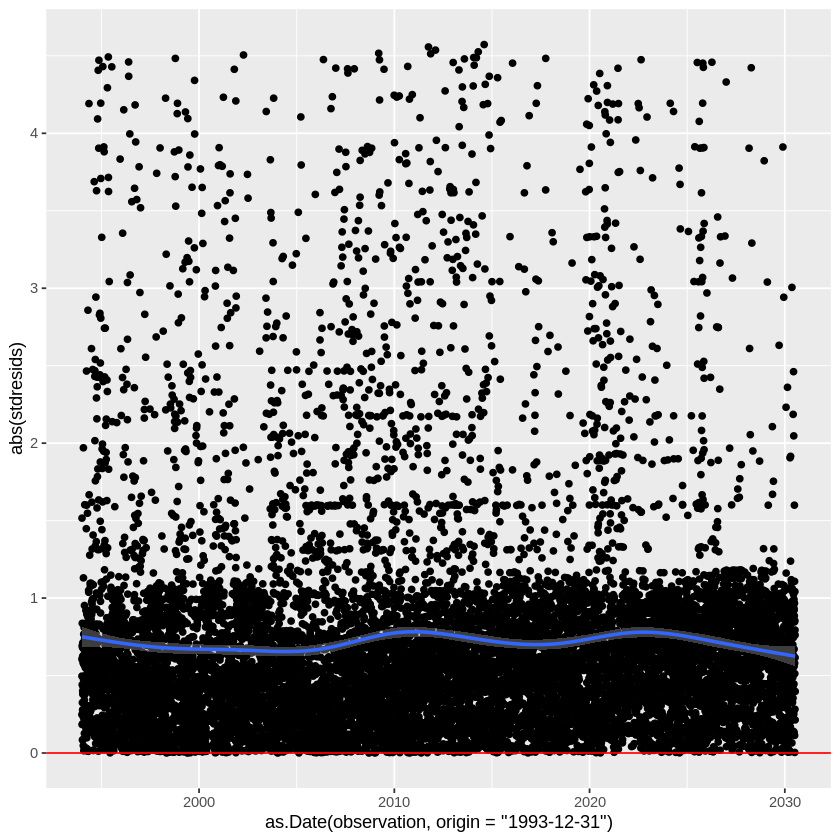

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


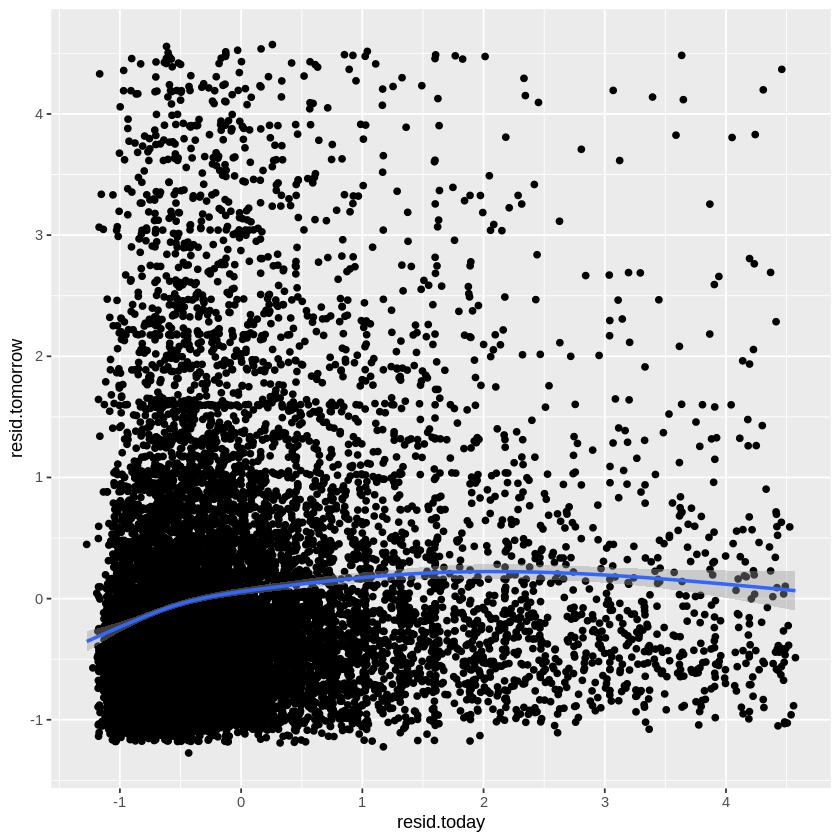

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


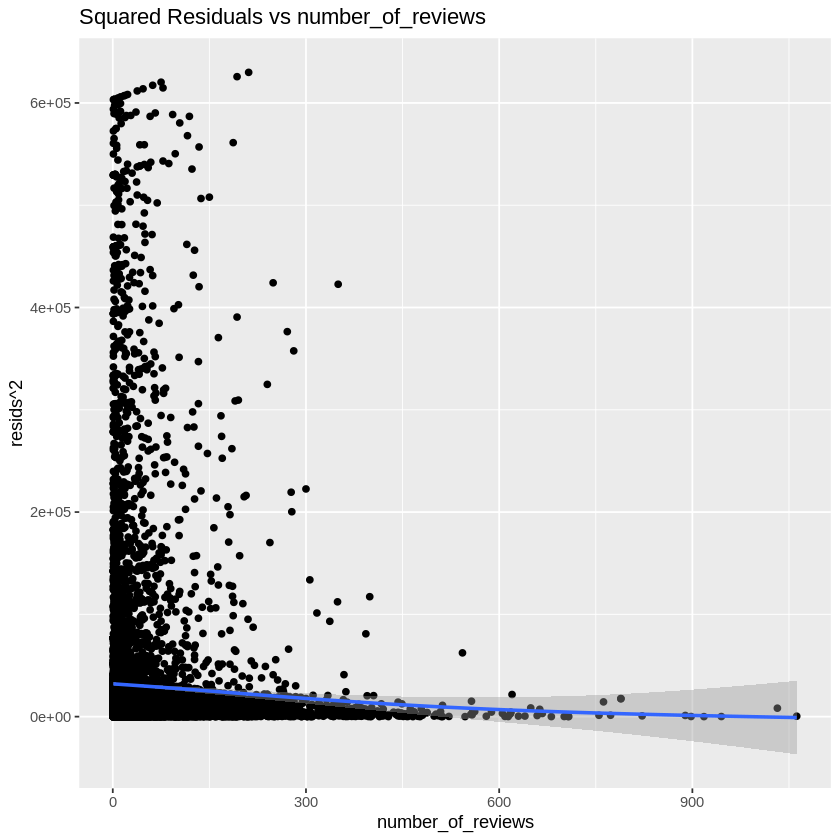

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


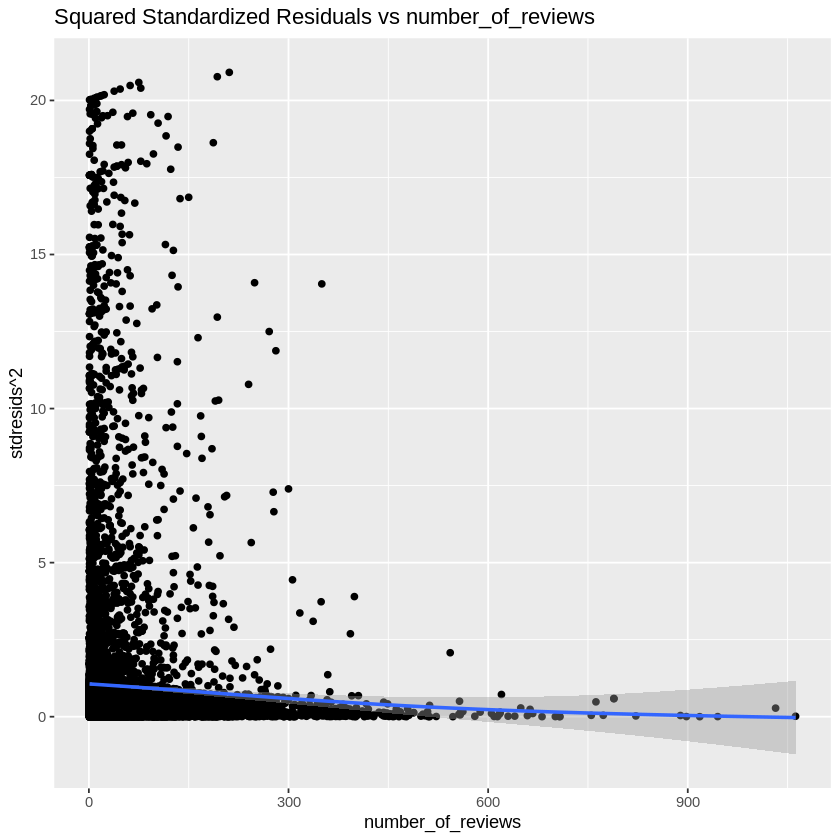

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


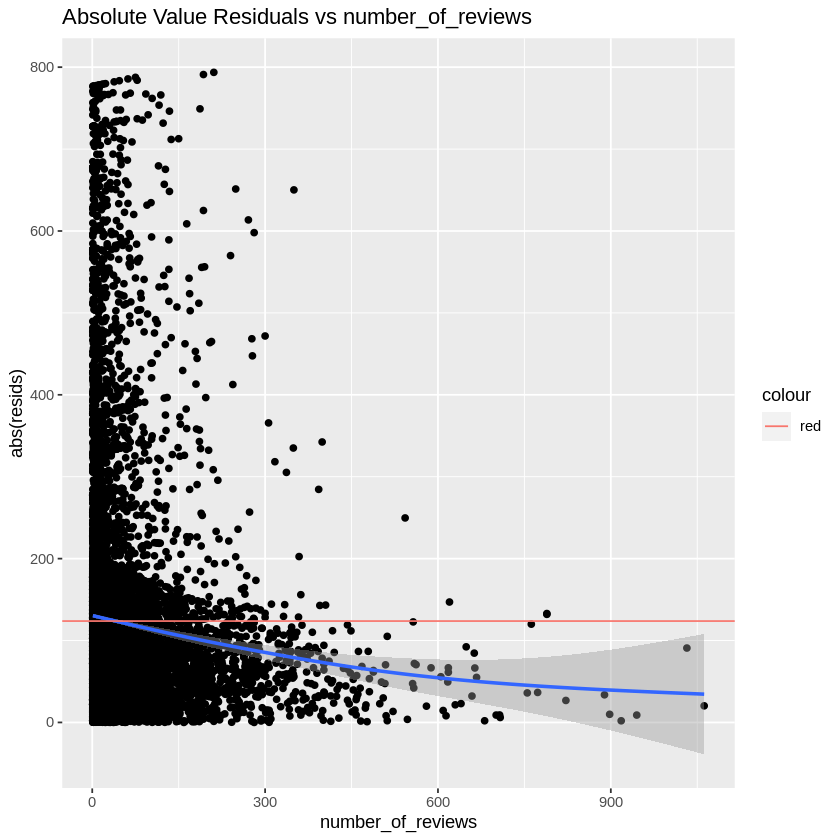

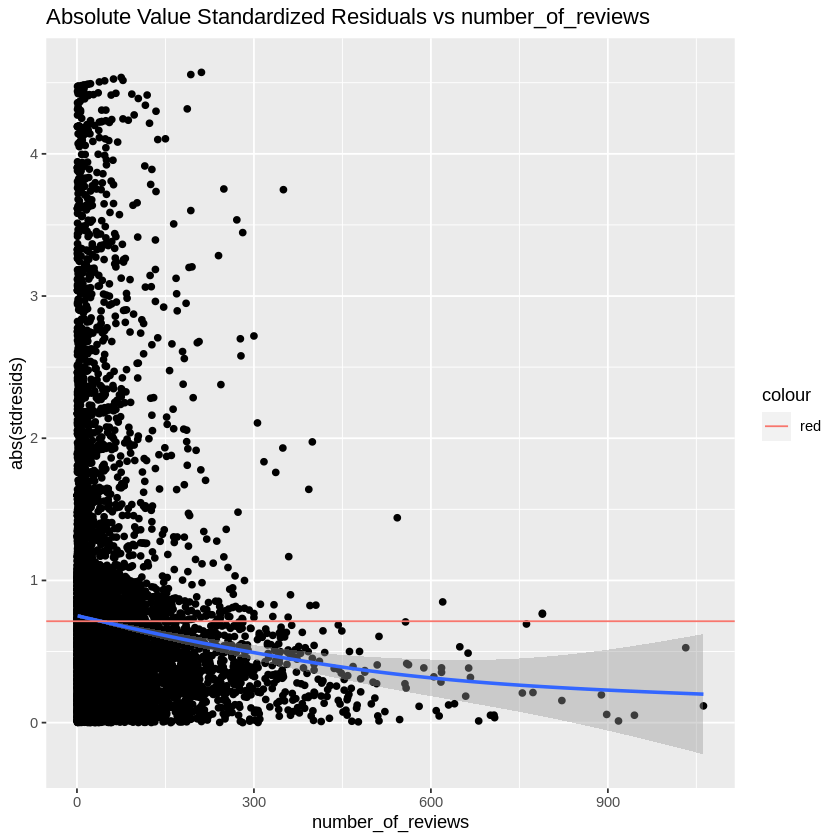

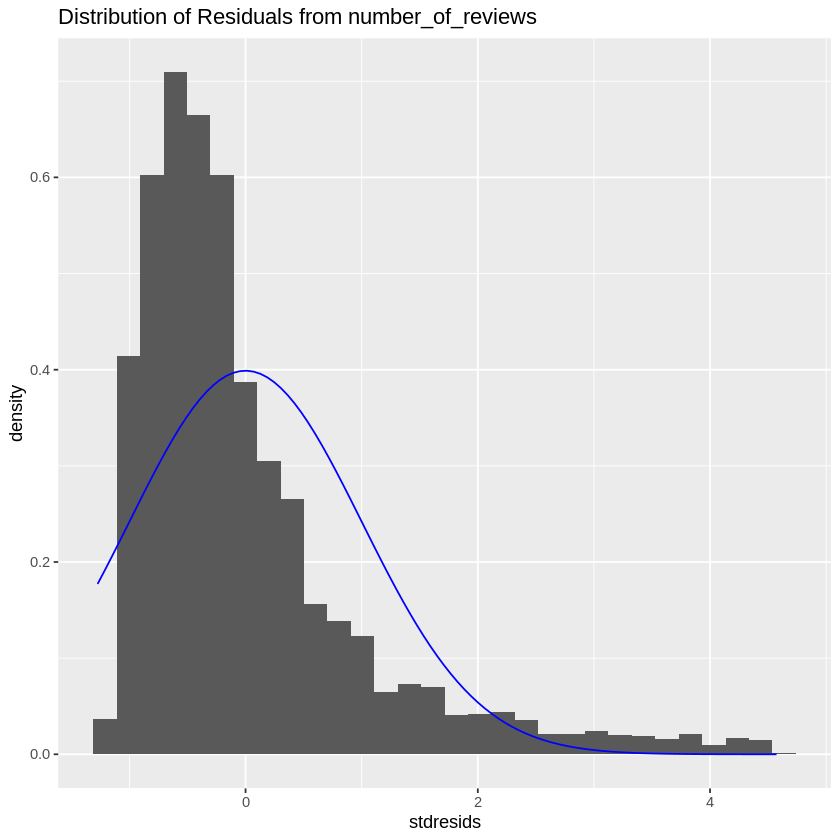

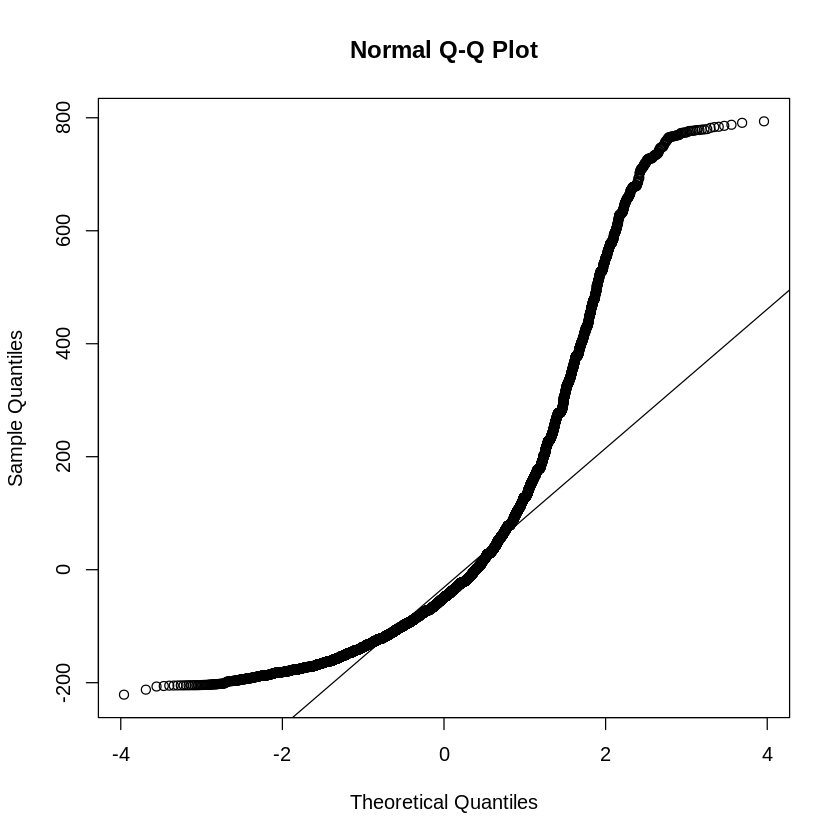

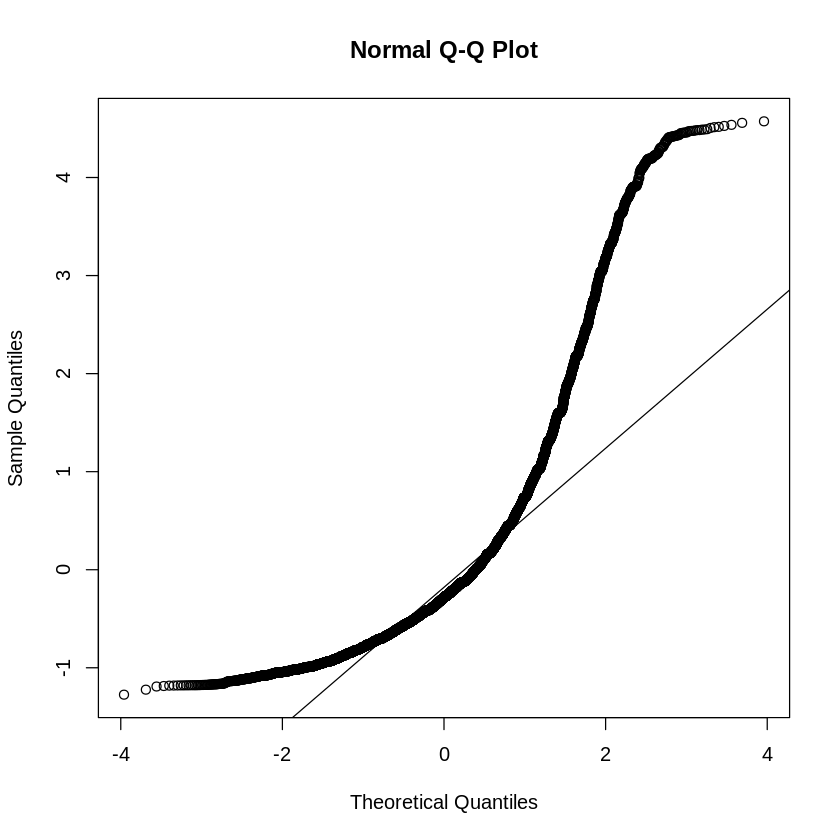

In [ ]:
linear_diagnostics(num.df.listings, number_of_reviews, price)

The data is highly highly centered to the low end of number of reviews, as such, there is a lot of noise.  In general the model behaves similarly to median_price_SQFT and so please refer to that for description of the diagnostics

In [ ]:
model_summaries(num.df.listings, review_scores_rating, price)

[1] "Linear Model"

Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-219.83 -114.23  -51.83   51.07  800.66 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        108.373     15.231   7.115 1.17e-12 ***
unlist(new.df[1])   22.491      3.162   7.112 1.20e-12 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 173.6 on 13342 degrees of freedom
Multiple R-squared:  0.003777,	Adjusted R-squared:  0.003702 
F-statistic: 50.58 on 1 and 13342 DF,  p-value: 1.204e-12

[1] " "
[1] " "
[1] "Squared Model"

Call:
lm(formula = unlist(new.df[2]) ~ poly((unlist(new.df[1])), 2), 
    data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-224.99 -112.93  -51.90   50.67  823.64 

Coefficients:
                              Estimate Std. Error t value Pr(>|t|)    
(Intercept)                    216.161      1.501 144.013  < 2e-16 

There is a very limited improvement across all models from the linear model.  The linear model is the simplest and as a result that may be the best choice for interpretation.  Note, none of the R^2 values for any of the models are (greater than 0.01), as a result this is likely a poor individual predictor of price by itself, but may be important to add to a larger model. 


Call:
lm(formula = unlist(new.df[2]) ~ unlist(new.df[1]), data = new.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-219.83 -114.23  -51.83   51.07  800.66 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        108.373     15.231   7.115 1.17e-12 ***
unlist(new.df[1])   22.491      3.162   7.112 1.20e-12 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 173.6 on 13342 degrees of freedom
Multiple R-squared:  0.003777,	Adjusted R-squared:  0.003702 
F-statistic: 50.58 on 1 and 13342 DF,  p-value: 1.204e-12



`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


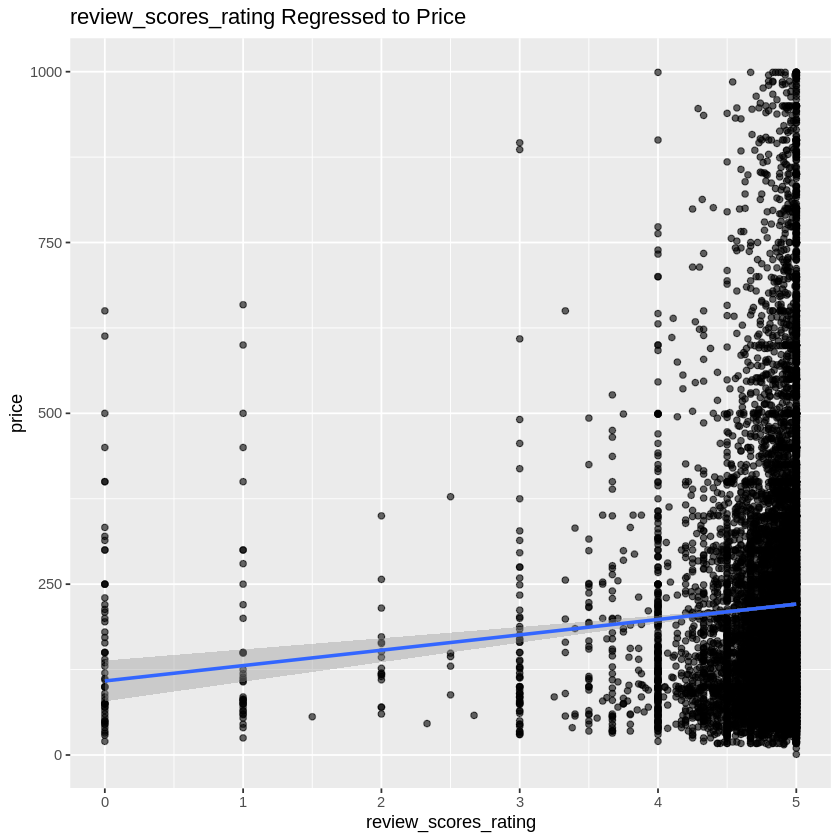

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


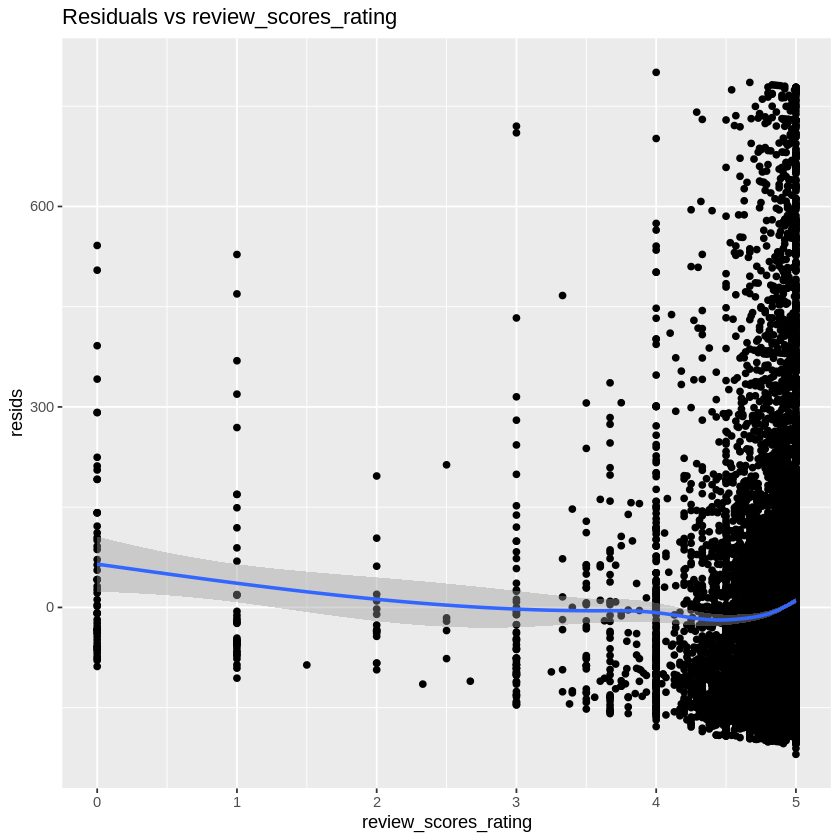

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


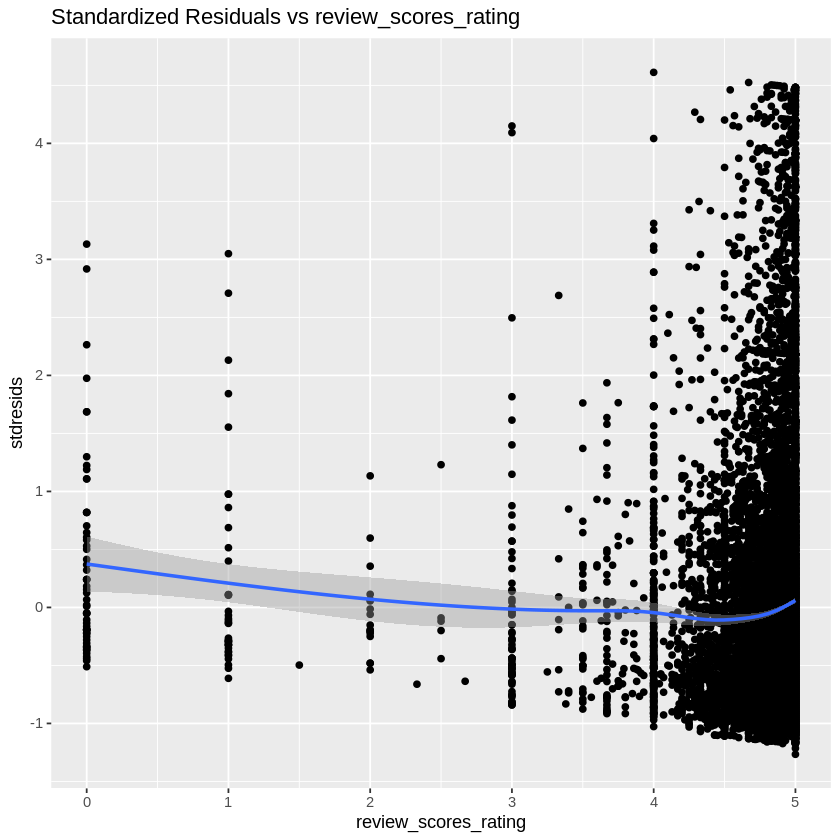

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


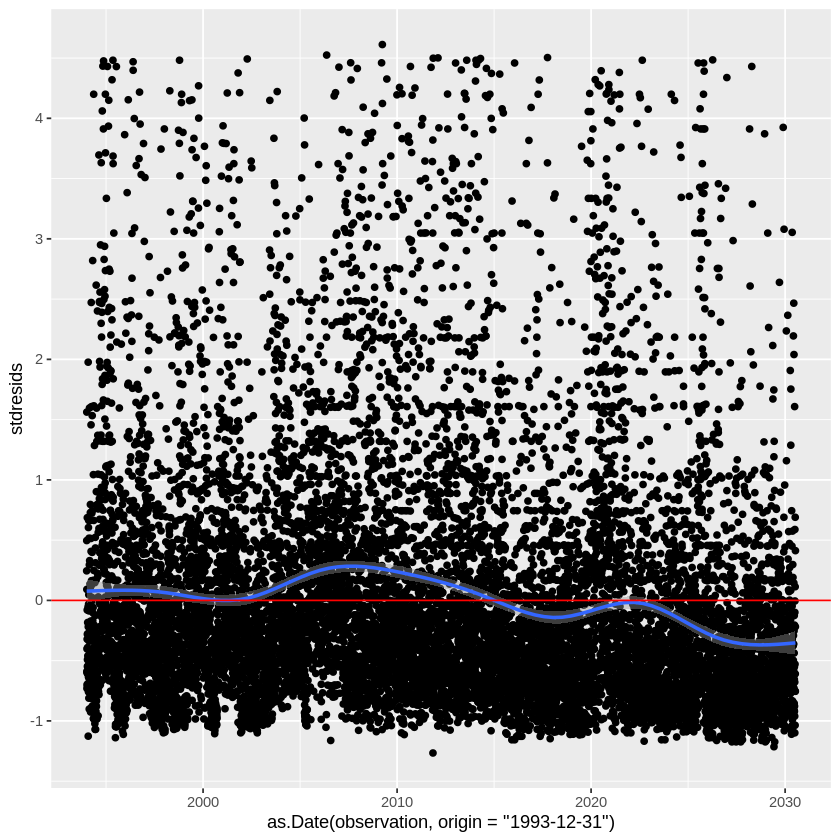

[1] 0.09982595


`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


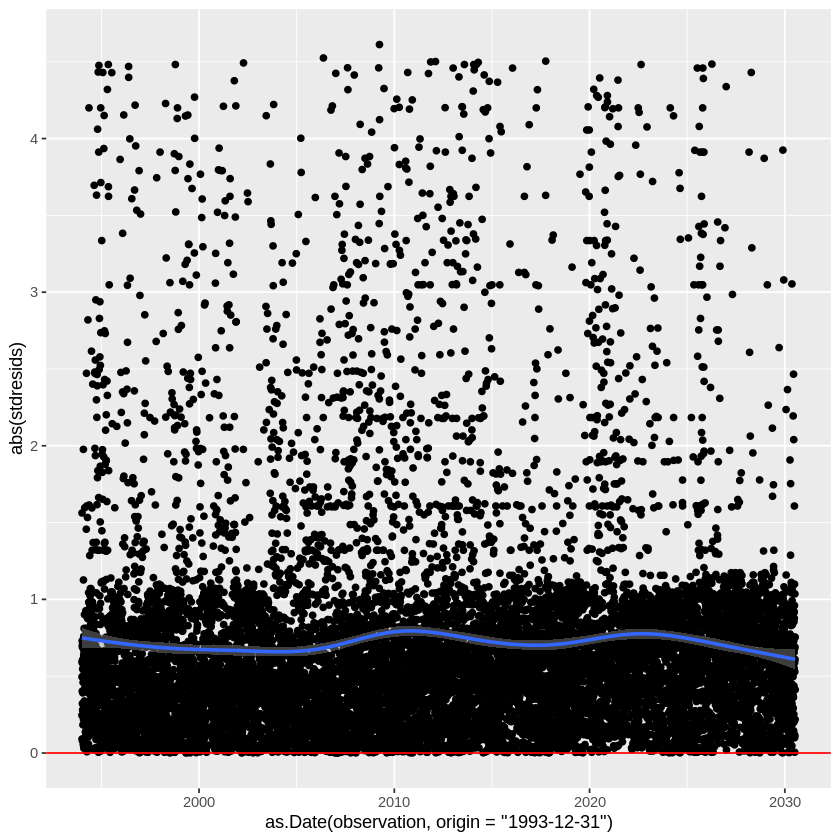

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


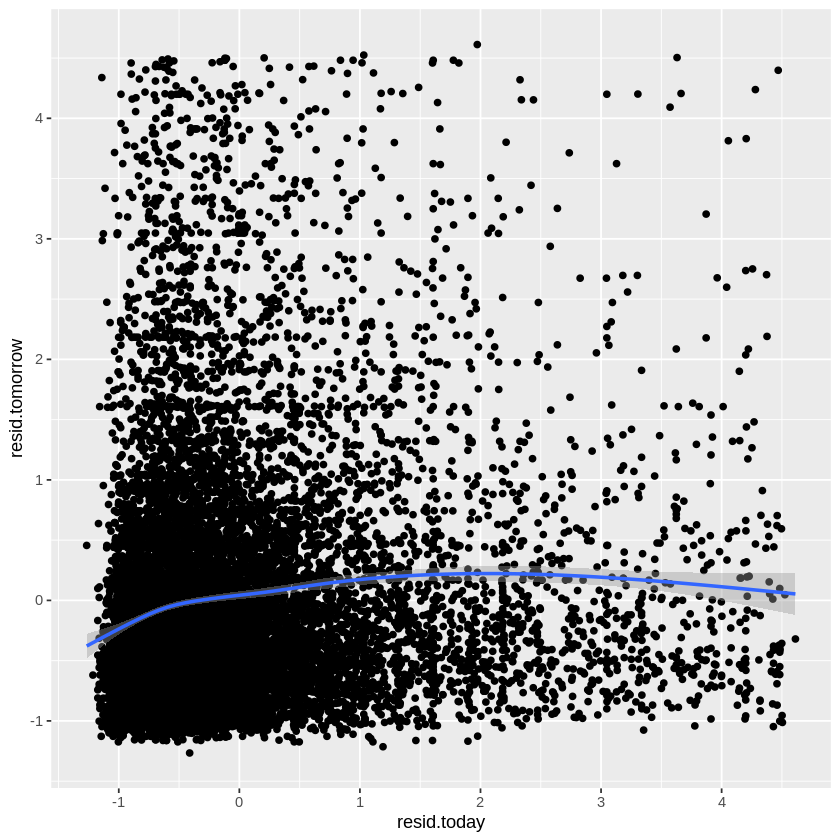

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


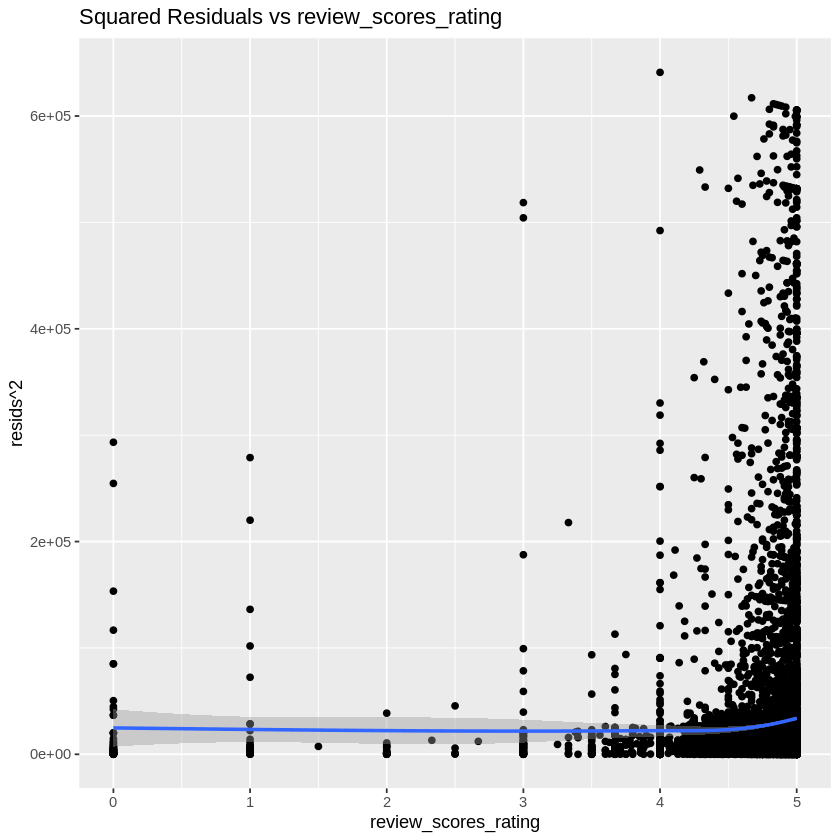

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


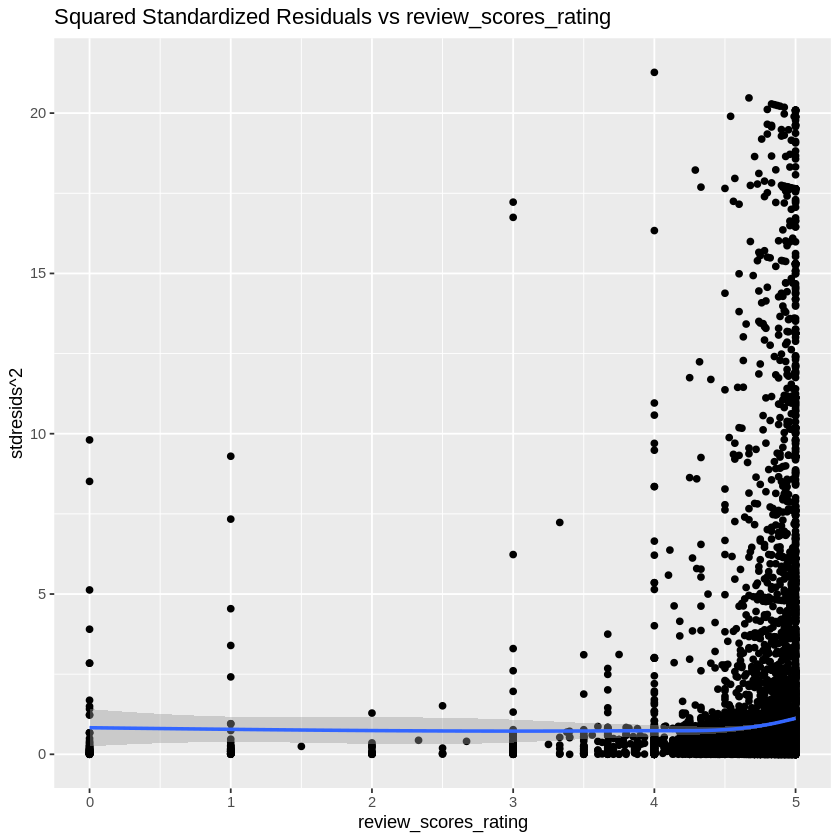

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


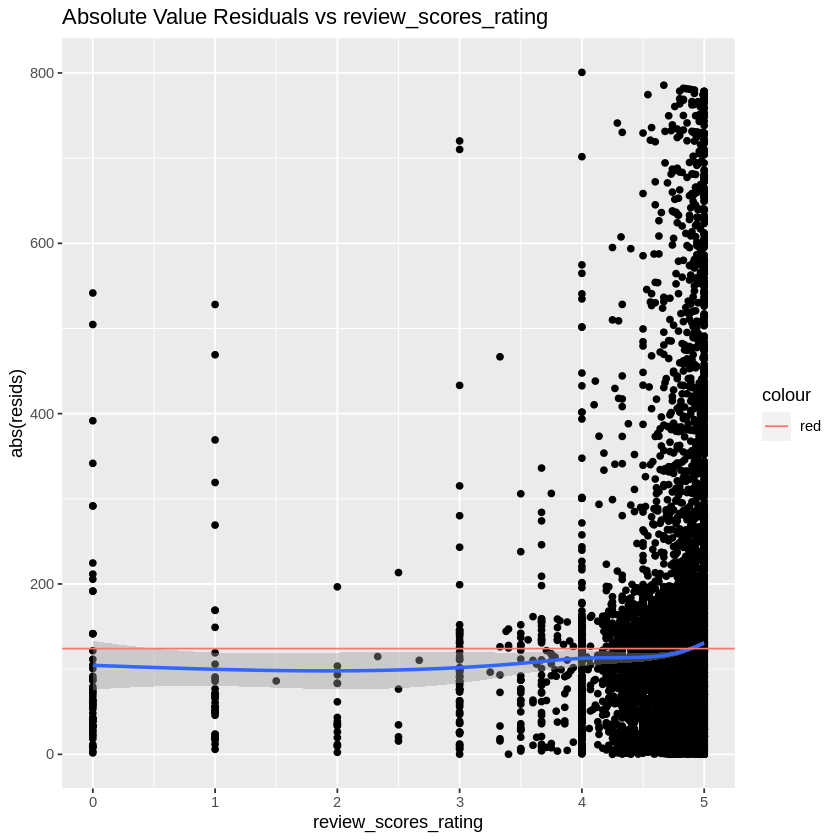

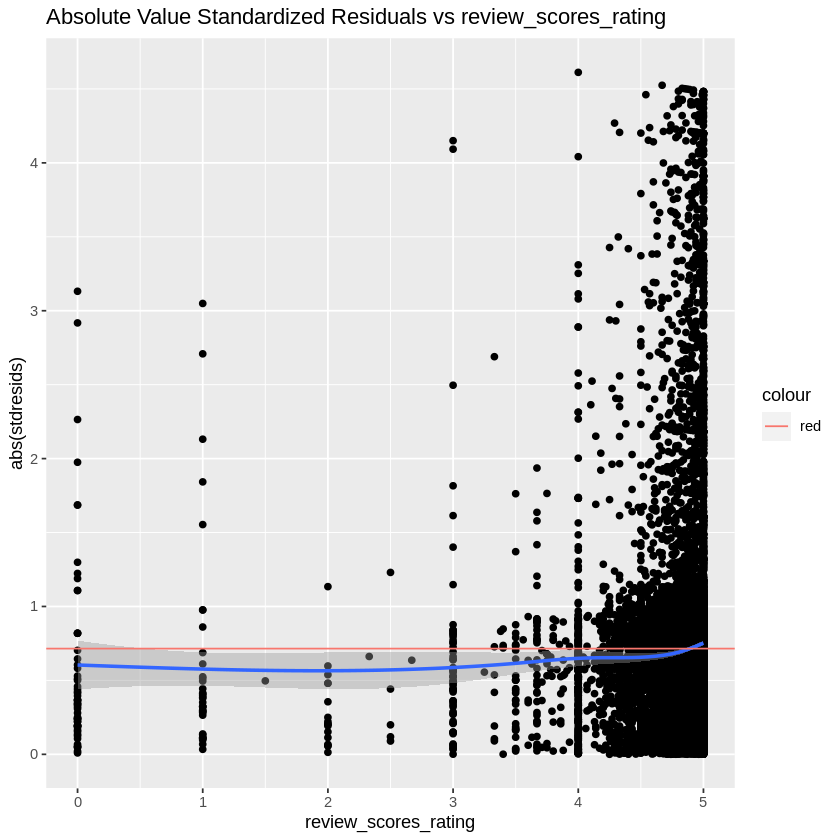

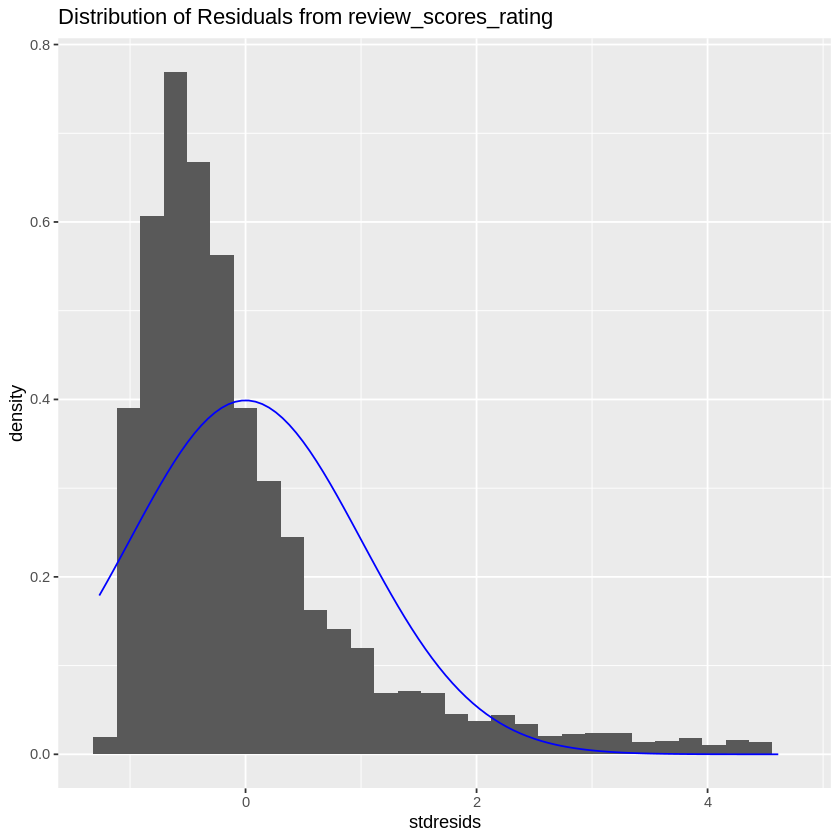

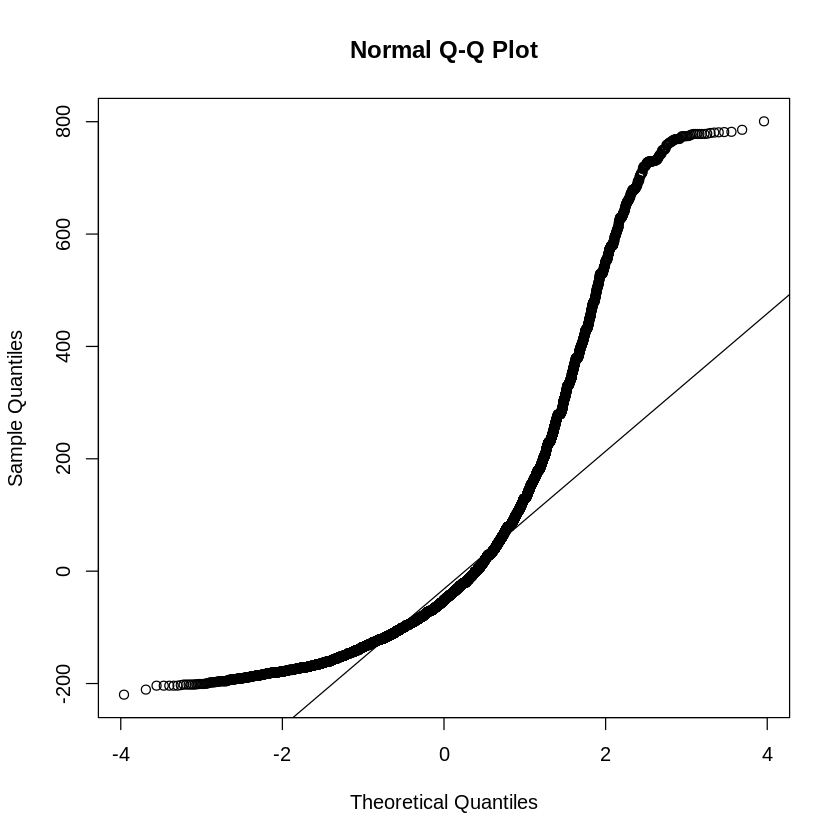

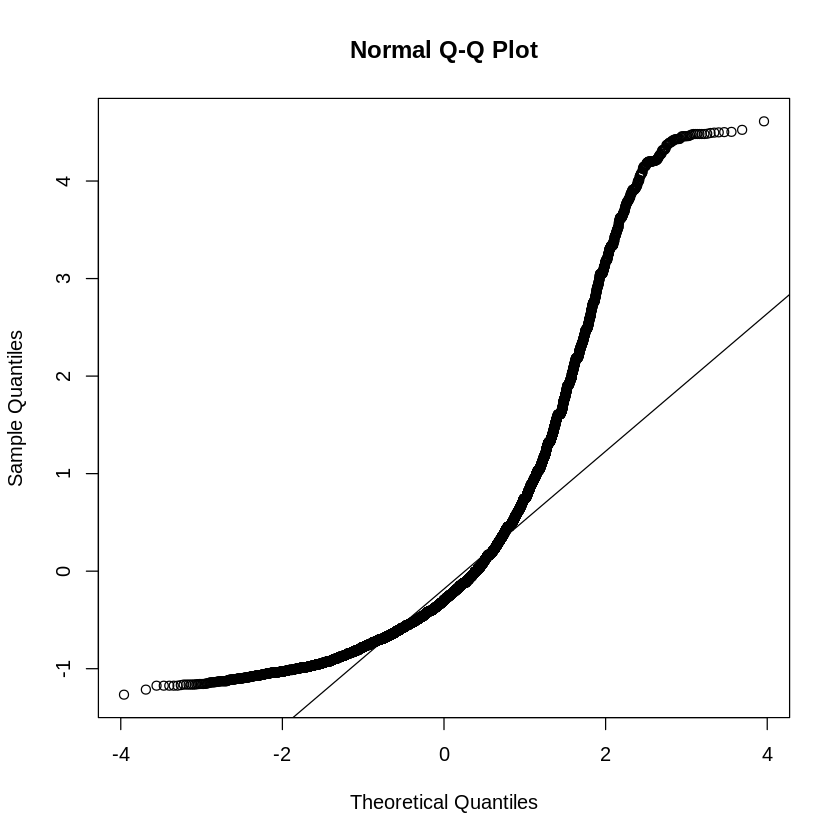

In [ ]:
linear_diagnostics(num.df.listings, review_scores_rating, price)

The data is highly highly centered to the high end of review scores, as such, there is a lot of noise elsewhere.  In general the model behaves similarly to median_price_SQFT and so please refer to that for description of the diagnostics.

**Multiple Linear Regression**

In [ ]:
summary(lm(price ~ beds + bedrooms + accommodates + factor(downtown), data = df_listings))


Call:
lm(formula = price ~ beds + bedrooms + accommodates + factor(downtown), 
    data = df_listings)

Residuals:
    Min      1Q  Median      3Q     Max 
-817.65  -70.93  -23.43   37.36  906.38 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)         2.1137     2.2570   0.937    0.349    
beds                5.2793     1.0130   5.212 1.89e-07 ***
bedrooms           49.6121     1.7822  27.838  < 2e-16 ***
accommodates       15.8093     0.7916  19.972  < 2e-16 ***
factor(downtown)1  73.0238     2.5206  28.971  < 2e-16 ***
factor(downtown)2 145.1693     4.5370  31.996  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 132.2 on 16246 degrees of freedom
  (144 observations deleted due to missingness)
Multiple R-squared:  0.4488,	Adjusted R-squared:  0.4486 
F-statistic:  2646 on 5 and 16246 DF,  p-value: < 2.2e-16


In [ ]:
summary(lm(price ~ beds + bedrooms + accommodates + factor(downtown), data = df_listings))


Call:
lm(formula = price ~ beds + bedrooms + accommodates + factor(downtown), 
    data = df_listings)

Residuals:
    Min      1Q  Median      3Q     Max 
-817.65  -70.93  -23.43   37.36  906.38 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)         2.1137     2.2570   0.937    0.349    
beds                5.2793     1.0130   5.212 1.89e-07 ***
bedrooms           49.6121     1.7822  27.838  < 2e-16 ***
accommodates       15.8093     0.7916  19.972  < 2e-16 ***
factor(downtown)1  73.0238     2.5206  28.971  < 2e-16 ***
factor(downtown)2 145.1693     4.5370  31.996  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 132.2 on 16246 degrees of freedom
  (144 observations deleted due to missingness)
Multiple R-squared:  0.4488,	Adjusted R-squared:  0.4486 
F-statistic:  2646 on 5 and 16246 DF,  p-value: < 2.2e-16


In [ ]:
colnames(df_listings)

[1] "zip_code"               "listing_id"             "host_is_superhost"     
 [4] "host_identity_verified" "host_neighbourhood"     "latitude"              
 [7] "longitude"              "property_type"          "accommodates"          
[10] "bedrooms"               "beds"                   "bathrooms"             
[13] "number_of_reviews"      "review_scores_rating"   "price"                 
[16] "shared_bath"            "pool"                   "fireplace"             
[19] "jacuzzi"                "self_checkin"           "parking"               
[22] "lake_access"            "sauna"                  "pets_allowed"          
[25] "washer_dryer"           "gym"                    "median_price_SQFT"     
[28] "total_listing_count"    "property_type_clean"    "downtown"

First, I want to example a medium model with just a few variables

In [ ]:
lm2 = lm(price ~. - zip_code - listing_id - host_neighbourhood - latitude - longitude - property_type - beds, data = df_listings)
summary(lm2)


Call:
lm(formula = price ~ . - zip_code - listing_id - host_neighbourhood - 
    latitude - longitude - property_type - beds, data = df_listings)

Residuals:
    Min      1Q  Median      3Q     Max 
-676.98  -64.42  -11.39   39.28  884.06 

Coefficients:
                                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)                        -208.01491   19.82943 -10.490  < 2e-16 ***
host_is_superhost                    -0.19043    2.62814  -0.072 0.942239    
host_identity_verified                5.42622    3.60126   1.507 0.131906    
accommodates                         12.18746    0.80278  15.182  < 2e-16 ***
bedrooms                             25.89782    2.47267  10.474  < 2e-16 ***
bathrooms                            63.95106    2.60415  24.557  < 2e-16 ***
number_of_reviews                    -0.11071    0.01711  -6.472 1.01e-10 ***
review_scores_rating                 11.95017    2.61229   4.575 4.83e-06 ***
shared_bath                         -11.40

In [ ]:
###############################
#Functions for Model Validation
###############################
kcross_validation = function(k, data, vector_of_model_terms_as_strings){
  
  data_shuffle = mutate(data, fold=cut(seq(1,nrow(data)),breaks=10,labels=FALSE))
  
  #Perform 10 fold cross validation
  result = matrix(NA, k, 1)
  term_str <- paste(model_terms, collapse ="+")
  model_str <- paste("price ~ ",term_str,collapse = "")
  print(term_str)
  for(i in 1:k){
    data_test  <- filter(data_shuffle, fold==i)
    data_train <- filter(data_shuffle, fold!=i)
    
    model = lm(model_str, data=data_train)  
    yhat_test1 = predict(model, newdata = data_test)
    
    result[i,] = c(
      rmspe_small = sqrt( mean( (data_test$price - yhat_test1)^2 ) )
    )
    print(result)
    print(paste("mean error = ", mean(result) ))
    print(paste("sd = error ", sd(result) ))
  }}

In [ ]:
#Reverse Goecoding:
library(devtools)
install_github('mhudecheck/revgeo')

Loading required package: usethis





* checking for file ‘/tmp/RtmpQRLD7Q/remotes49609ff884/mhudecheck-revgeo-5a17dcb/DESCRIPTION’ ... OK
* preparing ‘revgeo’:
* checking DESCRIPTION meta-information ... OK
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
Omitted ‘LazyData’ from DESCRIPTION
* building ‘revgeo_0.13.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

